In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from fenics import *
from mshr import *
from ufl import nabla_grad, nabla_div, grad
from scipy.interpolate import interp2d


In [2]:
nu = 0.01
cDiff = 0.0027
dbar = 1.6925
cS = 0.5
N = 40*3
M = 100
xmax = 1
tol = 1e-10


In [3]:
def fun(x, y, muX, muY, sigma):
    return gaussian2d(x, y, muX, muY, sigma, sigma)


def sqr(x):
    return x * x


def gaussian(x, mu, sigma):
    return 1 / (sigma * np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((x - mu) / sigma) ** 2)


def gaussian2d(x, y, muX, muY, sigmaX, sigmaY):
    return 1 / (sigmaX * sigmaY * np.sqrt(2 * np.pi)) * np.exp(
        -0.5 * (((x - muX) / sigmaX) ** 2 + ((y - muY) / sigmaY) ** 2))

# N: dimension to, M: dimension from
def interpMat2(N, M, mat):
    xx = np.arange(0, 1.0, 1/(N+1))
    yy = np.arange(0, 1.0, 1/(N+1))
    x = np.arange(0, 1.0, 1/M)
    y = np.arange(0, 1.0, 1/M)
    f = interp2d(x,y,mat)
    mat = f(xx,yy)
    mat = mat.T
    mat = mat.reshape(np.prod(mat.shape))
    return mat

# r = Expression('1 + pow(2, x[0])', degree=2)
# a = Expression('0.5 * (1 - x[0]/xmax)', degree=2, xmax=xmax)
# c_k = Expression('x[0]*x[0]', degree=2)


In [4]:
x = np.arange(0, 1.0, 1 / M)
y = np.arange(0, 1.0, 1 / M)
X, Y = np.meshgrid(x, y)
zs = np.array(-fun(np.ravel(X), np.ravel(Y), 0.2, 0.5, 0.15)) * 2
zs += np.array(-fun(np.ravel(X), np.ravel(Y), 0.5, 0.3, 0.1))
zs += np.array(-fun(np.ravel(X), np.ravel(Y), 0.5, 0.7, 0.1))
zs += np.array(-fun(np.ravel(X), np.ravel(Y), 0.8, 0.3, 0.1)) * 1.3
zs += np.array(-fun(np.ravel(X), np.ravel(Y), 0.8, 0.7, 0.1)) * 1.3


[-0.05636164 -0.06146514 -0.06673398 ... -0.18243703 -0.15314594
 -0.12727894]
[0.99892292 0.99882539 0.9987247  ... 0.99651359 0.99707335 0.99756768]


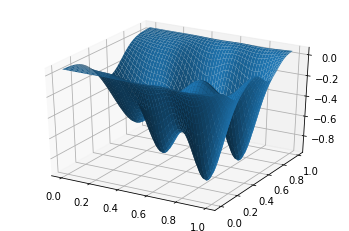

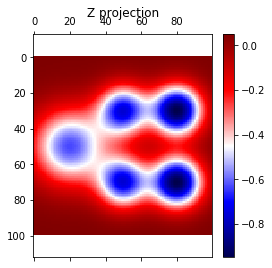

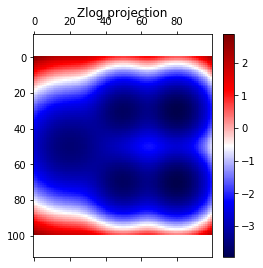

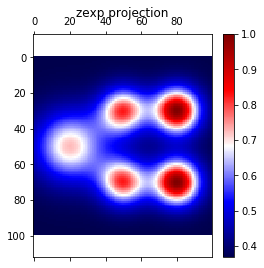

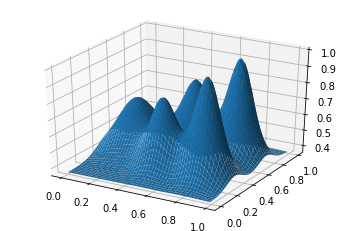

In [5]:
%matplotlib inline
print(zs)
print((zs-min(zs))/-min(zs))
Z = (zs-max(zs))/-min(zs)
Z = Z.reshape(X.shape)
Z +=0.05
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z)
plt.matshow(Z, aspect=1, cmap=plt.get_cmap('seismic'))
plt.title('Z projection')
plt.colorbar()
plt.axis('equal')
plt.show()

zlog = -np.log(np.abs(zs))
zlog = zlog.reshape(X.shape)
plt.matshow(zlog, aspect=1, cmap=plt.get_cmap('seismic'))
plt.title('Zlog projection')
plt.colorbar()
plt.axis('equal')
plt.show()

# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')
# ax.plot_surface(X, Y, zlog)
zexp = np.exp(-((zs-min(zs))/-min(zs)))
zexp = zexp.reshape(X.shape)
plt.matshow(zexp, aspect=1, cmap=plt.get_cmap('seismic'))
plt.title('zexp projection')
plt.colorbar()
plt.axis('equal')
plt.show()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, zexp)


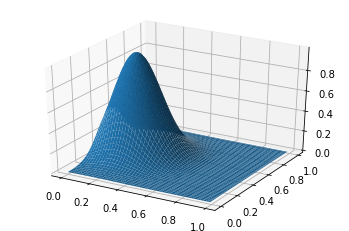

In [6]:
%matplotlib inline
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
x = np.arange(0, 1.0, 1 / M)
y = np.arange(0, 1.0, 1 / M)
X, Y = np.meshgrid(x, y)
ui = np.array(fun(np.ravel(X), np.ravel(Y), 0.2, 0.5, 0.15))
ui = (ui-min(ui))/max(ui)
Ui = ui.reshape(X.shape)
# Z2 = z2.reshape(X.shape)
ax.plot_surface(X, Y, Ui) 
# ax.plot_surface(X, Y, Z2, linewidth=1) 
# ax.plot_wireframe(X, Y, Z) 


In [7]:
parameters['reorder_dofs_serial'] = False
mesh = UnitSquareMesh(N, N)  # 8X8 rectangles, each divided in 2 triangle, hence 128 cells, and 81 (9^2) vertices
Vhat = FunctionSpace(mesh, 'P', 1)  # P returns Lagrangian polynomials, 1 is the degree of the FE
# parameters['reorder_dofs_serial'] = False

(14641,)


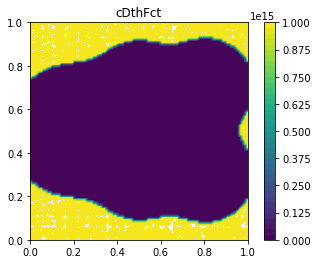

(14641,)


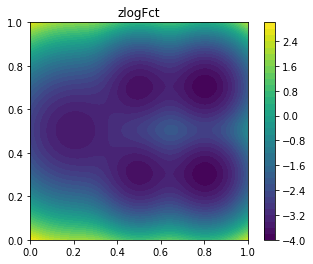

(14641,)


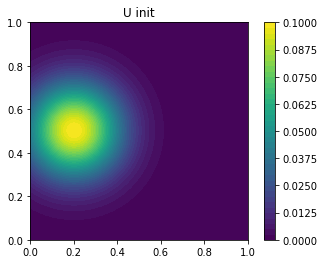

(14641,)


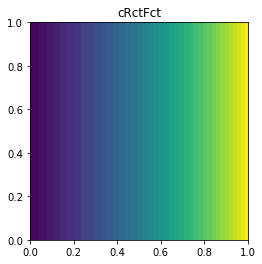

In [109]:
%matplotlib inline
uhmst = zexp.reshape(X.shape)
uhmst[uhmst<0.4]=1e-15
cDth = 1. / uhmst.T
cDthFct = Function(Vhat)
cDthMat = interpMat2(N, M, cDth)
cDthFct.vector()[:] = cDthMat
print(cDthMat.shape)
plt.figure()
p=plot(cDthFct)
plt.colorbar(p)
plt.title('cDthFct')
plt.show()

zlog = -np.log(np.abs(zs))
zlogFct = Function(Vhat)
zlogMat = interpMat2(N, M, zlog)
zlogFct.vector()[:] = zlogMat
print(zlogMat.shape)
plt.figure()
p = plot(zlogFct)
plt.colorbar(p)
plt.title('zlogFct')
plt.show()


# Very basic initial conditon
UiFct = Function(Vhat)
UiMat = interpMat2(N, M, 0.1*Ui.T)
UiFct.vector()[:] = UiMat
print(UiMat.shape)
plt.figure()
p = plot(UiFct)
plt.colorbar(p)
plt.title('U init')
plt.show()


def rct(x_, y_):
    return 1 + 2**x_


cRctMat = np.array(rct(np.ravel(X), np.ravel(Y)))
cRctMat = cRctMat.reshape(X.shape)
# plt.figure()
# plt.matshow(cRctMat)
cRctFct = Function(Vhat)
cRctMat = interpMat2(N, M, cRctMat.T)
cRctFct.vector()[:] = cRctMat
print(cRctMat.shape)
plt.figure()
plot(cRctFct)
plt.title('cRctFct')
plt.show()




In [111]:
def R1(u_):
    uv = u_.vector().get_local()
    cDth = cDthFct.vector().get_local()
    cRct = cRctFct.vector().get_local()
    temp = (cDth * uv)
    temp[temp > dbar] = dbar
    temp = (1 - temp)*cRct
    return temp


def v1():
    return zlogFct


def v2(u_):
    cAdv = cDthFct.vector().get_local()
    cA = cAFct.vector().get_local()
    cRct = cRctFct.vector().get_local()
    return cA*(1-cAdv)*cRct


def boundary(x, on_boundary):
    return on_boundary

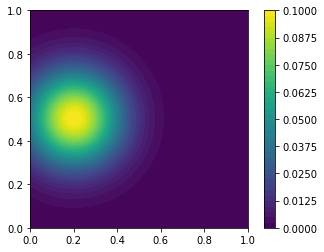

t = 0.00: error = 0.738
0.5661851555185711
-0.7381418296168127


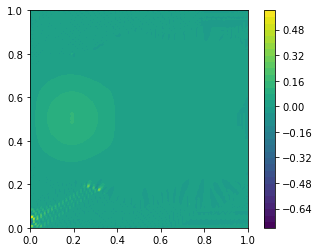

t = 0.00: error = 0.738
0.1473595088683659
-0.04719937347764414


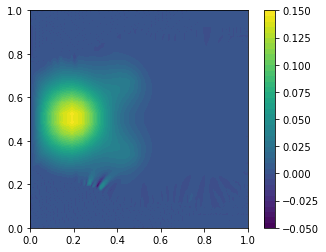

t = 0.01: error = 0.0427
0.17746953193482984
-0.025900946955926856


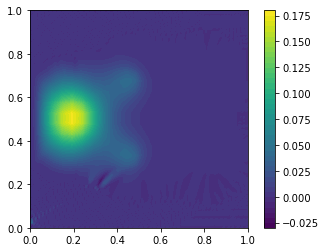

t = 0.01: error = 0.0363
0.2126730549850401
-0.010854941285459826


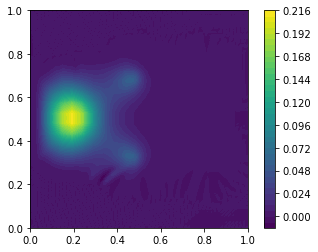

t = 0.01: error = 0.0423
0.25445984000532307
-0.007413631818653071


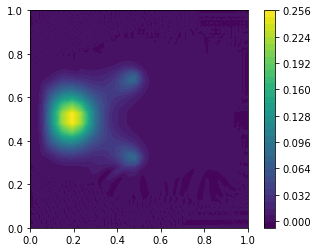

t = 0.01: error = 0.05
0.3043634047229362
-0.005075294625251845


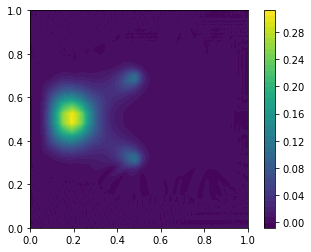

t = 0.01: error = 0.0588
0.36317705883817875
-0.0035800561700376015


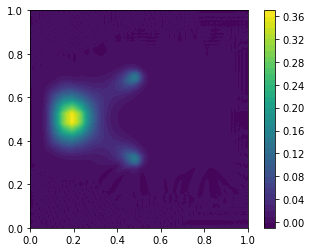

t = 0.02: error = 0.0688
0.4319437394639888
-0.0025064435430496236


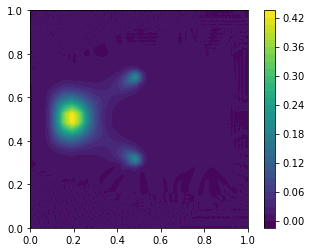

t = 0.02: error = 0.0798
0.5117519732677572
-0.0018096469659568551


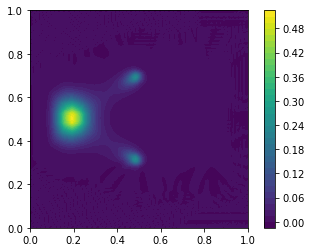

t = 0.02: error = 0.0918
0.603573899109127
-0.0014430056807032035


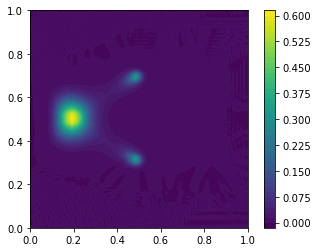

t = 0.02: error = 0.105
0.708173438271421
-0.0011135149321414033


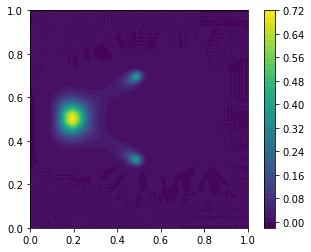

t = 0.02: error = 0.118
0.8260086450651788
-0.0008847265064264672


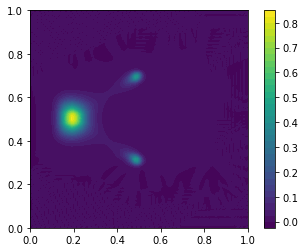

t = 0.03: error = 0.131
0.9571402625817961
-0.0006416473311104953


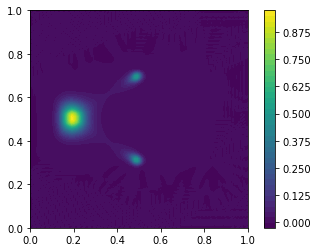

t = 0.03: error = 0.145
1.1011598516824825
-0.00044435212013646704


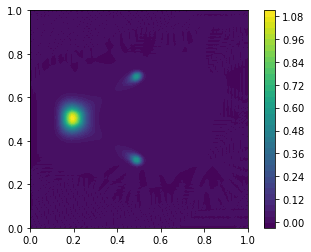

t = 0.03: error = 0.159
1.25714955574447
-0.0005085231511897028


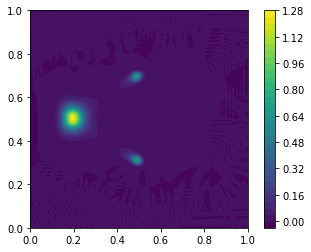

t = 0.03: error = 0.173
1.4238149574966357
-0.0018451159265140938


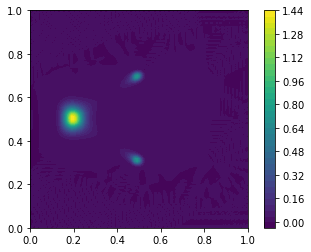

t = 0.03: error = 0.186
1.6003049085763978
-0.003126720367249864


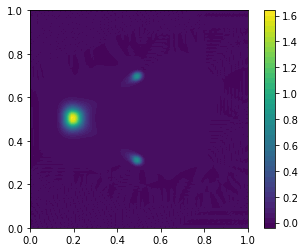

t = 0.04: error = 0.199
1.795983913809602
-0.005138322931820088


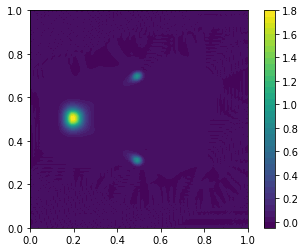

t = 0.04: error = 0.21
2.0056175428664713
-0.009440211441005916


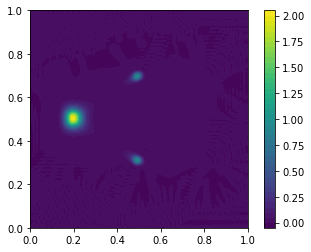

t = 0.04: error = 0.219
2.2241645433083317
-0.013063528320014516


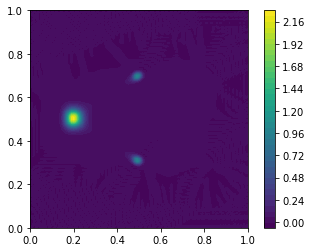

t = 0.04: error = 0.225
2.449516985600233
-0.01609507692093638


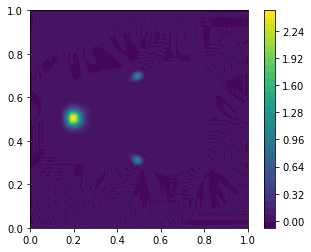

t = 0.04: error = 0.23
2.679188749022008
-0.018626285557740364


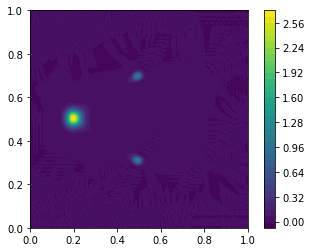

t = 0.05: error = 0.231
2.9106456134162833
-0.020742879311687775


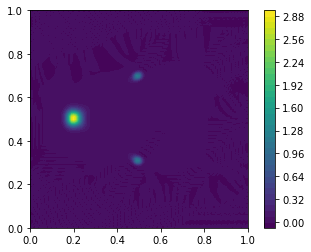

t = 0.05: error = 0.231
3.1414036743679157
-0.022519681175023197


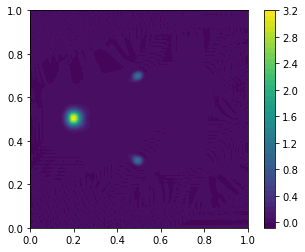

t = 0.05: error = 0.228
3.36909173117557
-0.02401896711213666


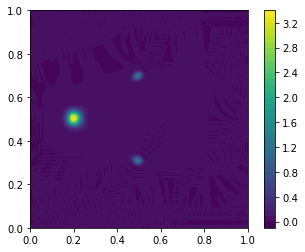

t = 0.05: error = 0.222
3.5915288475111766
-0.025290972726719305


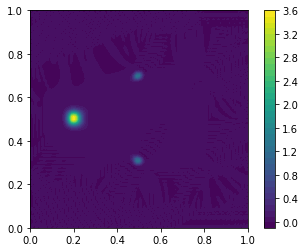

t = 0.05: error = 0.215
3.806785078382634
-0.026375479313594737


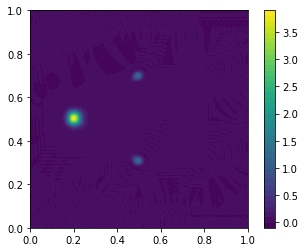

t = 0.06: error = 0.206
4.013223932342683
-0.027303758129666192


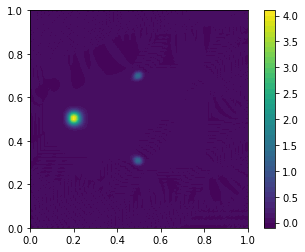

t = 0.06: error = 0.196
4.209526128756972
-0.028100449917647412


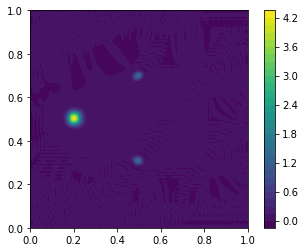

t = 0.06: error = 0.187
4.394695040188329
-0.028785175224784548


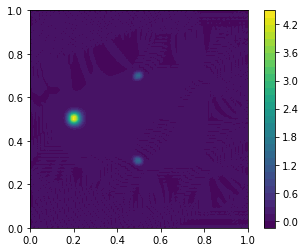

t = 0.06: error = 0.177
4.56804689606433
-0.029373807018649757


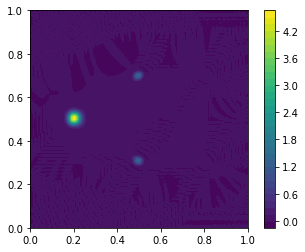

t = 0.06: error = 0.166
4.729188325111948
-0.029879203699600596


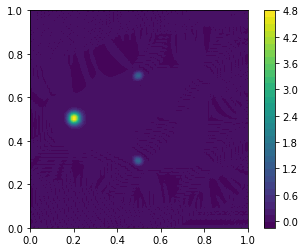

t = 0.07: error = 0.155
4.877984655276403
-0.030312490170376096


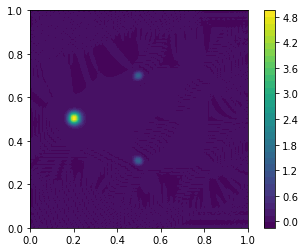

t = 0.07: error = 0.143
5.014523254544383
-0.030683242386542818


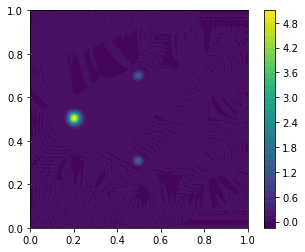

t = 0.07: error = 0.132
5.139543031636795
-0.030999875503768523


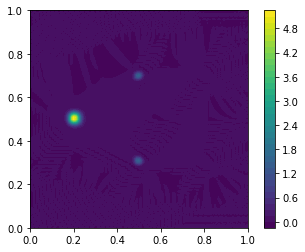

t = 0.07: error = 0.12
5.253154277187218
-0.031269641235360975


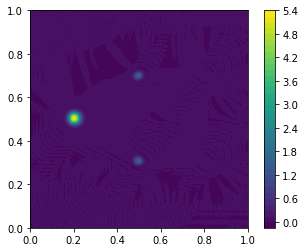

t = 0.07: error = 0.109
5.355773000345669
-0.03149880821276099


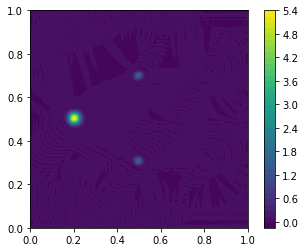

t = 0.08: error = 0.0985
5.447989327494194
-0.03169284269594907


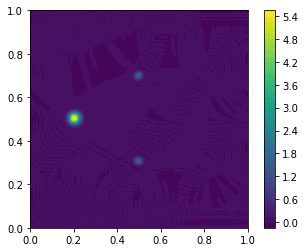

t = 0.08: error = 0.0884
5.530444226248442
-0.031856536926881465


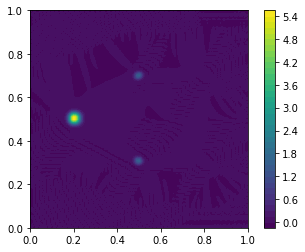

t = 0.08: error = 0.0788
5.6038066321512945
-0.03199409944406776


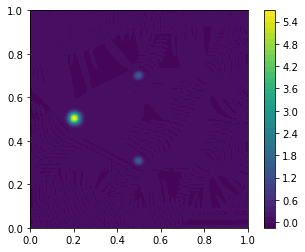

t = 0.08: error = 0.0698
5.668753987582333
-0.032109223672644314


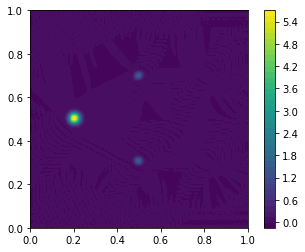

t = 0.08: error = 0.0614
5.72595693626716
-0.03220514434859707


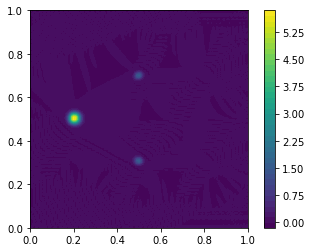

t = 0.09: error = 0.0537
5.776068537962177
-0.032284686621442356


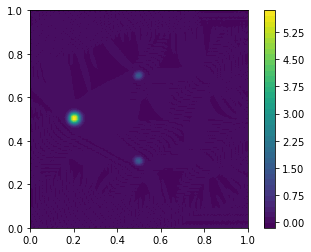

t = 0.09: error = 0.0467
5.819713875223876
-0.03235031016673097


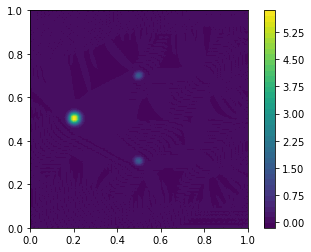

t = 0.09: error = 0.0402
5.857484355208948
-0.03240414939905452


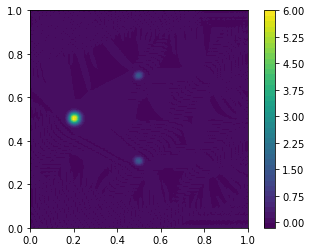

t = 0.09: error = 0.0343
5.8899341913585594
-0.03244805028591867


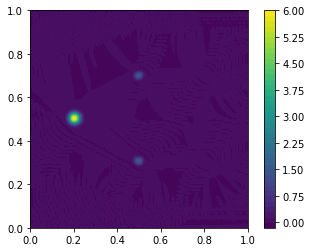

t = 0.09: error = 0.029
5.917578596619371
-0.03248360399889664


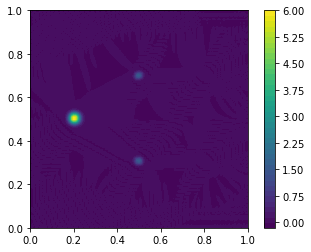

t = 0.10: error = 0.0242
5.940893255152256
-0.032512177537883505


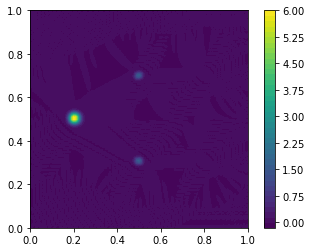

t = 0.10: error = 0.0198
5.960314777747449
-0.03253494144219315


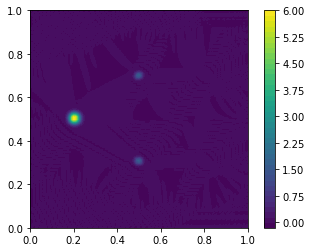

t = 0.10: error = 0.016
5.976241922438518
-0.032552894714957196


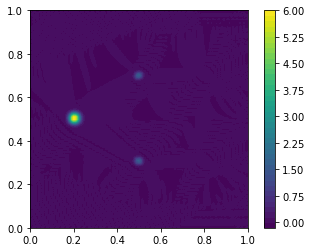

t = 0.10: error = 0.0128
5.989037367772735
-0.032566887112333555


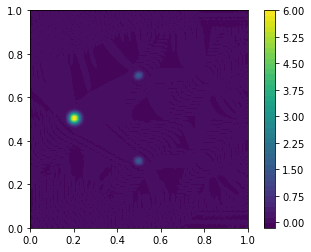

t = 0.10: error = 0.00999
5.999029841308655
-0.03257763897366875


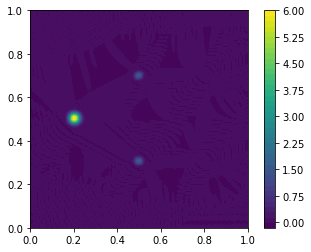

t = 0.11: error = 0.00749
6.006516442563943
-0.032585758783087254


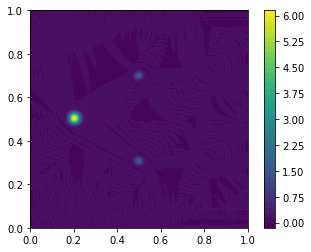

t = 0.11: error = 0.00661
6.011765041188286
-0.03259175865223799


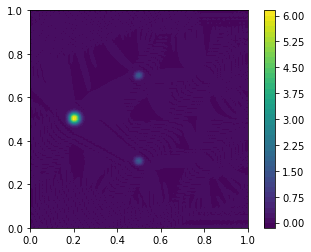

t = 0.11: error = 0.00646
6.015016666197165
-0.0325960679059976


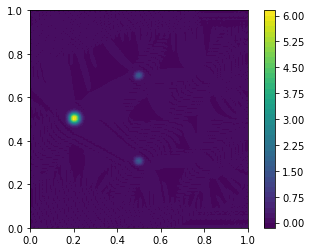

t = 0.11: error = 0.00652
6.016487828638472
-0.03259904495139589


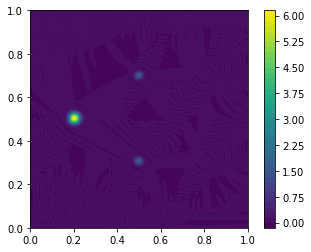

t = 0.11: error = 0.0066
6.016372739607
-0.03260098761532731


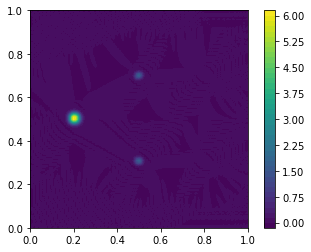

t = 0.12: error = 0.00683
6.014845399881389
-0.032602142123884764


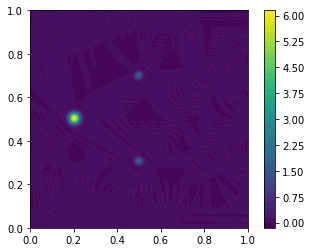

t = 0.12: error = 0.007
6.012061547993673
-0.032602710872885216


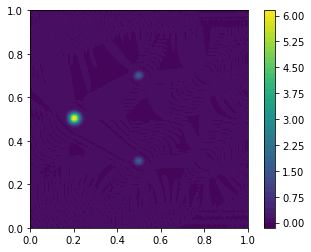

t = 0.12: error = 0.00712
6.0081604612057635
-0.03260285914446983


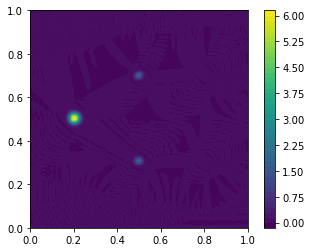

t = 0.12: error = 0.00751
6.003266609346499
-0.03260272094754623


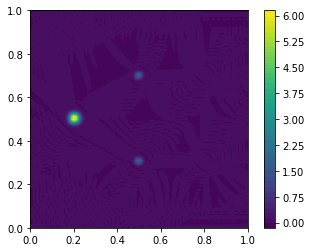

t = 0.12: error = 0.00799
5.99749116527335
-0.0326024041334885


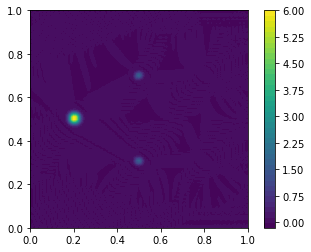

t = 0.13: error = 0.00839
5.9909333782650265
-0.03260199484943064


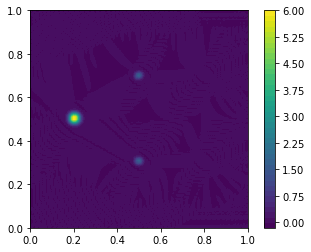

t = 0.13: error = 0.00872
5.983681818239819
-0.0326015613126059


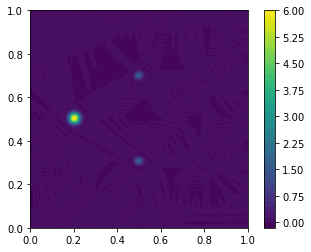

t = 0.13: error = 0.00916
5.975815499577065
-0.03260115689475255


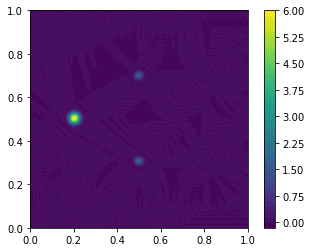

t = 0.13: error = 0.00964
5.967404893689513
-0.03260082258739682


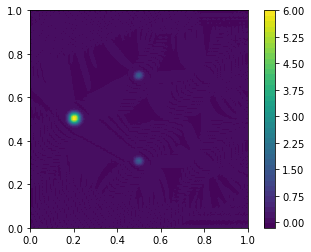

t = 0.13: error = 0.0101
5.958512839502117
-0.03260058899991055


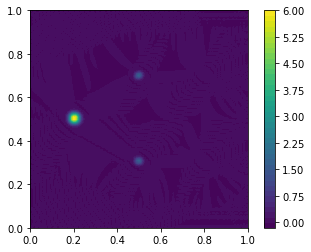

t = 0.14: error = 0.0104
5.9491953607524986
-0.03260047805769319


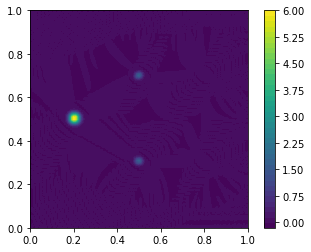

t = 0.14: error = 0.0107
5.939502398625734
-0.032600504515531994


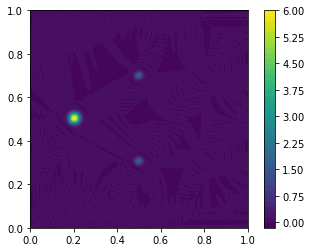

t = 0.14: error = 0.011
5.929478467734628
-0.032600677327413244


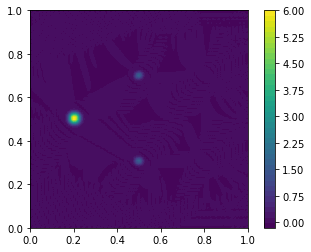

t = 0.14: error = 0.0112
5.9191632429021315
-0.0326010008635415


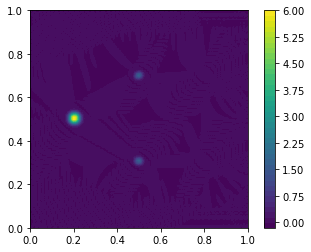

t = 0.14: error = 0.0114
5.90859208362734
-0.03260147595260046


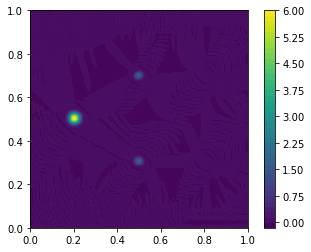

t = 0.15: error = 0.0115
5.897796502543179
-0.0326021007402503


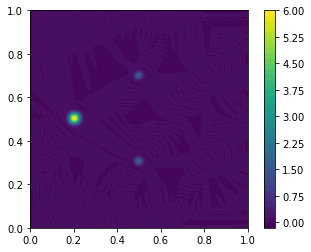

t = 0.15: error = 0.0117
5.886804583617049
-0.0326028713742897


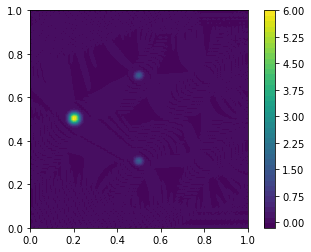

t = 0.15: error = 0.0118
5.875641355315561
-0.03260378254151031


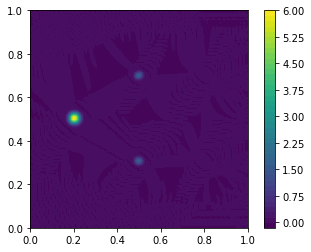

t = 0.15: error = 0.0119
5.864329123456347
-0.032604827888102435


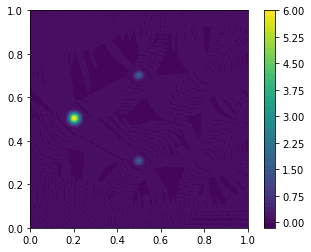

t = 0.15: error = 0.0119
5.852887768006919
-0.032606000355415776


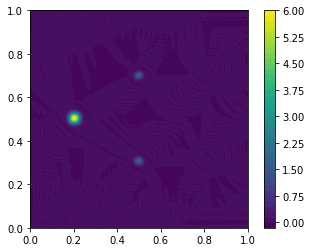

t = 0.16: error = 0.012
5.841335007663992
-0.032607292455657744


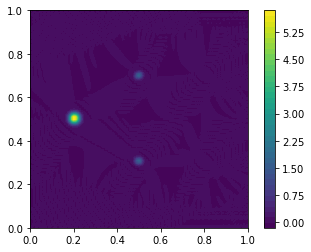

t = 0.16: error = 0.012
5.829686635655821
-0.03260869649819849


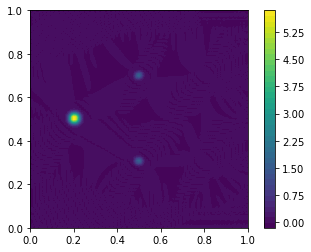

t = 0.16: error = 0.012
5.817956729854168
-0.0326102047638383


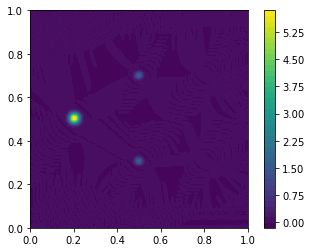

t = 0.16: error = 0.0121
5.806157839959609
-0.03261180962354707


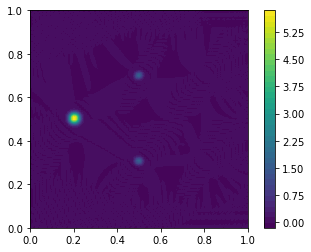

t = 0.16: error = 0.0121
5.794301154232199
-0.032613503611308506


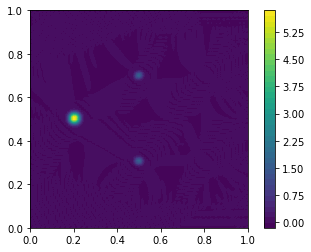

t = 0.17: error = 0.0121
5.782396647976864
-0.032615279474793535


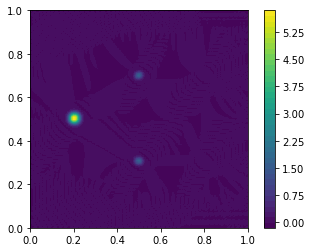

t = 0.17: error = 0.0121
5.770453215757334
-0.03261713022906296


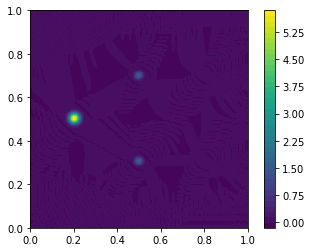

t = 0.17: error = 0.012
5.75847878910185
-0.032619049221663546


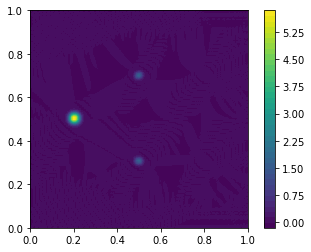

t = 0.17: error = 0.012
5.7464804412760575
-0.032621030190229175


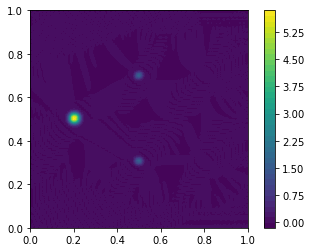

t = 0.17: error = 0.012
5.734464480531505
-0.032623067280095085


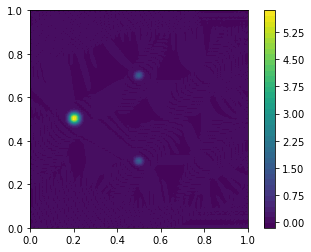

t = 0.18: error = 0.012
5.722436533089431
-0.03262515500923703


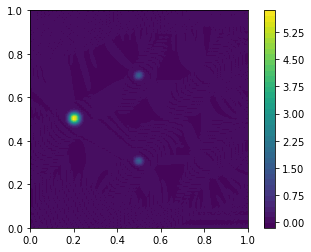

t = 0.18: error = 0.012
5.710401616987209
-0.03262728820598205


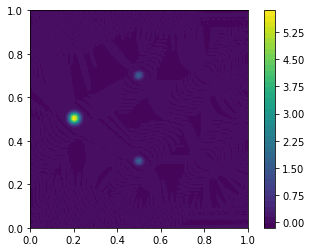

t = 0.18: error = 0.012
5.698364207796304
-0.032629461966355626


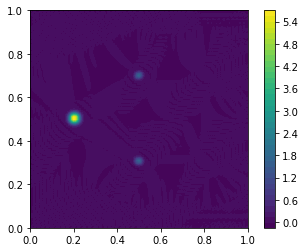

t = 0.18: error = 0.012
5.6863282971142555
-0.0326316716630435


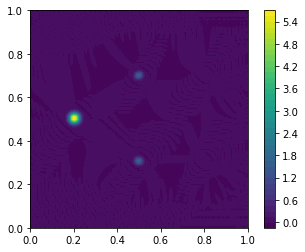

t = 0.18: error = 0.012
5.6742974446369
-0.03263391299618352


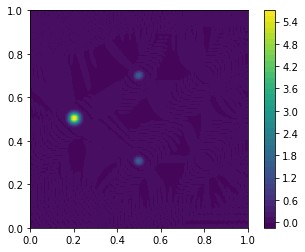

t = 0.19: error = 0.012
5.662274824529625
-0.032636182042124554


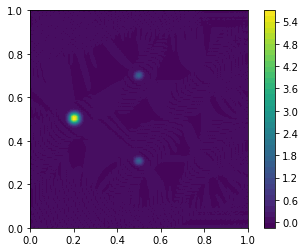

t = 0.19: error = 0.012
5.6502632667365384
-0.032638475262311416


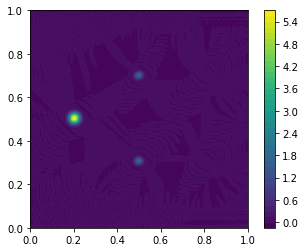

t = 0.19: error = 0.012
5.6382652937935855
-0.03264078947439189


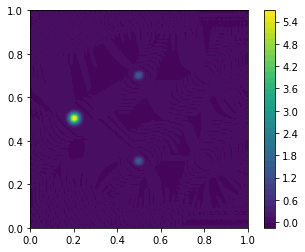

t = 0.19: error = 0.012
5.626283153645416
-0.03264312181787885


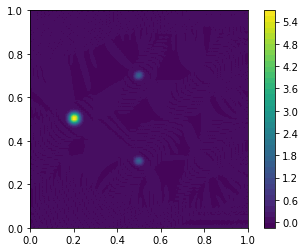

t = 0.19: error = 0.012
5.614318848906164
-0.03264546973589015


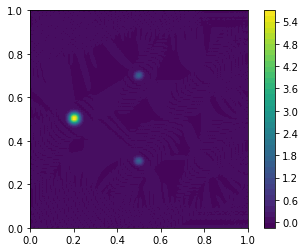

t = 0.20: error = 0.0119
5.602374162951573
-0.03264783096254532


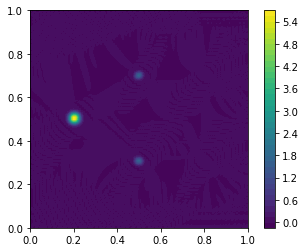

t = 0.20: error = 0.0119
5.590450683183949
-0.032650203493714516


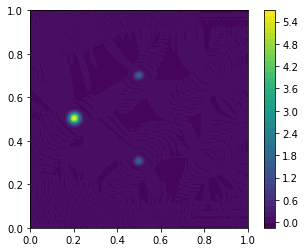

t = 0.20: error = 0.0119
5.578549821772221
-0.03265258553518714


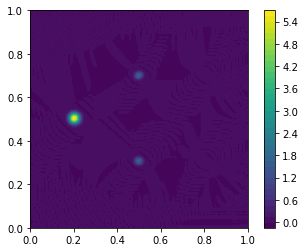

t = 0.20: error = 0.0119
5.566672834136314
-0.0326549754437052


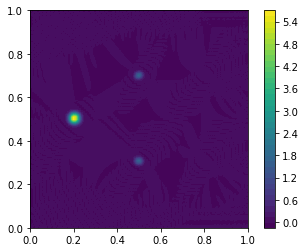

t = 0.20: error = 0.0119
5.554820835417267
-0.03265737168227599


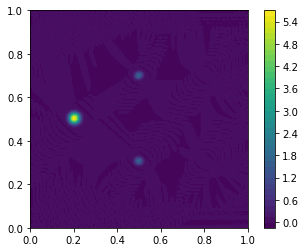

t = 0.21: error = 0.0118
5.542994815150849
-0.032659772798516236


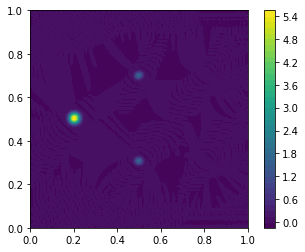

t = 0.21: error = 0.0118
5.531195650341778
-0.03266217741804231


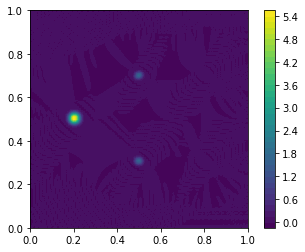

t = 0.21: error = 0.0118
5.519424117117056
-0.03266458424137186


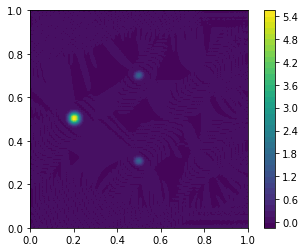

t = 0.21: error = 0.0117
5.507680901119587
-0.032666992042611066


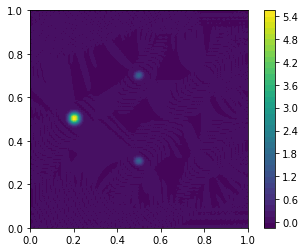

t = 0.21: error = 0.0117
5.4959666067869195
-0.032669399677811704


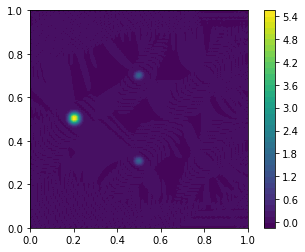

t = 0.22: error = 0.0117
5.484281765644447
-0.032671806111046864


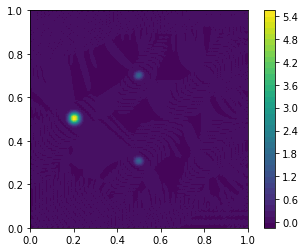

t = 0.22: error = 0.0117
5.472626843727543
-0.03267421045663773


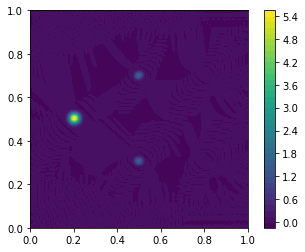

t = 0.22: error = 0.0116
5.461002248233298
-0.03267661202022611


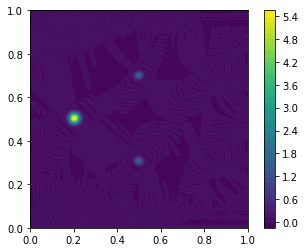

t = 0.22: error = 0.0116
5.449408333489531
-0.032679010308013214


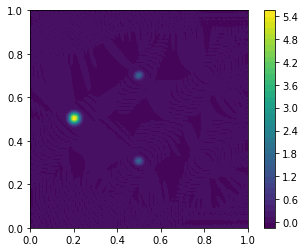

t = 0.22: error = 0.0116
5.437845406316793
-0.032681404979004486


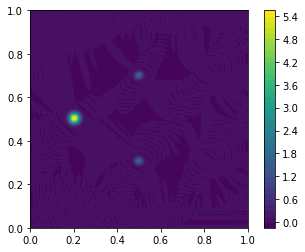

t = 0.23: error = 0.0115
5.426313730848374
-0.032683795746677125


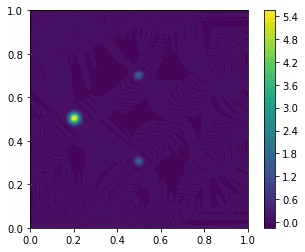

t = 0.23: error = 0.0115
5.414813532863937
-0.03268618227425951


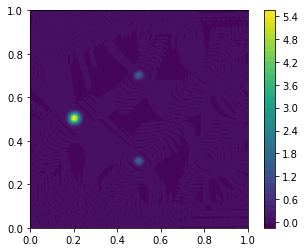

t = 0.23: error = 0.0115
5.403345003684513
-0.03268856411899922


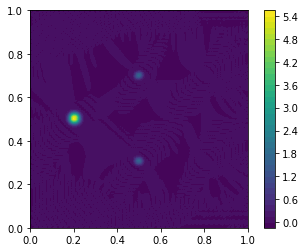

t = 0.23: error = 0.0114
5.391908303670447
-0.03269094075463219


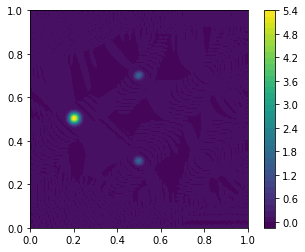

t = 0.23: error = 0.0114
5.380503565359119
-0.03269331165613383


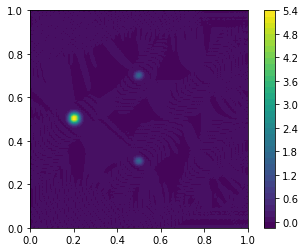

t = 0.24: error = 0.0114
5.369130896276156
-0.032695676394868235


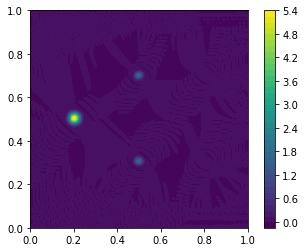

t = 0.24: error = 0.0113
5.357790381451458
-0.03269803468758342


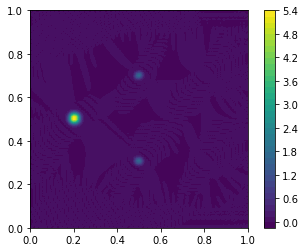

t = 0.24: error = 0.0113
5.3464820856697886
-0.032700386374432434


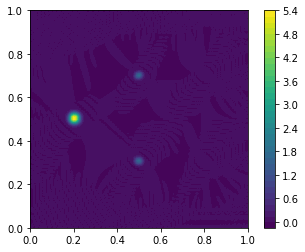

t = 0.24: error = 0.0113
5.335206055484058
-0.03270273134782081


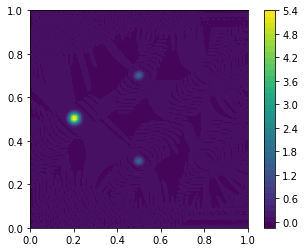

t = 0.24: error = 0.0112
5.3239623210176905
-0.03270506948128063


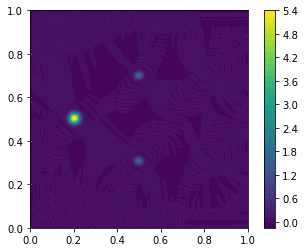

t = 0.25: error = 0.0112
5.312750897580282
-0.03270740059817633


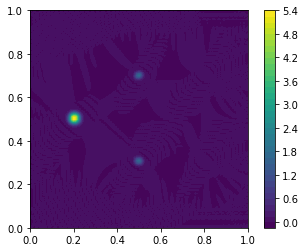

t = 0.25: error = 0.0112
5.301571787118104
-0.03270972447995058


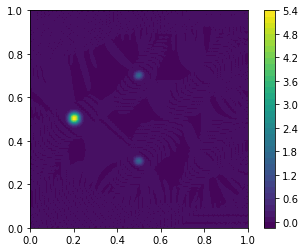

t = 0.25: error = 0.0111
5.290424979518199
-0.03271204088129227


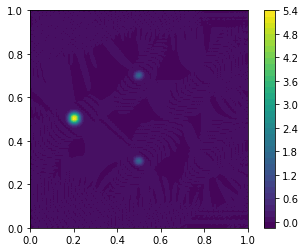

t = 0.25: error = 0.0111
5.279310453781852
-0.032714349534821746


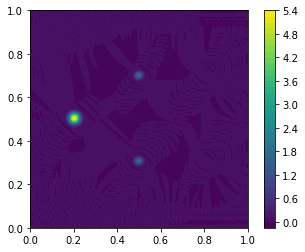

t = 0.25: error = 0.0111
5.268228179080614
-0.032716650170379225


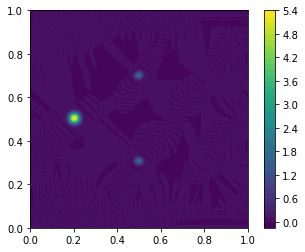

t = 0.26: error = 0.0111
5.257178115705885
-0.03271894258259562


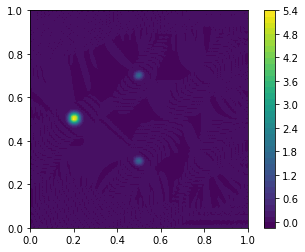

t = 0.26: error = 0.011
5.246160215921528
-0.032721226734780895


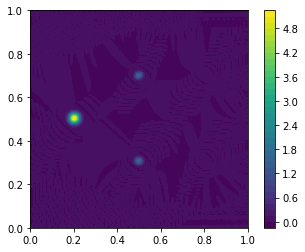

t = 0.26: error = 0.011
5.235174424728203
-0.03272350283520372


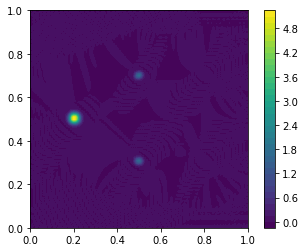

t = 0.26: error = 0.011
5.224220680547683
-0.03272577132003533


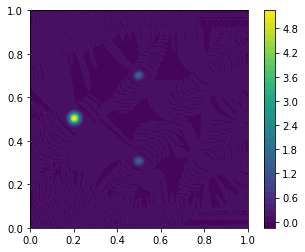

t = 0.26: error = 0.0109
5.213298915835658
-0.032728032733105025


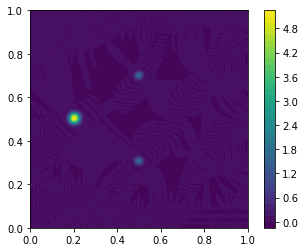

t = 0.27: error = 0.0109
5.202409057631666
-0.03273028755857281


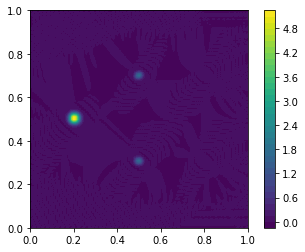

t = 0.27: error = 0.0109
5.191551028055112
-0.03273253607928367


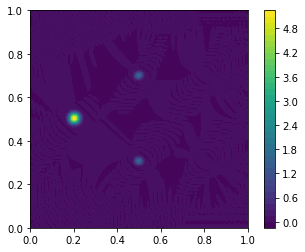

t = 0.27: error = 0.0108
5.180724744756384
-0.03273477829726063


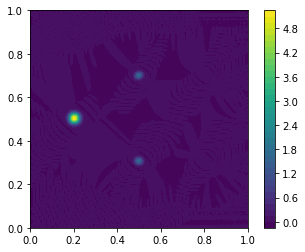

t = 0.27: error = 0.0108
5.169930121331823
-0.03273701392289321


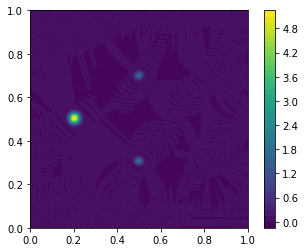

t = 0.27: error = 0.0108
5.159167067710686
-0.03273924244353136


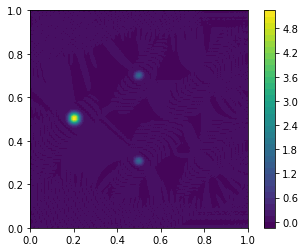

t = 0.28: error = 0.0107
5.148435490521144
-0.032741463270956825


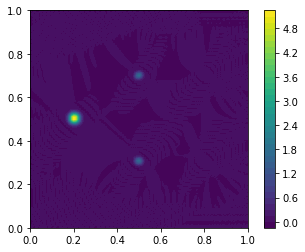

t = 0.28: error = 0.0107
5.137735293440733
-0.03274367591785238


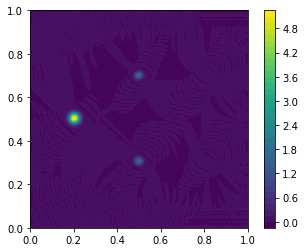

t = 0.28: error = 0.0107
5.127066377534624
-0.032745880121115435


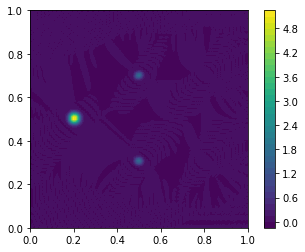

t = 0.28: error = 0.0106
5.116428641582671
-0.03274807586339971


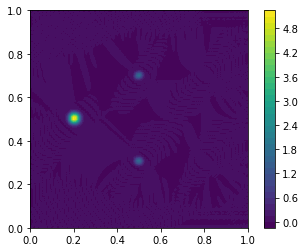

t = 0.28: error = 0.0106
5.105821982393759
-0.03275026331539576


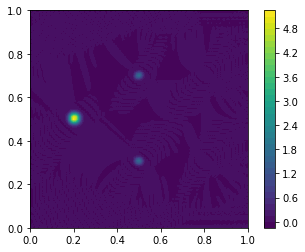

t = 0.29: error = 0.0106
5.095246295103797
-0.032752442760645366


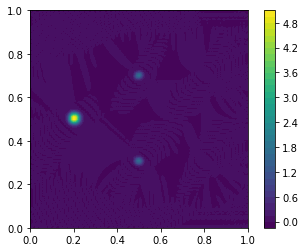

t = 0.29: error = 0.0105
5.084701473452276
-0.03275461454325871


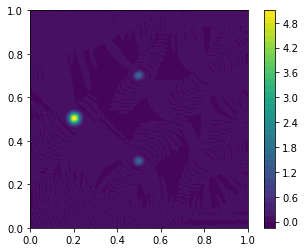

t = 0.29: error = 0.0105
5.074187410031799
-0.03275677903180389


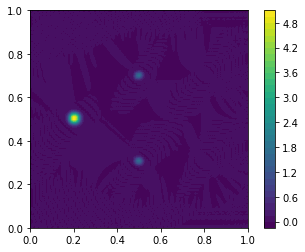

t = 0.29: error = 0.0105
5.063703996505707
-0.03275893657420218


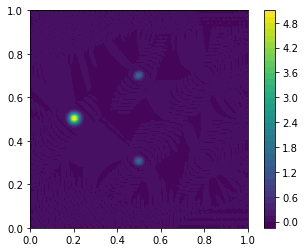

t = 0.29: error = 0.0105
5.05325112379061
-0.0327610874391796


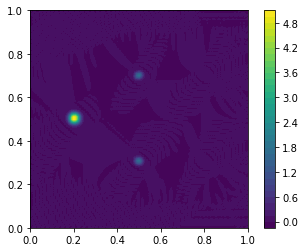

t = 0.30: error = 0.0104
5.0428286822031945
-0.03276323176111538


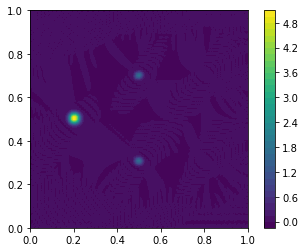

t = 0.30: error = 0.0104
5.032436561573319
-0.03276536950398478


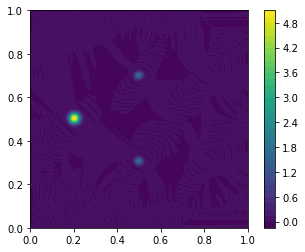

t = 0.30: error = 0.0104
5.022074651327946
-0.03276750045158835


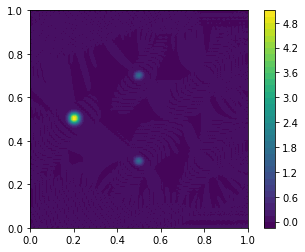

t = 0.30: error = 0.0103
5.0117428405520865
-0.032769624234646064


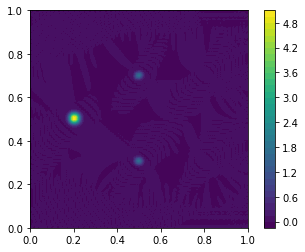

t = 0.30: error = 0.0103
5.001441018033615
-0.03277174040836661


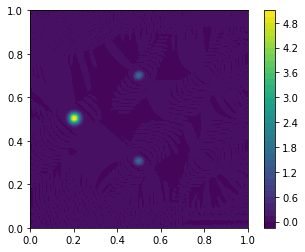

t = 0.31: error = 0.0103
4.9911690722984225
-0.03277384857123246


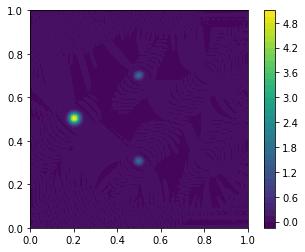

t = 0.31: error = 0.0102
4.980926891641099
-0.03277594848084533


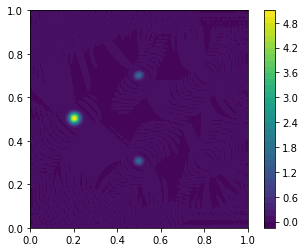

t = 0.31: error = 0.0102
4.970714364154759
-0.03277804011608894


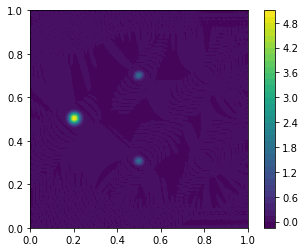

t = 0.31: error = 0.0102
4.960531377761772
-0.03278012366608067


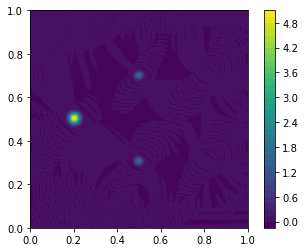

t = 0.31: error = 0.0102
4.9503778202459054
-0.03278219946431643


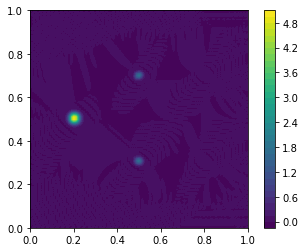

t = 0.32: error = 0.0101
4.940253579285454
-0.032784267904664814


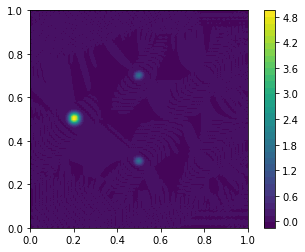

t = 0.32: error = 0.0101
4.930158542486696
-0.032786329374671734


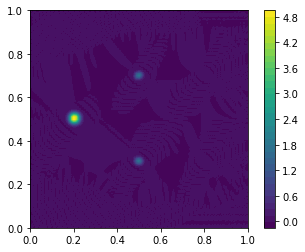

t = 0.32: error = 0.0101
4.920092597417353
-0.03278838422247896


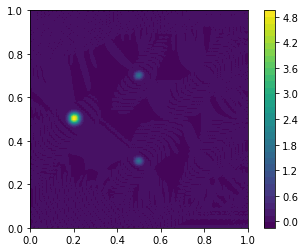

t = 0.32: error = 0.01
4.910055631640213
-0.03279043273873997


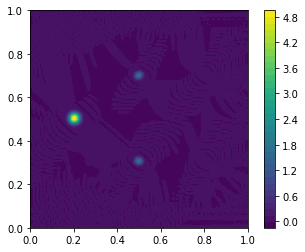

t = 0.32: error = 0.01
4.900047532747726
-0.03279247511530692


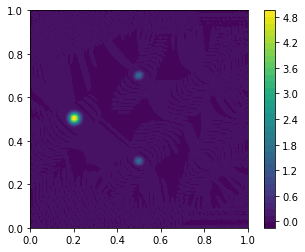

t = 0.33: error = 0.00998
4.890068188398819
-0.03279451136964077


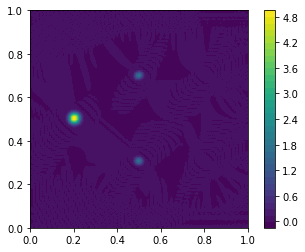

t = 0.33: error = 0.00995
4.880117486359229
-0.03279654127675672


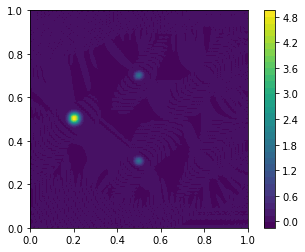

t = 0.33: error = 0.00992
4.87019531454625
-0.032798564374356


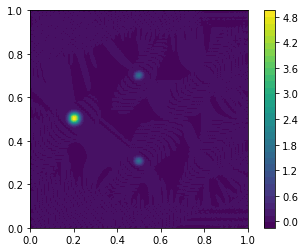

t = 0.33: error = 0.00989
4.860301561078079
-0.032800580072207694


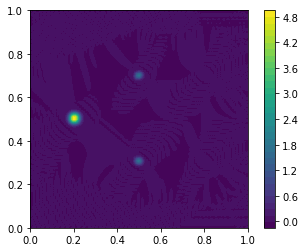

t = 0.33: error = 0.00987
4.8504361143267385
-0.03280258782346539


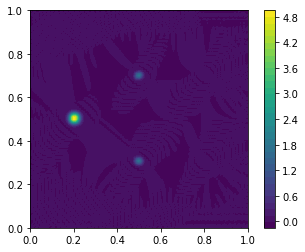

t = 0.34: error = 0.00984
4.8405988629725885
-0.03280458726556251


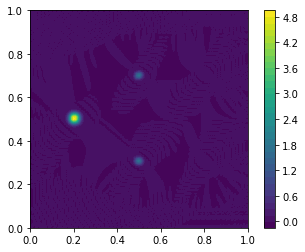

t = 0.34: error = 0.00981
4.830789696057538
-0.0328065782698662


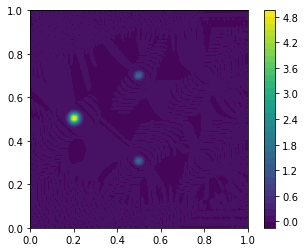

t = 0.34: error = 0.00978
4.821008503033912
-0.03280856092268813


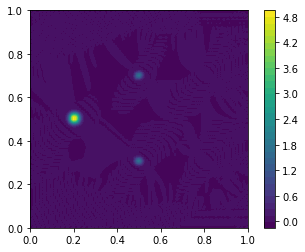

t = 0.34: error = 0.00975
4.811255173806395
-0.03281053549684394


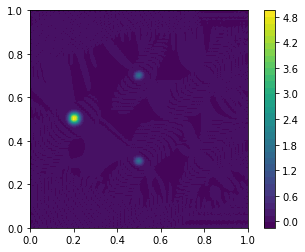

t = 0.34: error = 0.00973
4.801529598765748
-0.03281250243122005


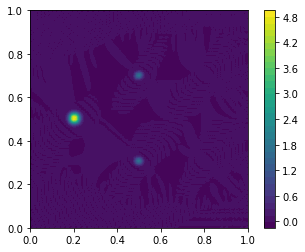

t = 0.35: error = 0.0097
4.791831668814486
-0.032814462285714885


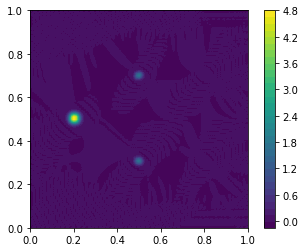

t = 0.35: error = 0.00967
4.782161275386172
-0.03281641564205479


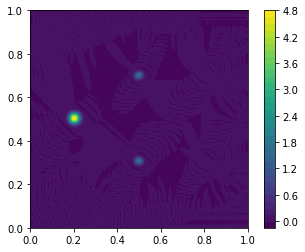

t = 0.35: error = 0.00964
4.7725183104607165
-0.03281836296550646


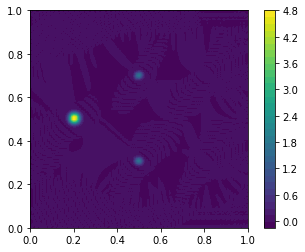

t = 0.35: error = 0.00962
4.762902666577882
-0.03282030449264285


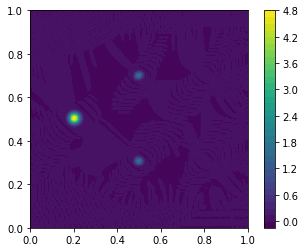

t = 0.35: error = 0.00959
4.753314236850072
-0.03282224021810962


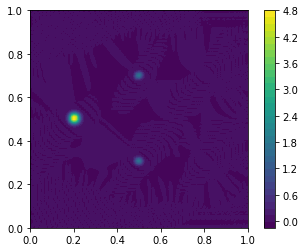

t = 0.36: error = 0.00956
4.7437529149738165
-0.032824169988845485


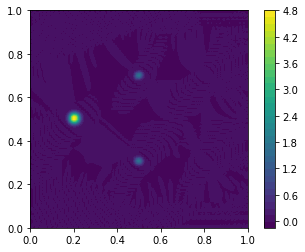

t = 0.36: error = 0.00953
4.73421859523771
-0.03282609362450509


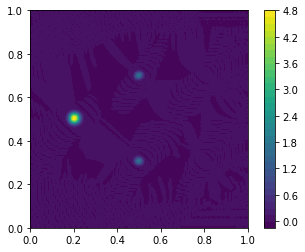

t = 0.36: error = 0.00951
4.72471117252359
-0.03282801075767814


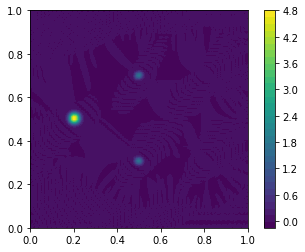

t = 0.36: error = 0.00948
4.715230542297757
-0.03282991982177823


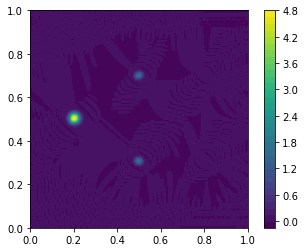

t = 0.36: error = 0.00945
4.705776600590077
-0.03283181630295176


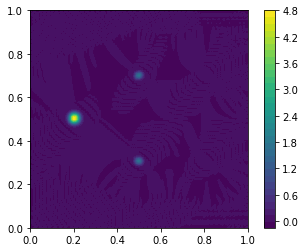

t = 0.37: error = 0.00943
4.696349243960709
-0.03283369193260324


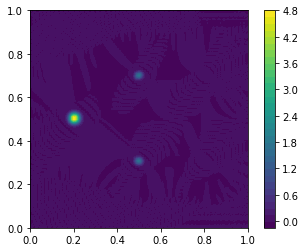

t = 0.37: error = 0.0094
4.686948369456308
-0.03283553689343168


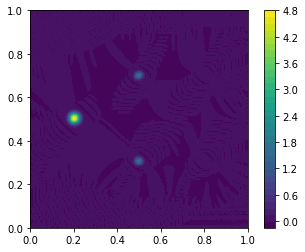

t = 0.37: error = 0.00937
4.6775738745595
-0.03283734502094559


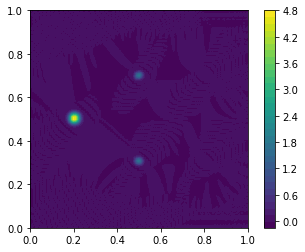

t = 0.37: error = 0.00935
4.668225657136791
-0.032839119082138886


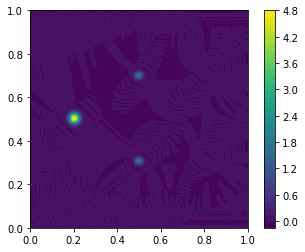

t = 0.37: error = 0.00932
4.6589036153905825
-0.032840872446619936


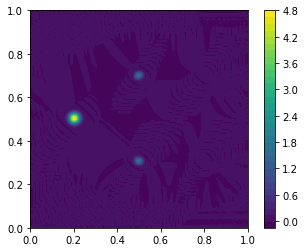

t = 0.38: error = 0.0093
4.649607647820688
-0.03284262566396555


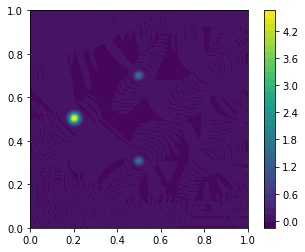

t = 0.38: error = 0.00927
4.64033765319979
-0.0328443996702336


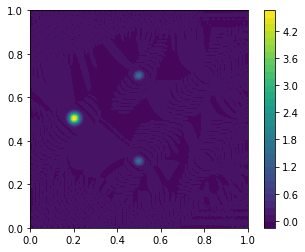

t = 0.38: error = 0.00924
4.631093530565692
-0.03284620908713353


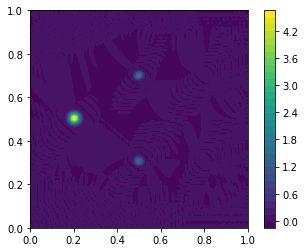

t = 0.38: error = 0.00922
4.621875179231222
-0.03284805849543766


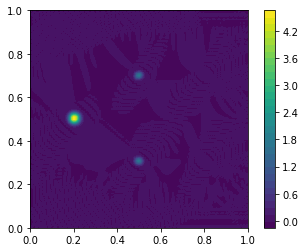

t = 0.38: error = 0.00919
4.612682498810495
-0.032849942591398645


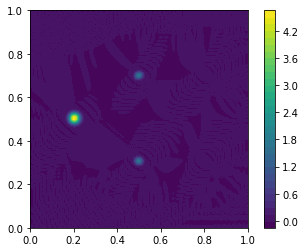

t = 0.39: error = 0.00917
4.603515389258011
-0.03285184926361402


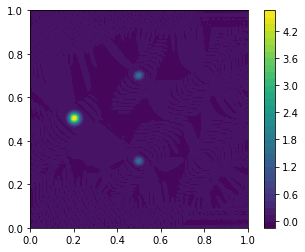

t = 0.39: error = 0.00914
4.5943737509152625
-0.03285376377763058


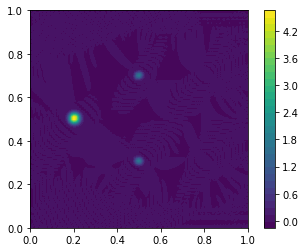

t = 0.39: error = 0.00912
4.585257484558455
-0.032855672456495864


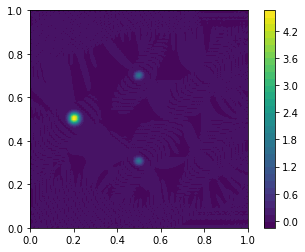

t = 0.39: error = 0.00909
4.5761664914409295
-0.03285756499544149


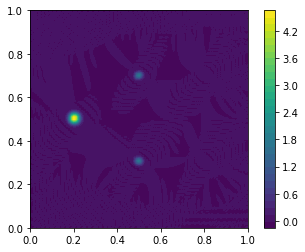

t = 0.39: error = 0.00907
4.567100673324988
-0.03285943530352864


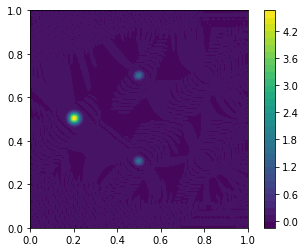

t = 0.40: error = 0.00904
4.558059932500001
-0.03286128122590365


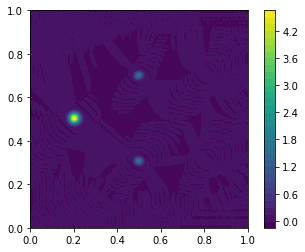

t = 0.40: error = 0.00902
4.5490441717864405
-0.032863103643922545


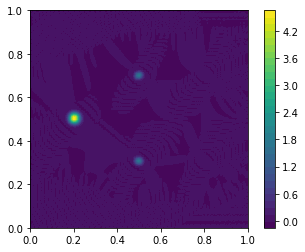

t = 0.40: error = 0.00899
4.540053294528292
-0.032864905383777905


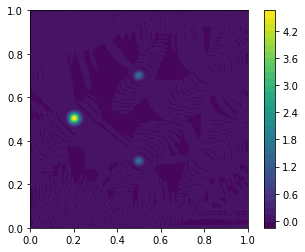

t = 0.40: error = 0.00897
4.5310872045784825
-0.03286669020266258


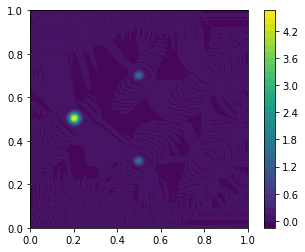

t = 0.40: error = 0.00894
4.522145806282959
-0.03286846196362993


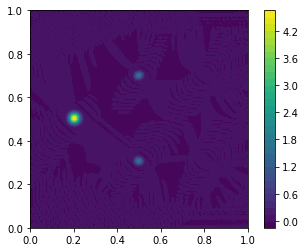

t = 0.41: error = 0.00892
4.51322900446868
-0.032870224025346846


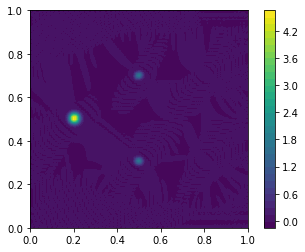

t = 0.41: error = 0.00889
4.504336704439136
-0.032871978861058845


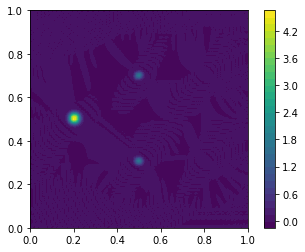

t = 0.41: error = 0.00887
4.495468811978396
-0.032873727926835655


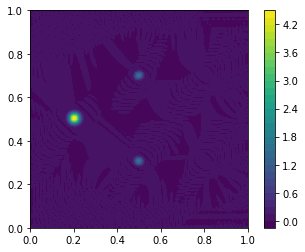

t = 0.41: error = 0.00884
4.486625233361886
-0.03287547177208737


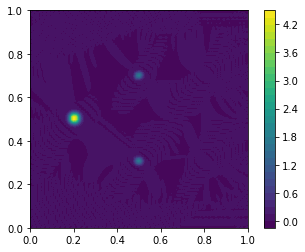

t = 0.41: error = 0.00882
4.477805875369821
-0.03287721032758064


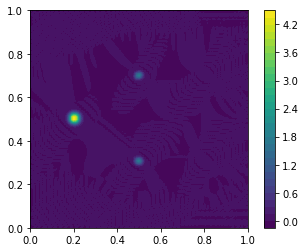

t = 0.42: error = 0.0088
4.469010645297967
-0.032878943262382006


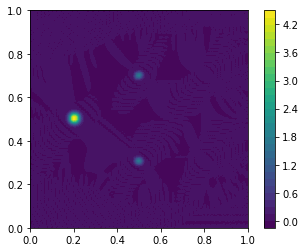

t = 0.42: error = 0.00877
4.4602394509605805
-0.032880670297137614


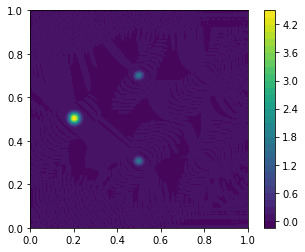

t = 0.42: error = 0.00875
4.451492200681836
-0.032882391385770336


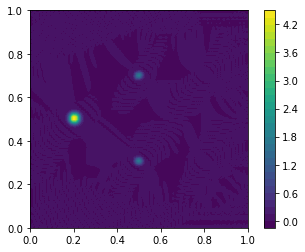

t = 0.42: error = 0.00872
4.442768803274478
-0.03288410672307034


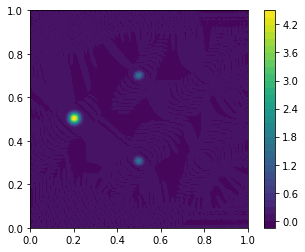

t = 0.42: error = 0.0087
4.434069168007213
-0.0328858166016787


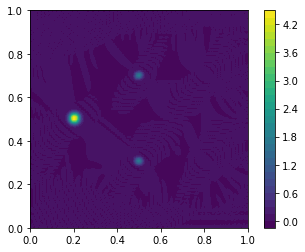

t = 0.43: error = 0.00868
4.425393204564758
-0.03288752120758485


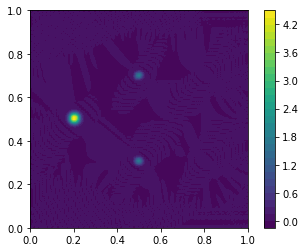

t = 0.43: error = 0.00865
4.416740823006074
-0.0328892204698268


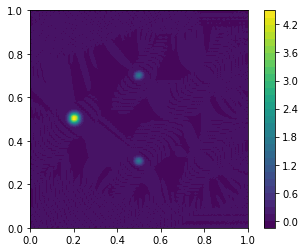

t = 0.43: error = 0.00863
4.408111933726672
-0.03289091404368835


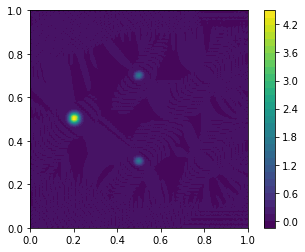

t = 0.43: error = 0.00861
4.399506447430142
-0.03289260142415199


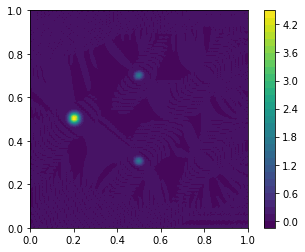

t = 0.43: error = 0.00858
4.390924275112406
-0.032894282116200275


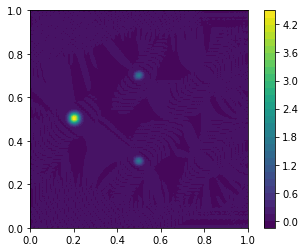

t = 0.44: error = 0.00856
4.382365328060167
-0.032895955780612725


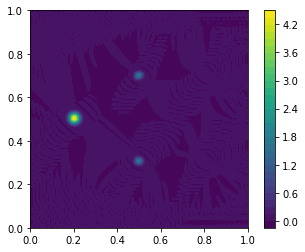

t = 0.44: error = 0.00854
4.373829517863121
-0.032897622313978137


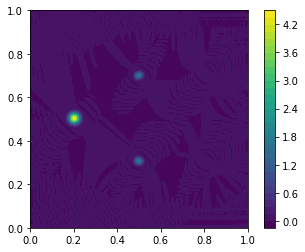

t = 0.44: error = 0.00851
4.365316756438057
-0.03289928185960122


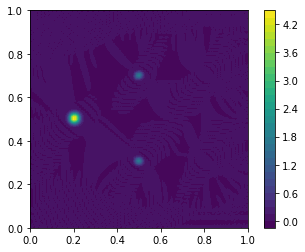

t = 0.44: error = 0.00849
4.356826956062246
-0.032900934757648416


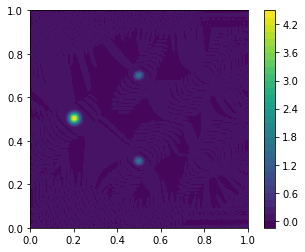

t = 0.44: error = 0.00847
4.348360029413423
-0.032902581448695276


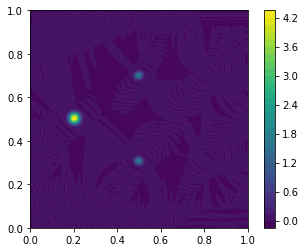

t = 0.45: error = 0.00844
4.339915889613908
-0.03290422236020046


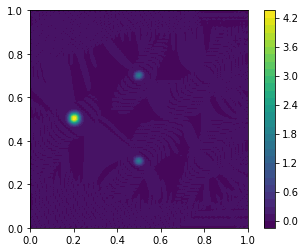

t = 0.45: error = 0.00842
4.331494450276733
-0.032905857825575396


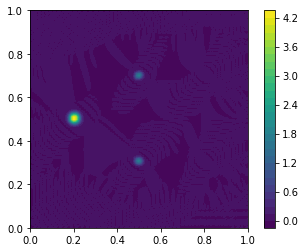

t = 0.45: error = 0.0084
4.323095625551812
-0.03290748809079758


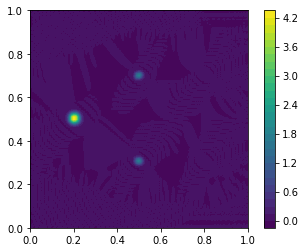

t = 0.45: error = 0.00838
4.314719330169963
-0.03290911341193307


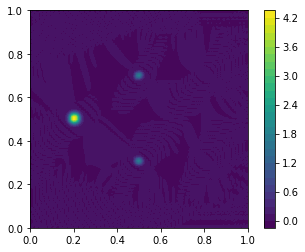

t = 0.45: error = 0.00835
4.306365479482203
-0.03291073414568584


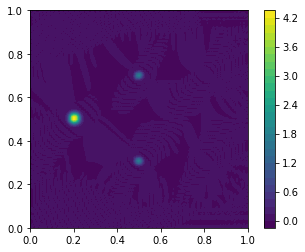

t = 0.46: error = 0.00833
4.2980339894912065
-0.03291235069129924


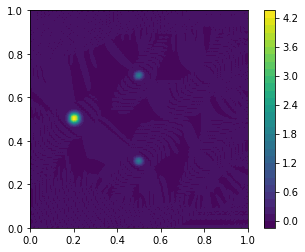

t = 0.46: error = 0.00831
4.289724776871586
-0.032913963250633546


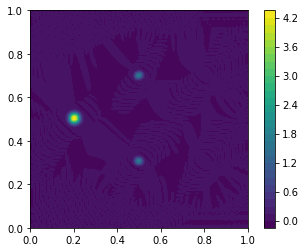

t = 0.46: error = 0.00829
4.281437758975898
-0.03291557155487145


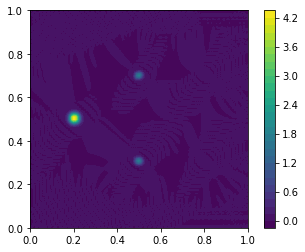

t = 0.46: error = 0.00826
4.273172853824203
-0.03291717476979364


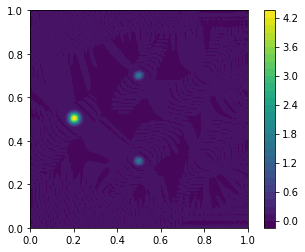

t = 0.46: error = 0.00824
4.264929980076512
-0.03291877167459531


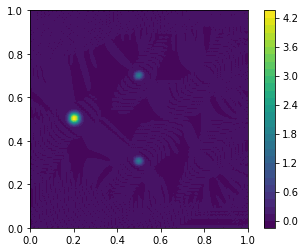

t = 0.47: error = 0.00822
4.256709056989388
-0.032920361033384166


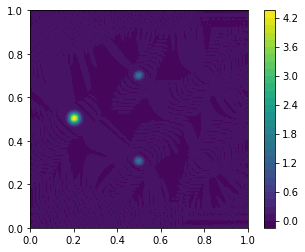

t = 0.47: error = 0.0082
4.248510004359923
-0.03292194198441203


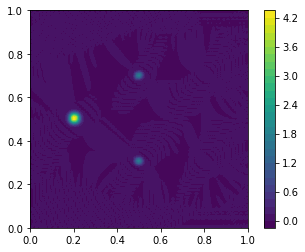

t = 0.47: error = 0.00818
4.240332742461797
-0.03292351429136198


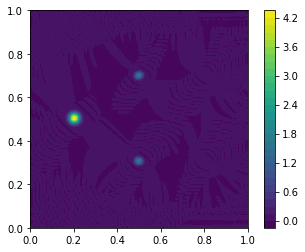

t = 0.47: error = 0.00816
4.232177191979017
-0.03292507838178717


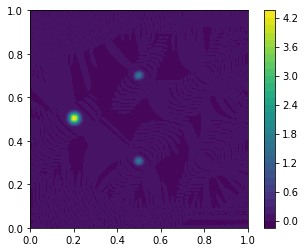

t = 0.47: error = 0.00813
4.224043273942734
-0.032926635185636564


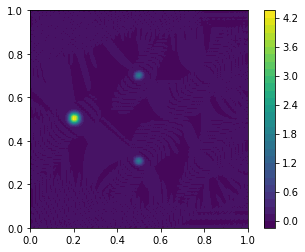

t = 0.48: error = 0.00811
4.215930909675759
-0.03292818585301782


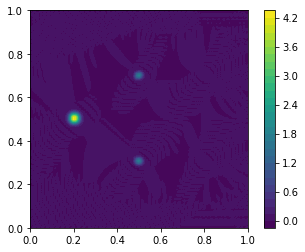

t = 0.48: error = 0.00809
4.207840020747699
-0.03292973145963377


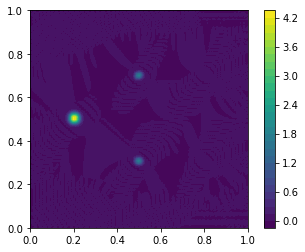

t = 0.48: error = 0.00807
4.1997705289420395
-0.03293127279664623


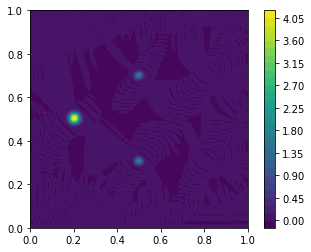

t = 0.48: error = 0.00805
4.191722356234772
-0.03293281029441881


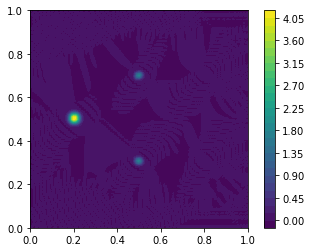

t = 0.48: error = 0.00803
4.183695424783048
-0.032934344064964934


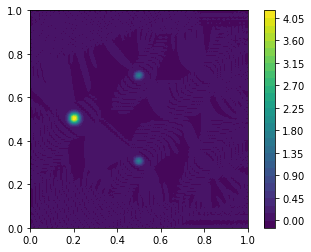

t = 0.49: error = 0.00801
4.175689656921886
-0.03293587399820362


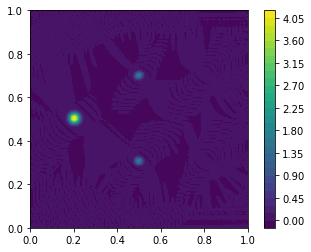

t = 0.49: error = 0.00798
4.167704975166949
-0.03293739984325003


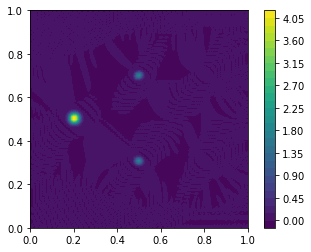

t = 0.49: error = 0.00796
4.1597413022220415
-0.03293892124446689


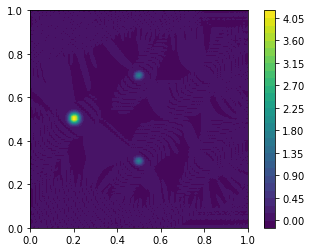

t = 0.49: error = 0.00794
4.151798560990557
-0.0329404377535125


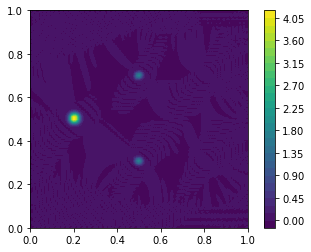

t = 0.49: error = 0.00792
4.143876674590712
-0.03294194886326961


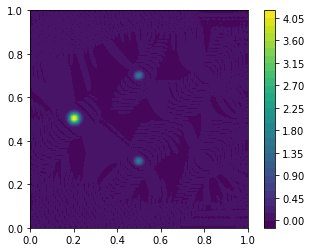

t = 0.50: error = 0.0079
4.135975566374573
-0.03294345408272784


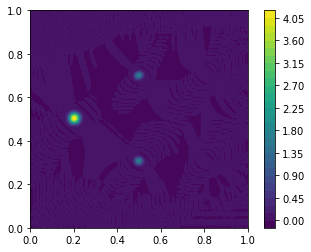

t = 0.50: error = 0.00788
4.128095159950801
-0.032944953030600126


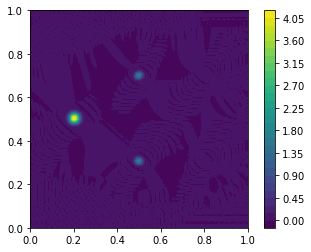

t = 0.50: error = 0.00786
4.1202353792104605
-0.03294644551635666


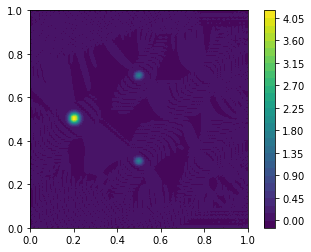

t = 0.50: error = 0.00784
4.1123961483548195
-0.03294793159258121


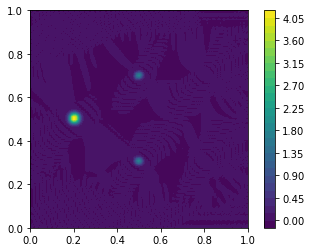

t = 0.50: error = 0.00782
4.104577391923409
-0.03294941156333834


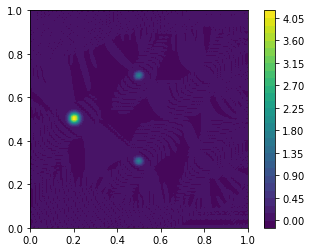

t = 0.51: error = 0.0078
4.096779034820498
-0.03295088592348372


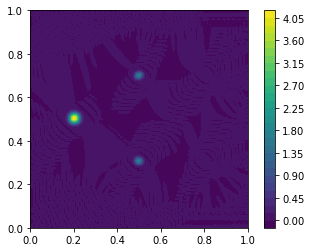

t = 0.51: error = 0.00778
4.089001002338201
-0.03295235522021785


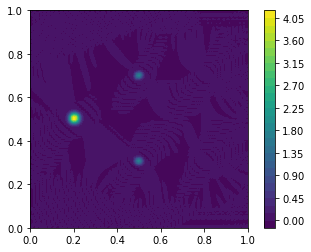

t = 0.51: error = 0.00776
4.0812432201749855
-0.03295381987740026


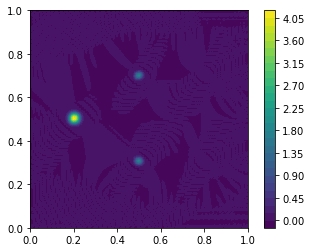

t = 0.51: error = 0.00774
4.073505614449129
-0.032955280062782526


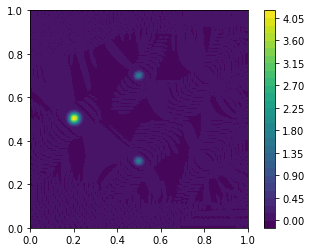

t = 0.51: error = 0.00772
4.0657881117075405
-0.03295673566599333


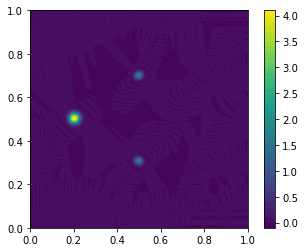

t = 0.52: error = 0.0077
4.058090638931129
-0.032958186398977886


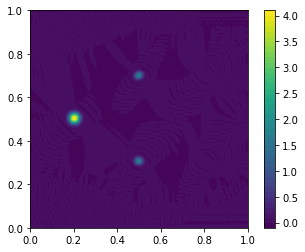

t = 0.52: error = 0.00768
4.050413123538244
-0.032959631677626416


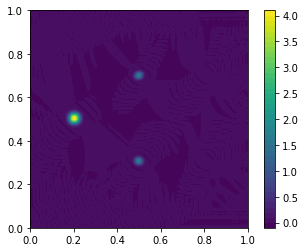

t = 0.52: error = 0.00766
4.042755483312426
-0.032961071906472884


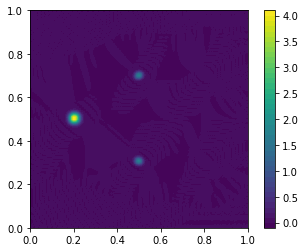

t = 0.52: error = 0.00764
4.035117666612329
-0.03296250774104351


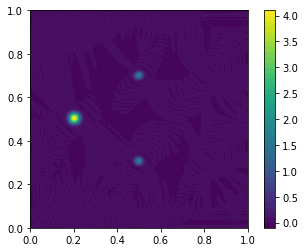

t = 0.52: error = 0.00762
4.0274996761541475
-0.03296393962526305


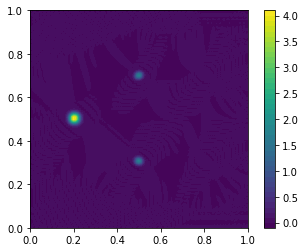

t = 0.53: error = 0.0076
4.019901534869003
-0.032965367772609035


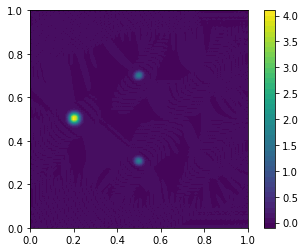

t = 0.53: error = 0.00758
4.012323277128992
-0.032966792154275504


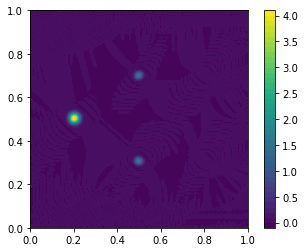

t = 0.53: error = 0.00756
4.004764961488201
-0.03296821251474367


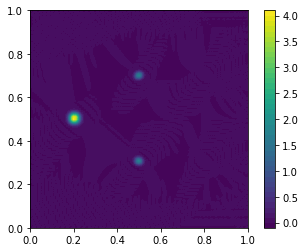

t = 0.53: error = 0.00754
3.997226662108791
-0.032969628463948145


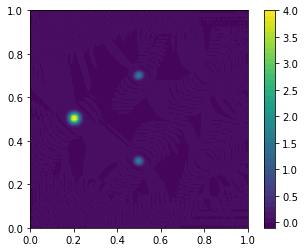

t = 0.53: error = 0.00752
3.989708447099699
-0.0329710396192586


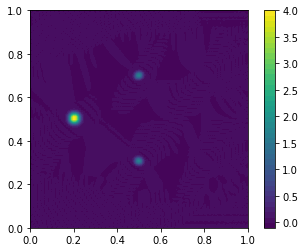

t = 0.54: error = 0.0075
3.982210364616072
-0.03297244574070337


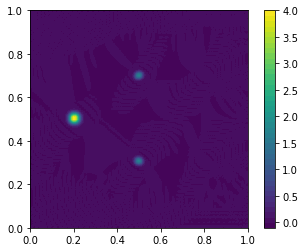

t = 0.54: error = 0.00748
3.9747324397312718
-0.03297384682178153


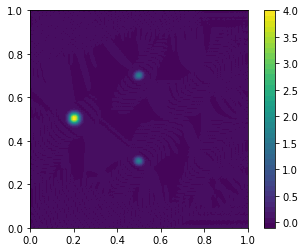

t = 0.54: error = 0.00746
3.967274676840931
-0.032975243114923045


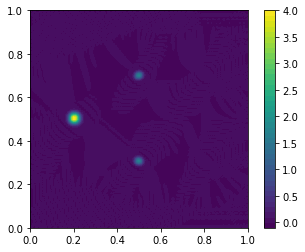

t = 0.54: error = 0.00744
3.9598370514656636
-0.03297663507351376


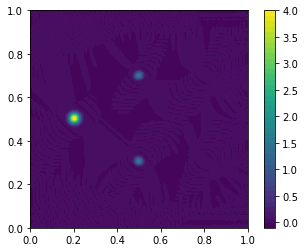

t = 0.54: error = 0.00742
3.95241956655343
-0.03297802321097522


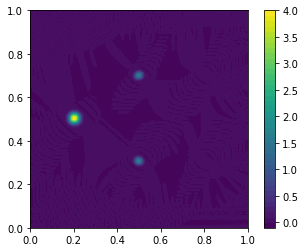

t = 0.55: error = 0.0074
3.945022269414172
-0.03297940792167902


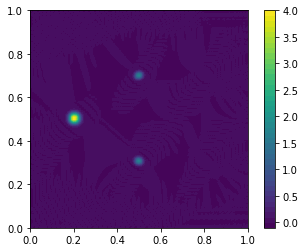

t = 0.55: error = 0.00738
3.9376452112095635
-0.03298078934383021


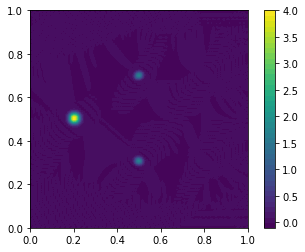

t = 0.55: error = 0.00736
3.9302884737722197
-0.03298216733151448


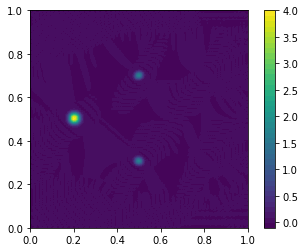

t = 0.55: error = 0.00734
3.922952177235113
-0.032983541548272224


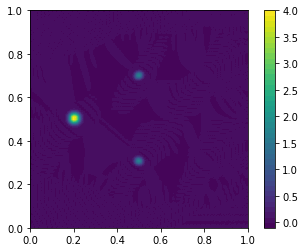

t = 0.55: error = 0.00732
3.9156364424195695
-0.03298491163453135


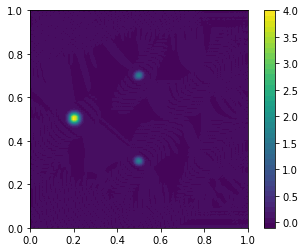

t = 0.56: error = 0.0073
3.908341360113198
-0.03298627736677424


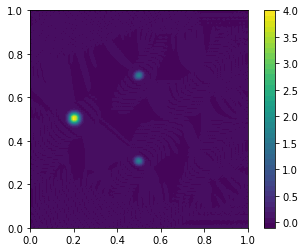

t = 0.56: error = 0.00727
3.901066983737602
-0.03298763873070545


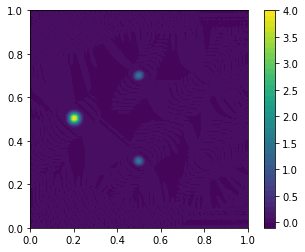

t = 0.56: error = 0.00725
3.8938133341095083
-0.032988995875275706


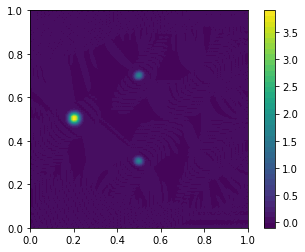

t = 0.56: error = 0.00723
3.8865804068878957
-0.03299034897792134


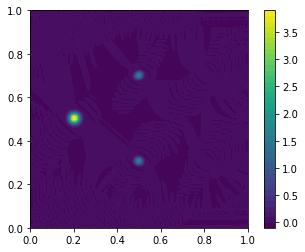

t = 0.56: error = 0.00721
3.8793681791645453
-0.03299169810084755


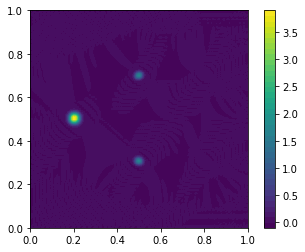

t = 0.57: error = 0.00719
3.8721766144722203
-0.03299304312263783


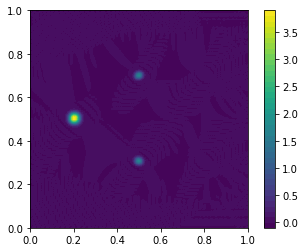

t = 0.57: error = 0.00717
3.8650056663902013
-0.032994383777372224


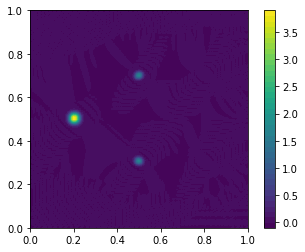

t = 0.57: error = 0.00715
3.8578552810992353
-0.032995719767775426


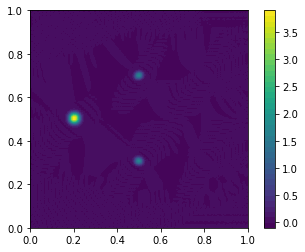

t = 0.57: error = 0.00713
3.8507253991961443
-0.03299705089411983


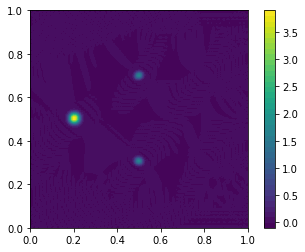

t = 0.57: error = 0.00711
3.843615956998743
-0.03299837715603429


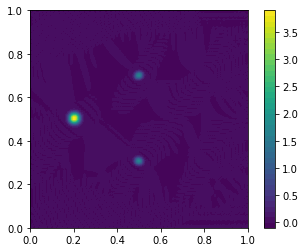

t = 0.58: error = 0.00709
3.836526887502596
-0.03299969879684758


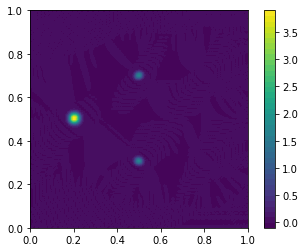

t = 0.58: error = 0.00707
3.829458121100086
-0.033001016262486256


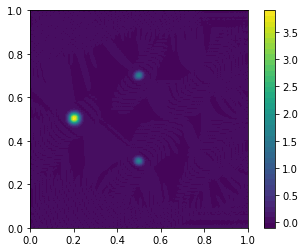

t = 0.58: error = 0.00705
3.8224095861364287
-0.03300233006880134


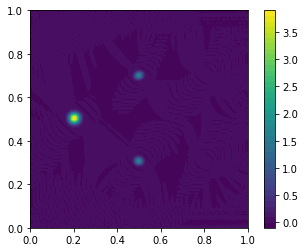

t = 0.58: error = 0.00703
3.8153812093524917
-0.033003640620873104


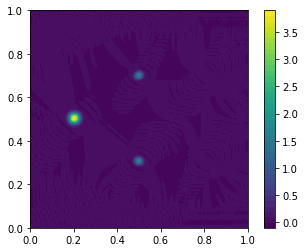

t = 0.58: error = 0.00701
3.808372916247091
-0.03300494806819001


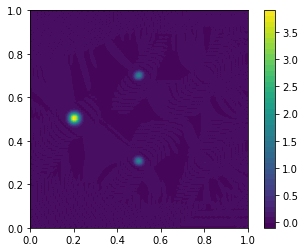

t = 0.59: error = 0.00699
3.801384631379551
-0.03300625226849669


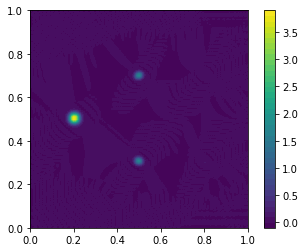

t = 0.59: error = 0.00697
3.7944162786253206
-0.033007552876924195


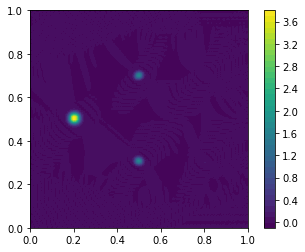

t = 0.59: error = 0.00695
3.787467781392241
-0.03300884951489964


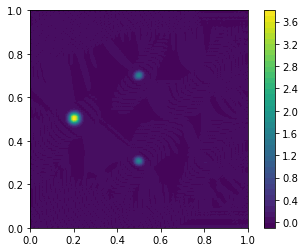

t = 0.59: error = 0.00693
3.7805390628021187
-0.0330101419372762


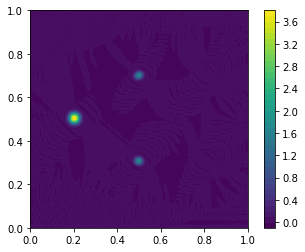

t = 0.59: error = 0.00691
3.77363004584074
-0.03301143011801753


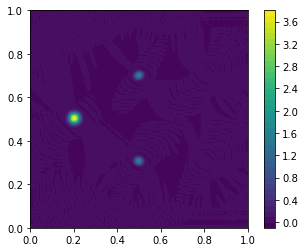

t = 0.60: error = 0.00689
3.76674065347908
-0.03301271421532077


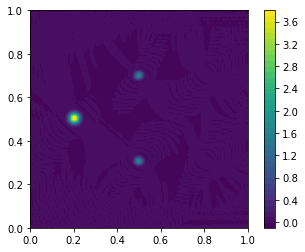

t = 0.60: error = 0.00687
3.7598708087684947
-0.03301399443909635


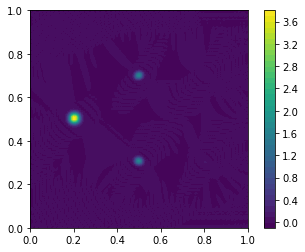

t = 0.60: error = 0.00685
3.7530204349128735
-0.033015270897604164


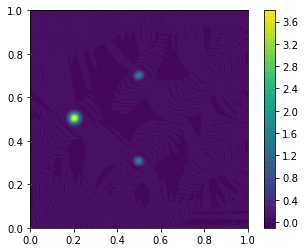

t = 0.60: error = 0.00683
3.746189455320883
-0.03301654351230268


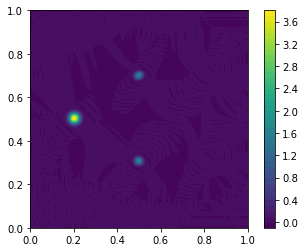

t = 0.60: error = 0.00681
3.739377793641352
-0.03301781204320594


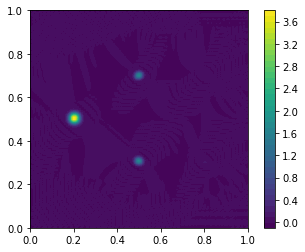

t = 0.61: error = 0.00679
3.7325853737847527
-0.03301907619816351


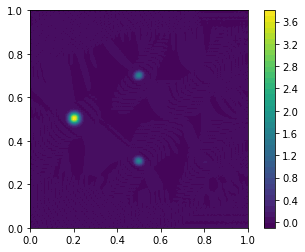

t = 0.61: error = 0.00677
3.7258121199335874
-0.03302033576732272


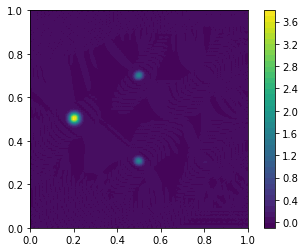

t = 0.61: error = 0.00675
3.71905795654437
-0.033021590734159244


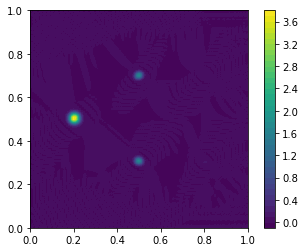

t = 0.61: error = 0.00674
3.712322808343748
-0.033022841326800466


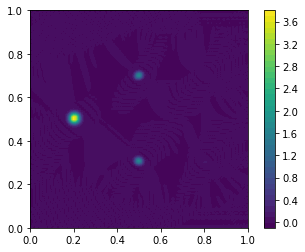

t = 0.61: error = 0.00672
3.7056066003211257
-0.03302408797884588


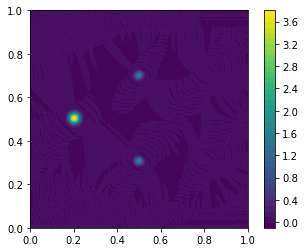

t = 0.62: error = 0.0067
3.698909257719775
-0.03302533119424059


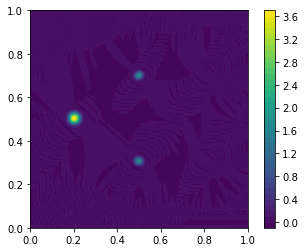

t = 0.62: error = 0.00668
3.69223070602802
-0.0330265713628267


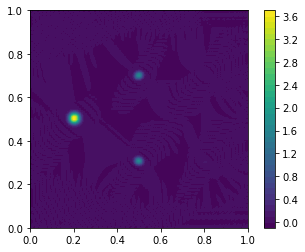

t = 0.62: error = 0.00666
3.6855708709716266
-0.03302780861399184


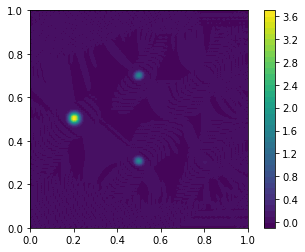

t = 0.62: error = 0.00664
3.6789296785082506
-0.033029042782711876


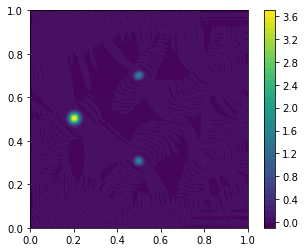

t = 0.62: error = 0.00662
3.672307054824685
-0.033030273503415336


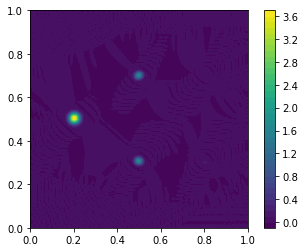

t = 0.63: error = 0.0066
3.665702926337678
-0.033031500384115724


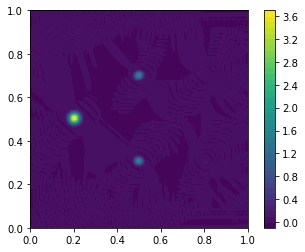

t = 0.63: error = 0.00659
3.659117219699051
-0.03303272317842724


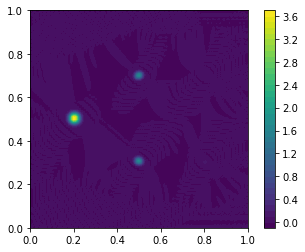

t = 0.63: error = 0.00657
3.652549861805536
-0.03303394187483399


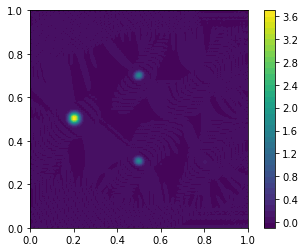

t = 0.63: error = 0.00655
3.646000779813083
-0.03303515666181285


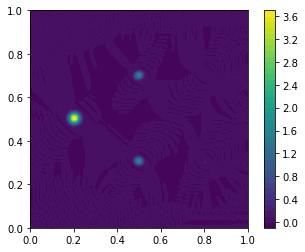

t = 0.63: error = 0.00653
3.6394699011543894
-0.033036367789479035


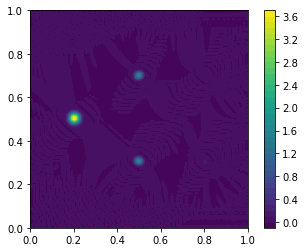

t = 0.64: error = 0.00651
3.6329571535574585
-0.03303757540483931


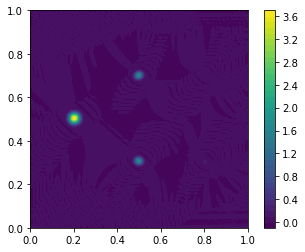

t = 0.64: error = 0.00649
3.6264624650624446
-0.033038779453672534


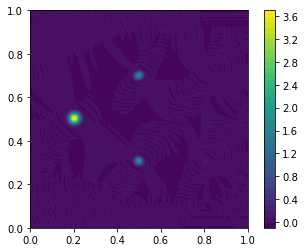

t = 0.64: error = 0.00648
3.619985764034169
-0.03303997969757734


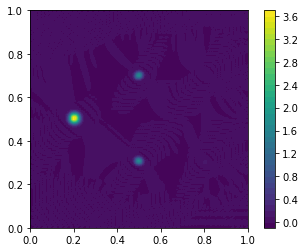

t = 0.64: error = 0.00646
3.6135269791686526
-0.03304117582502995


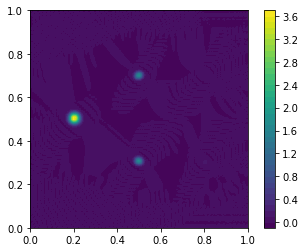

t = 0.64: error = 0.00644
3.6070860394935123
-0.03304236759742929


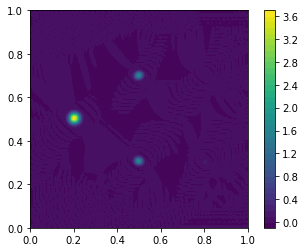

t = 0.65: error = 0.00642
3.600662874363717
-0.0330435549748145


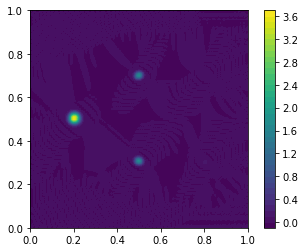

t = 0.65: error = 0.00641
3.5942574134554306
-0.03304473817625342


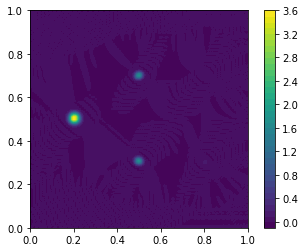

t = 0.65: error = 0.00639
3.5878695867611397
-0.0330459176394626


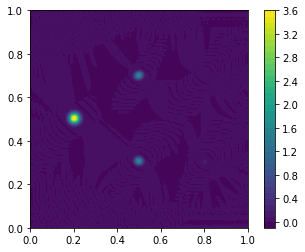

t = 0.65: error = 0.00637
3.581499324588758
-0.033047093876445575


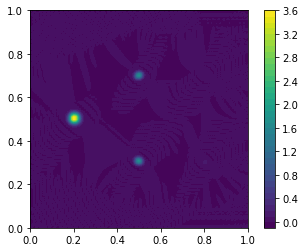

t = 0.65: error = 0.00635
3.5751466462084047
-0.033048267278588936


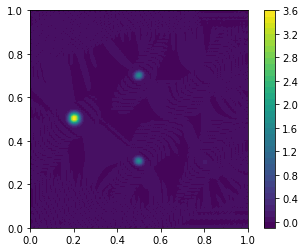

t = 0.66: error = 0.00633
3.568811775964977
-0.03304943796499338


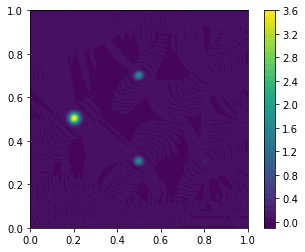

t = 0.66: error = 0.00632
3.562494969465307
-0.033050605750817835


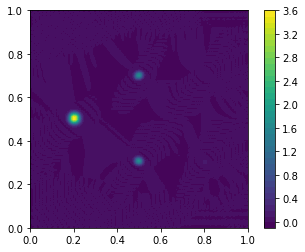

t = 0.66: error = 0.0063
3.5561963529354963
-0.033051770248568306


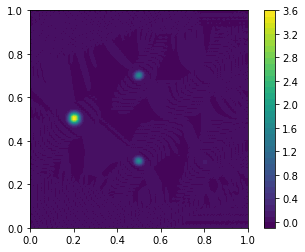

t = 0.66: error = 0.00628
3.5499160077856775
-0.033052931050587396


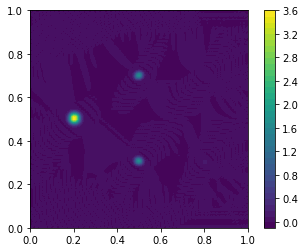

t = 0.66: error = 0.00626
3.543653983633395
-0.033054087907545125


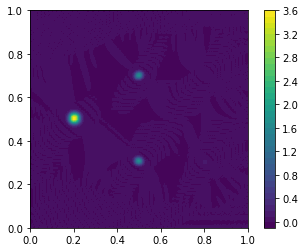

t = 0.67: error = 0.00624
3.537410296085678
-0.03305524082104928


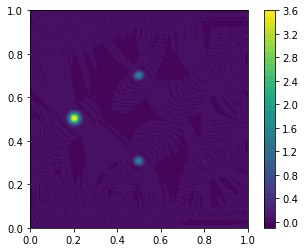

t = 0.67: error = 0.00623
3.53118493071909
-0.03305639000740531


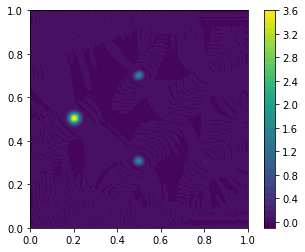

t = 0.67: error = 0.00621
3.5249778504969305
-0.033057535751882736


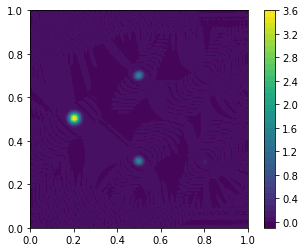

t = 0.67: error = 0.00619
3.518789011681541
-0.03305867823212602


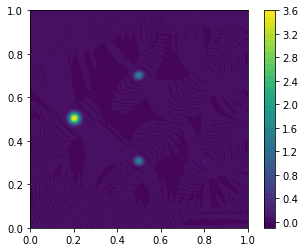

t = 0.67: error = 0.00617
3.512618512090418
-0.03305981740875205


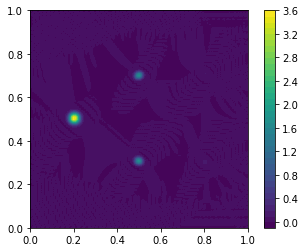

t = 0.68: error = 0.00615
3.5064666616430973
-0.03306095303744043


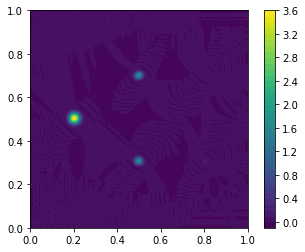

t = 0.68: error = 0.00613
3.5003337363048677
-0.03306208478394281


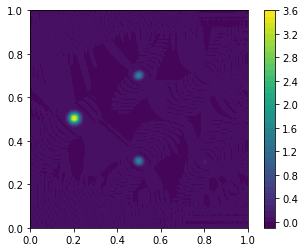

t = 0.68: error = 0.00611
3.494219849907804
-0.03306321238077834


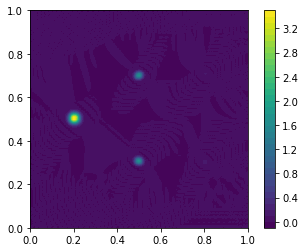

t = 0.68: error = 0.00609
3.4881250264485035
-0.03306433576464504


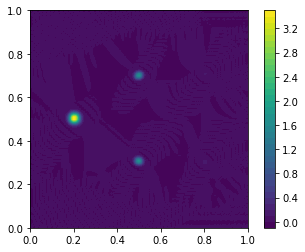

t = 0.68: error = 0.00608
3.482049241195495
-0.03306545514405501


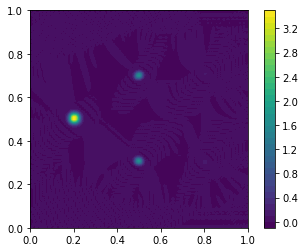

t = 0.69: error = 0.00606
3.4759924420116537
-0.03306657095920442


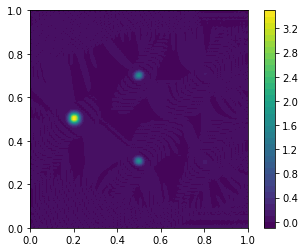

t = 0.69: error = 0.00604
3.469954560733367
-0.033067683731644995


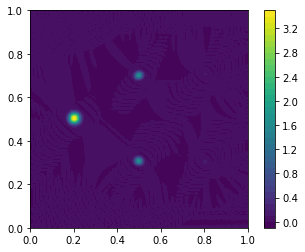

t = 0.69: error = 0.00602
3.463935519563108
-0.03306879386060945


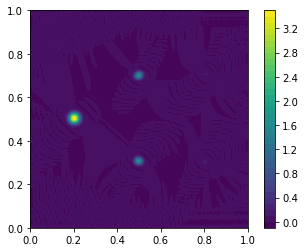

t = 0.69: error = 0.006
3.457935234840005
-0.03306990146465584


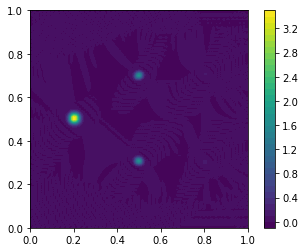

t = 0.69: error = 0.00598
3.451953619356089
-0.03307100634879194


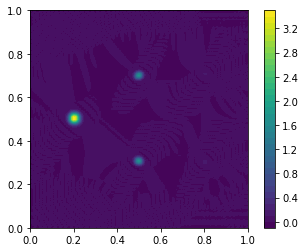

t = 0.70: error = 0.00596
3.445990583827196
-0.03307210810954957


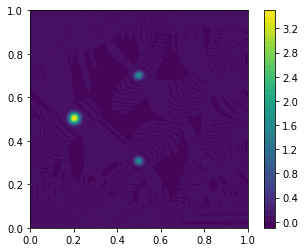

t = 0.70: error = 0.00594
3.4400460378530413
-0.03307320632379752


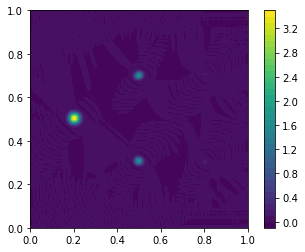

t = 0.70: error = 0.00593
3.4341198905585215
-0.03307430073439623


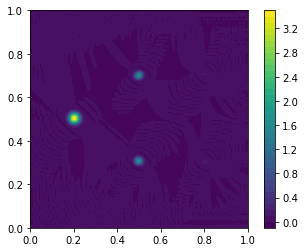

t = 0.70: error = 0.00591
3.428212051030426
-0.03307539134891137


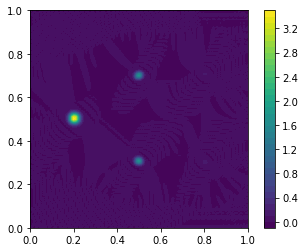

t = 0.70: error = 0.00589
3.422322428619626
-0.03307647840490372


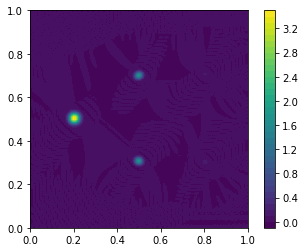

t = 0.71: error = 0.00587
3.4164509331529502
-0.033077562218403175


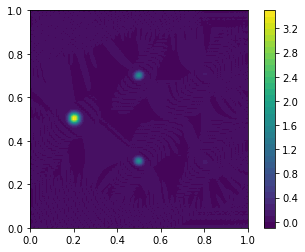

t = 0.71: error = 0.00585
3.41059747508337
-0.033078642996013055


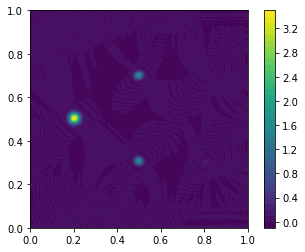

t = 0.71: error = 0.00584
3.4047619655973316
-0.0330797207147372


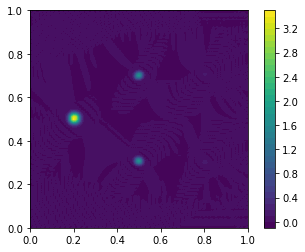

t = 0.71: error = 0.00582
3.3989443166917135
-0.033080795129610256


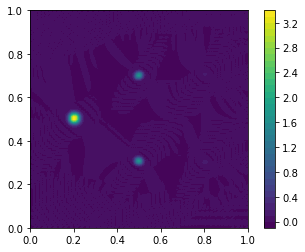

t = 0.71: error = 0.0058
3.393144441228371
-0.03308186589076478


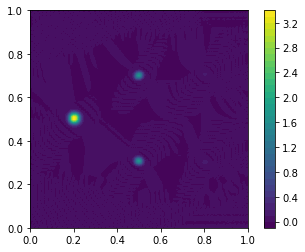

t = 0.72: error = 0.00578
3.387362252970999
-0.03308293270579225


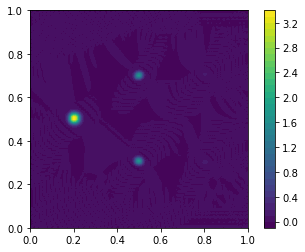

t = 0.72: error = 0.00576
3.3815976666066287
-0.03308399548466235


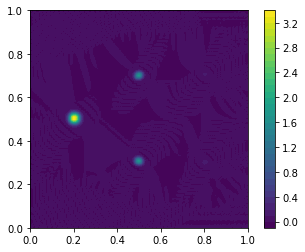

t = 0.72: error = 0.00575
3.3758505977524305
-0.033085054415612325


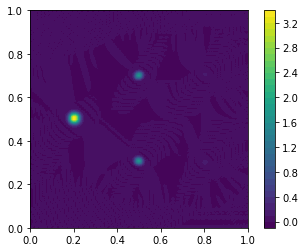

t = 0.72: error = 0.00573
3.370120962947621
-0.033086109931043106


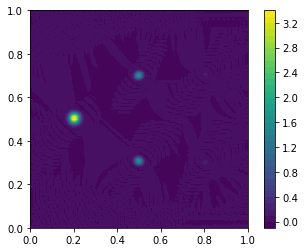

t = 0.72: error = 0.00571
3.3644086796303774
-0.033087162557464814


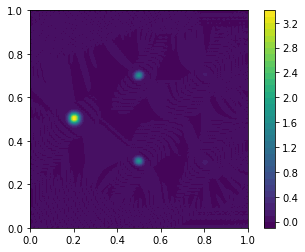

t = 0.73: error = 0.0057
3.358713666100515
-0.03308821270589159


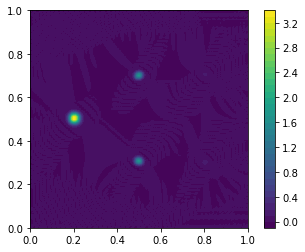

t = 0.73: error = 0.00568
3.353035841470397
-0.033089260505255506


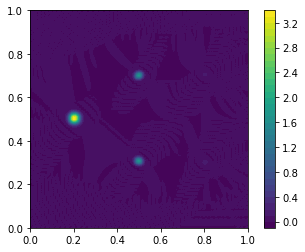

t = 0.73: error = 0.00566
3.3473751256084268
-0.033090305764009696


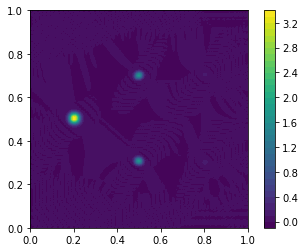

t = 0.73: error = 0.00564
3.341731439081239
-0.03309134807442835


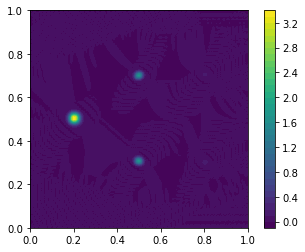

t = 0.73: error = 0.00563
3.3361047031015882
-0.033092387004704474


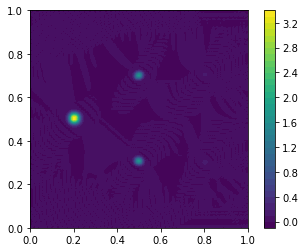

t = 0.74: error = 0.00561
3.330494839488613
-0.03309342229078343


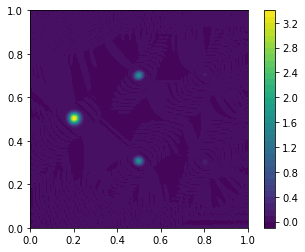

t = 0.74: error = 0.00559
3.3249017706454786
-0.0330944539421276


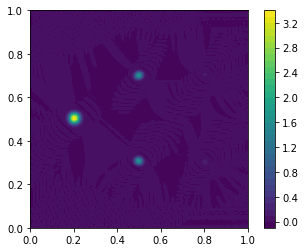

t = 0.74: error = 0.00558
3.3193254195565856
-0.033095482210690065


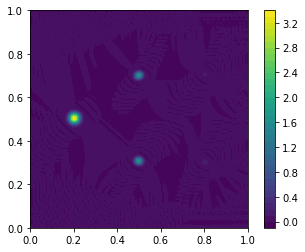

t = 0.74: error = 0.00556
3.313765709803241
-0.03309650743578791


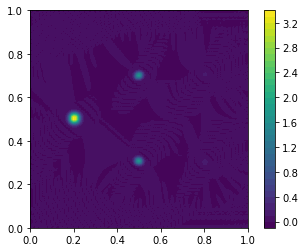

t = 0.74: error = 0.00554
3.3082225655934465
-0.03309752984562077


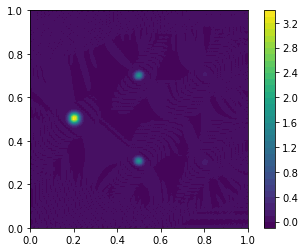

t = 0.75: error = 0.00553
3.30269591179911
-0.03309854942508213


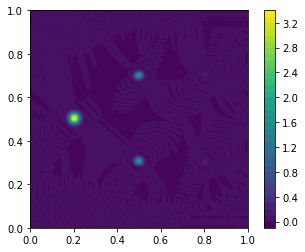

t = 0.75: error = 0.00551
3.297185673992842
-0.033099565918467654


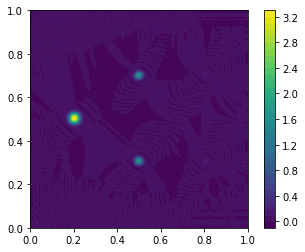

t = 0.75: error = 0.00549
3.29169177847671
-0.03310057895390993


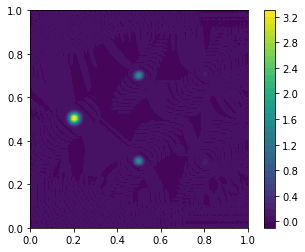

t = 0.75: error = 0.00548
3.286214152296771
-0.03310158822128649


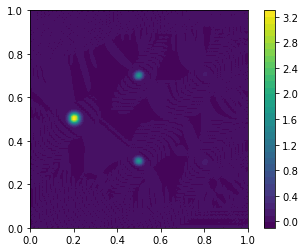

t = 0.75: error = 0.00546
3.280752723239419
-0.03310259362894522


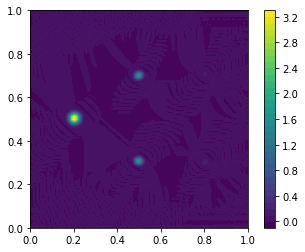

t = 0.76: error = 0.00545
3.2753074198082293
-0.033103595377933295


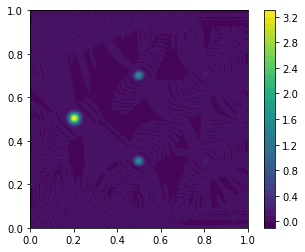

t = 0.76: error = 0.00543
3.269878171182487
-0.03310459391387092


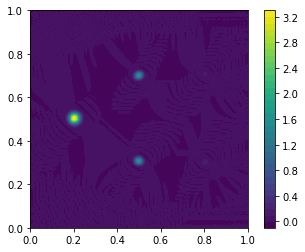

t = 0.76: error = 0.00541
3.2644649071607534
-0.03310558976060491


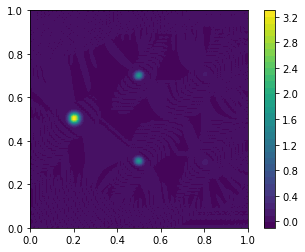

t = 0.76: error = 0.0054
3.2590675580943316
-0.03310658330277764


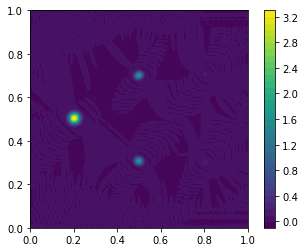

t = 0.76: error = 0.00538
3.25368605481632
-0.03310757462436286


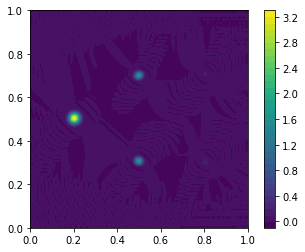

t = 0.77: error = 0.00537
3.2483203285720057
-0.03310856348490555


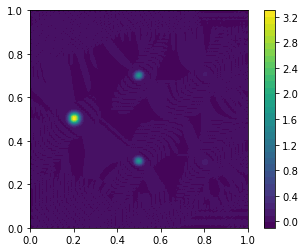

t = 0.77: error = 0.00535
3.2429703109557426
-0.033109549440562984


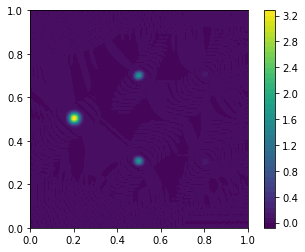

t = 0.77: error = 0.00533
3.237635933858292
-0.03311053204855426


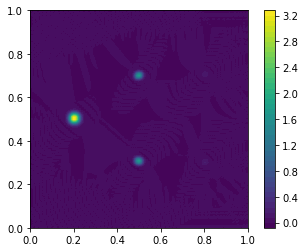

t = 0.77: error = 0.00532
3.23231712942698
-0.03311151106449472


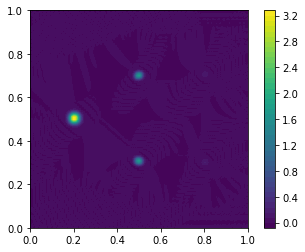

t = 0.77: error = 0.0053
3.22701383003928
-0.033112486546896164


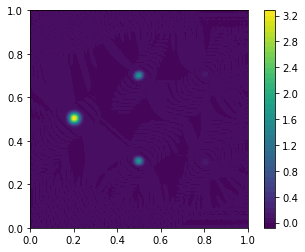

t = 0.78: error = 0.00529
3.2217259682887445
-0.033113458817938944


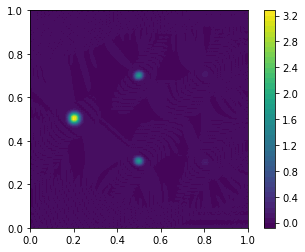

t = 0.78: error = 0.00527
3.216453476981003
-0.03311442829308618


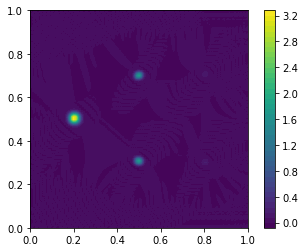

t = 0.78: error = 0.00526
3.2111962891370855
-0.0331153952630146


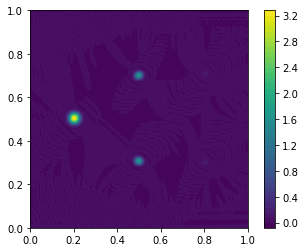

t = 0.78: error = 0.00524
3.205954338001746
-0.03311635974351359


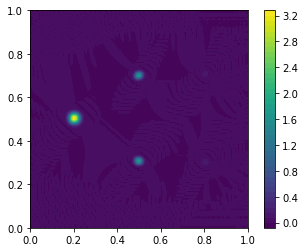

t = 0.78: error = 0.00523
3.2007275570556764
-0.033117321469278746


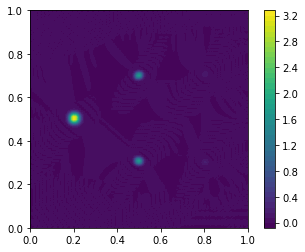

t = 0.79: error = 0.00521
3.1955158800321866
-0.03311828002509663


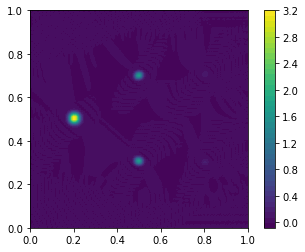

t = 0.79: error = 0.0052
3.1903192409403576
-0.033119235044400244


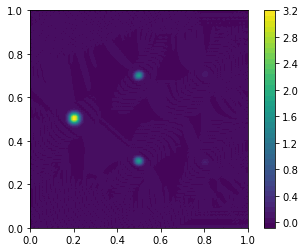

t = 0.79: error = 0.00518
3.1851375740973804
-0.033120186387857915


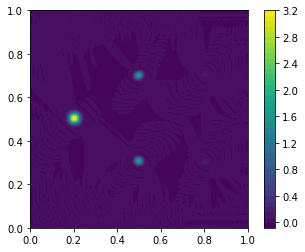

t = 0.79: error = 0.00517
3.179970814172187
-0.03312113422646623


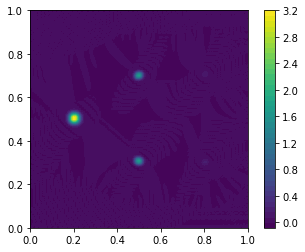

t = 0.79: error = 0.00515
3.1748188962406534
-0.03312207898604157


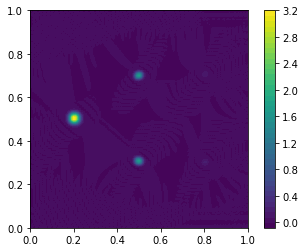

t = 0.80: error = 0.00514
3.169681755849853
-0.03312302116655869


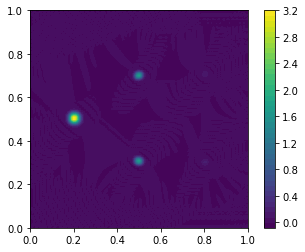

t = 0.80: error = 0.00512
3.164559329085833
-0.033123961116439886


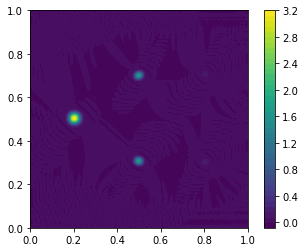

t = 0.80: error = 0.00511
3.159451552637094
-0.033124898876090395


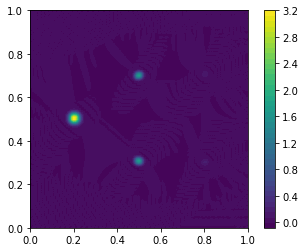

t = 0.80: error = 0.00509
3.1543583638449877
-0.03312583416787065


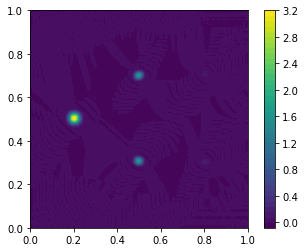

t = 0.80: error = 0.00508
3.1492797007330915
-0.033126766528898705


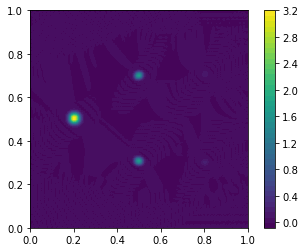

t = 0.81: error = 0.00506
3.1442155020101197
-0.03312769552015429


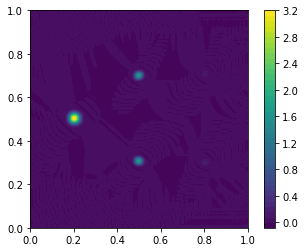

t = 0.81: error = 0.00505
3.1391657070445818
-0.033128620925385203


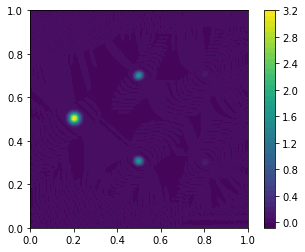

t = 0.81: error = 0.00504
3.1341302558134623
-0.03312954285843049


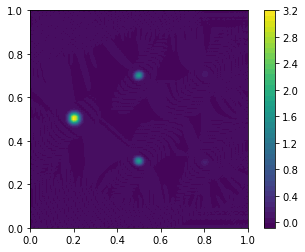

t = 0.81: error = 0.00502
3.1291090888306505
-0.033130461724889655


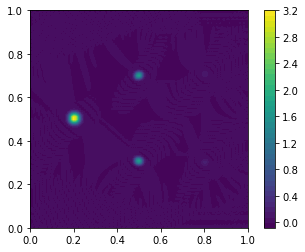

t = 0.81: error = 0.00501
3.12410214706318
-0.033131378043194826


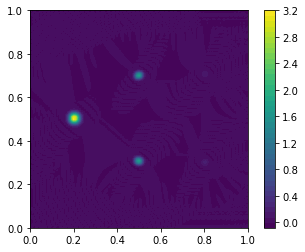

t = 0.82: error = 0.00499
3.119109371844071
-0.03313229220535506


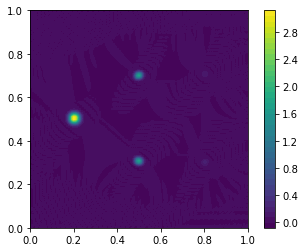

t = 0.82: error = 0.00498
3.1141307047897766
-0.03313320429924122


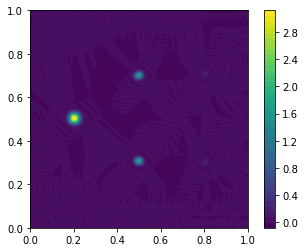

t = 0.82: error = 0.00496
3.109166087728424
-0.033134114080209345


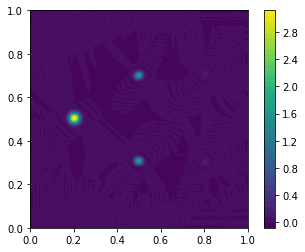

t = 0.82: error = 0.00495
3.104215462642637
-0.03313502109563671


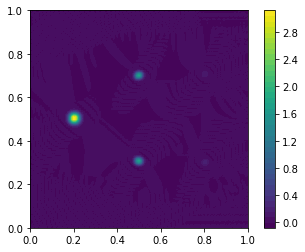

t = 0.82: error = 0.00494
3.099278771628599
-0.03313592489577045


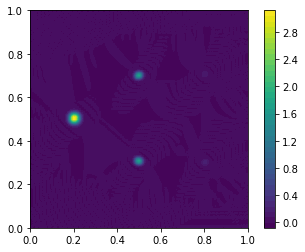

t = 0.83: error = 0.00492
3.0943559568713233
-0.03313682523911326


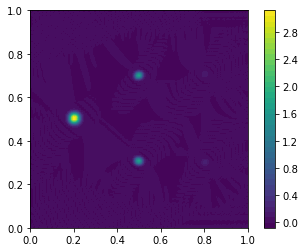

t = 0.83: error = 0.00491
3.089446960635206
-0.033137722205996145


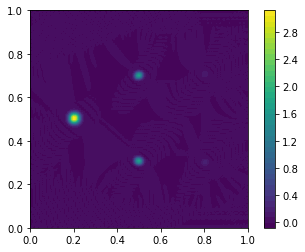

t = 0.83: error = 0.0049
3.084551725268703
-0.03313861616492996


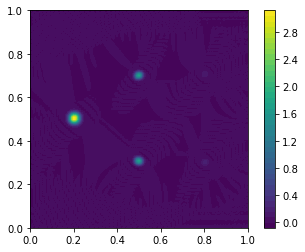

t = 0.83: error = 0.00488
3.0796701932220336
-0.033139507597440006


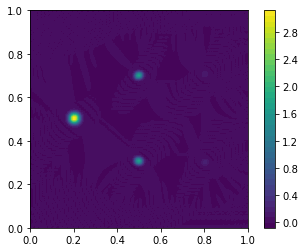

t = 0.83: error = 0.00487
3.07480230707698
-0.03314039686234088


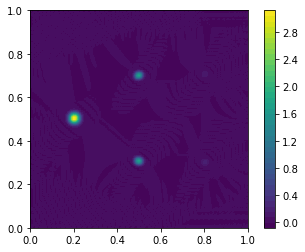

t = 0.84: error = 0.00485
3.0699480095877005
-0.03314128402177914


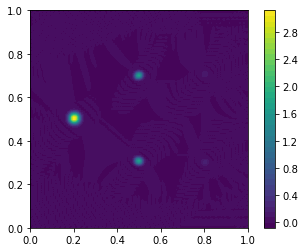

t = 0.84: error = 0.00484
3.0651072437310294
-0.033142168816227384


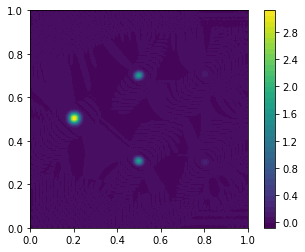

t = 0.84: error = 0.00483
3.0602799527638767
-0.033143050790175745


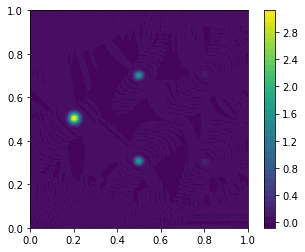

t = 0.84: error = 0.00481
3.055466080284406
-0.03314392950167647


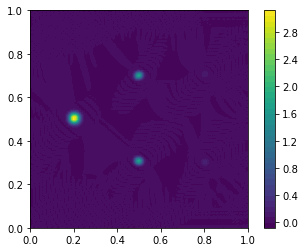

t = 0.84: error = 0.0048
3.0506655702926184
-0.033144804727576395


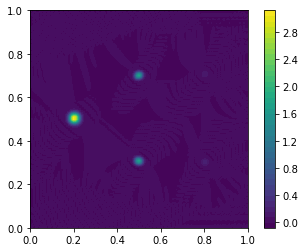

t = 0.85: error = 0.00479
3.0458783672452987
-0.03314567658085378


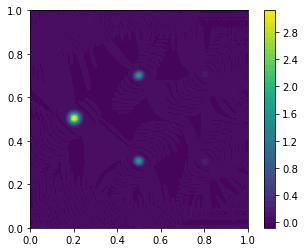

t = 0.85: error = 0.00477
3.0411044160999223
-0.03314654548134015


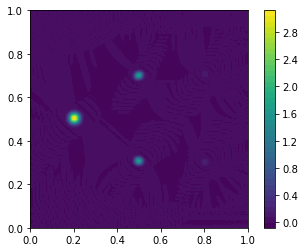

t = 0.85: error = 0.00476
3.036343697094423
-0.033147411978383653


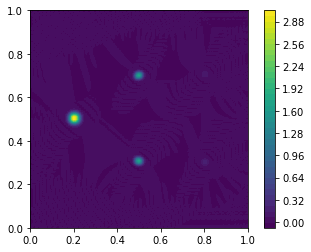

t = 0.85: error = 0.00475
3.031596238867483
-0.03314827650244871


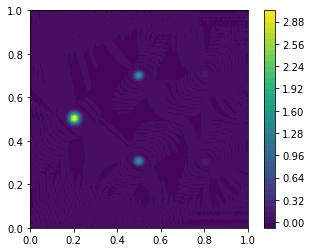

t = 0.85: error = 0.00473
3.0268621333015564
-0.03314913917136062


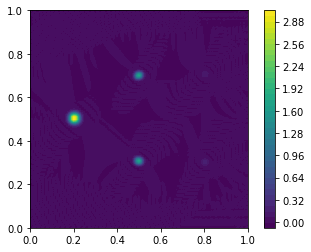

t = 0.86: error = 0.00472
3.022141494823662
-0.03314999974814083


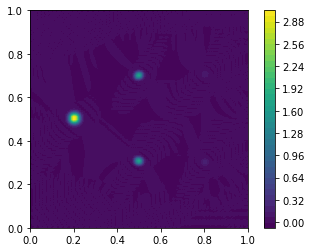

t = 0.86: error = 0.00471
3.017434415417887
-0.03315085776157453


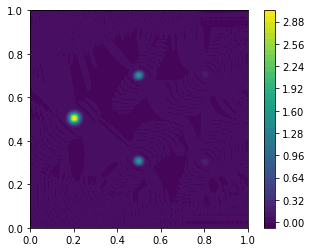

t = 0.86: error = 0.00469
3.0127409528219222
-0.03315171272499624


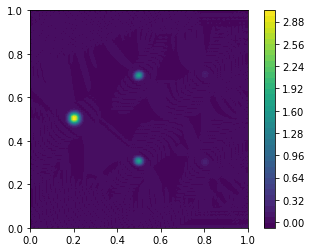

t = 0.86: error = 0.00468
3.008061135142825
-0.03315256435788883


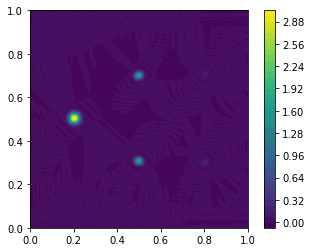

t = 0.86: error = 0.00467
3.0033949681549945
-0.03315341271643577


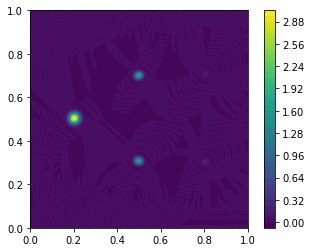

t = 0.87: error = 0.00465
2.9987424414933486
-0.0331542581692249


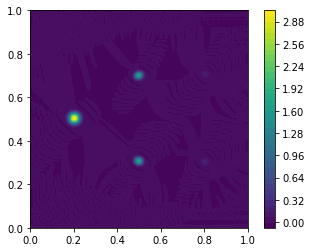

t = 0.87: error = 0.00464
2.994103533210162
-0.03315510121878587


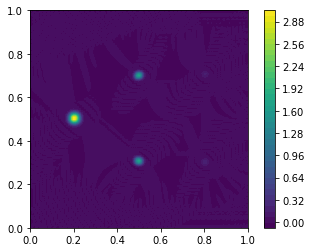

t = 0.87: error = 0.00463
2.989478212979914
-0.0331559422517425


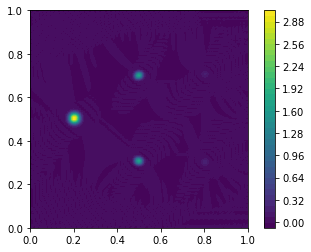

t = 0.87: error = 0.00461
2.9848664443347386
-0.033156781348194955


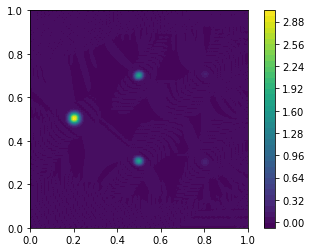

t = 0.87: error = 0.0046
2.9802681862402873
-0.0331576182461511


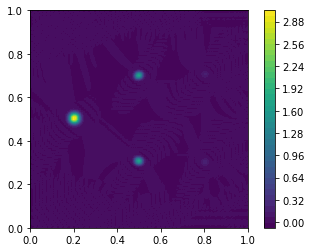

t = 0.88: error = 0.00458
2.9756833942319707
-0.033158452466875175


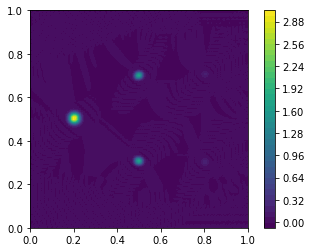

t = 0.88: error = 0.00457
2.97111202125973
-0.03315928353416091


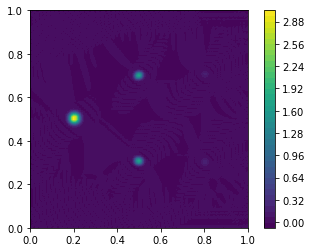

t = 0.88: error = 0.00456
2.9665540183382886
-0.03316011119644734


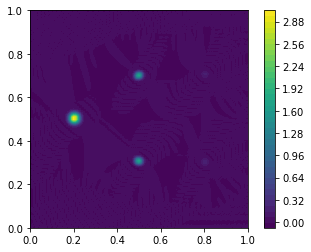

t = 0.88: error = 0.00454
2.9620093350646606
-0.03316093556159406


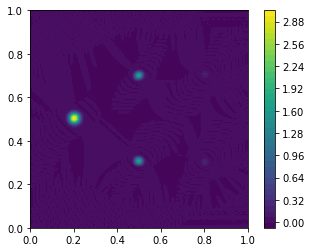

t = 0.88: error = 0.00453
2.9574779200409327
-0.033161757076205216


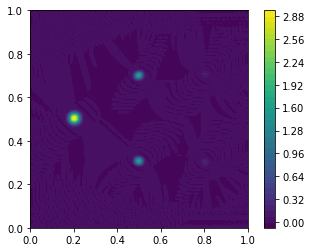

t = 0.89: error = 0.00452
2.952959721224355
-0.0331625763416143


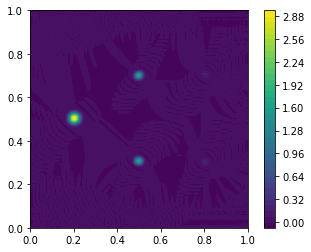

t = 0.89: error = 0.00451
2.948454686216402
-0.03316339384536473


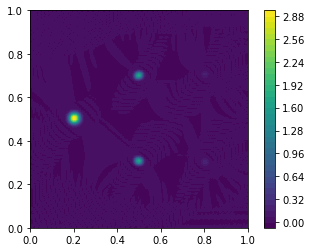

t = 0.89: error = 0.00449
2.9439627624961444
-0.033164209744240884


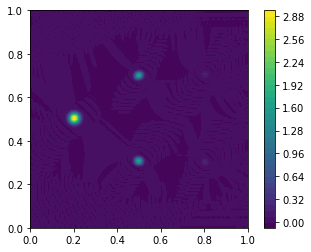

t = 0.89: error = 0.00448
2.9394838976001267
-0.03316502380688587


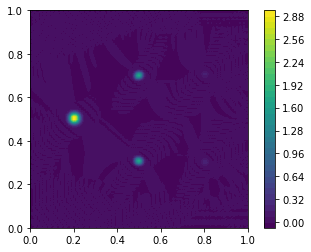

t = 0.89: error = 0.00447
2.935018039250151
-0.033165835533333375


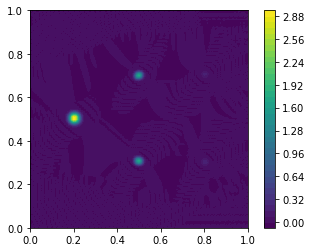

t = 0.90: error = 0.00445
2.930565135431421
-0.033166644386441964


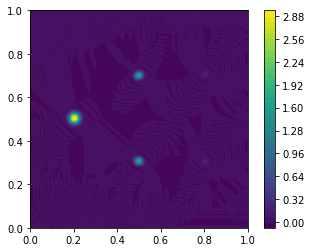

t = 0.90: error = 0.00444
2.92612513442555
-0.033167450034303506


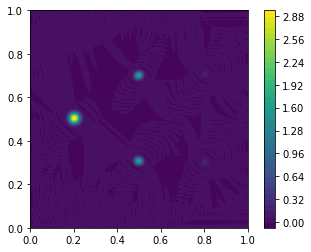

t = 0.90: error = 0.00443
2.9216979848054465
-0.033168252500501635


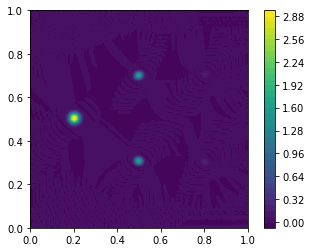

t = 0.90: error = 0.00441
2.917283635401362
-0.033169052149061615


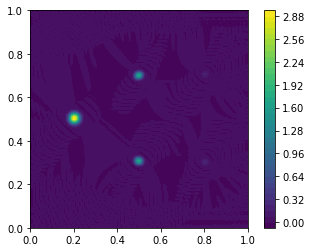

t = 0.90: error = 0.0044
2.912882035248777
-0.033169849500647816


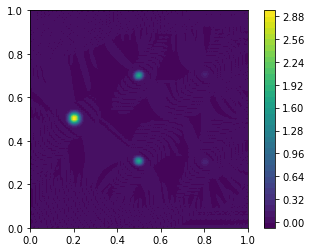

t = 0.91: error = 0.00439
2.908493133529132
-0.03317064496692898


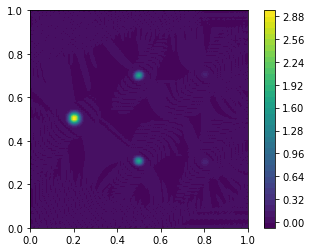

t = 0.91: error = 0.00438
2.904116879513436
-0.03317143864366013


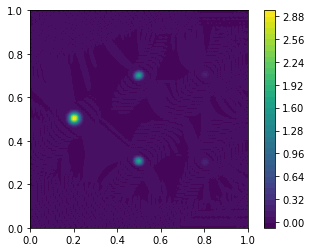

t = 0.91: error = 0.00436
2.8997532225167224
-0.033172230266999315


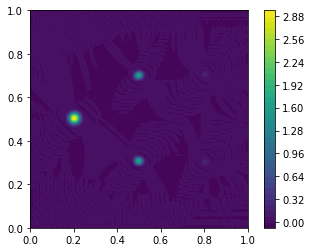

t = 0.91: error = 0.00435
2.89540211186849
-0.03317301934034497


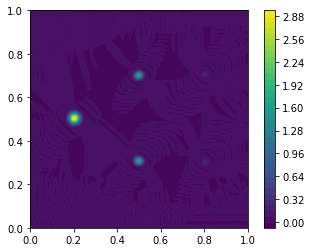

t = 0.91: error = 0.00434
2.8910634969012268
-0.033173805361749055


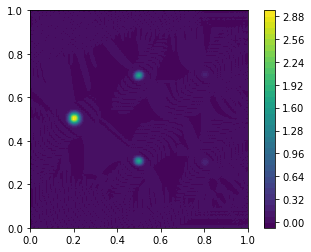

t = 0.92: error = 0.00433
2.886737326956253
-0.03317458805788105


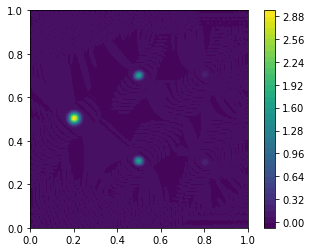

t = 0.92: error = 0.00431
2.882423654216359
-0.03317536753097213


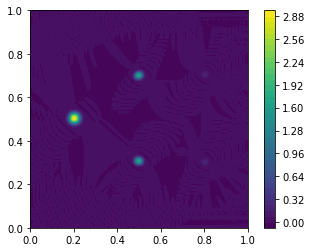

t = 0.92: error = 0.0043
2.8781226007307494
-0.03317614424497219


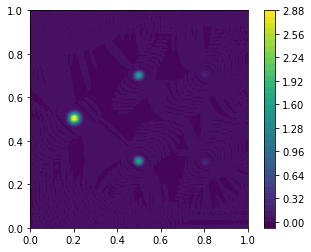

t = 0.92: error = 0.00429
2.873834277262996
-0.033176918837647826


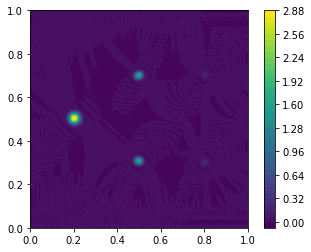

t = 0.92: error = 0.00428
2.869558794451146
-0.03317769183775123


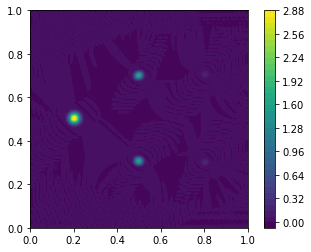

t = 0.93: error = 0.00426
2.8652962379806266
-0.03317846343046879


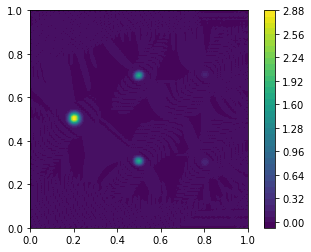

t = 0.93: error = 0.00425
2.861046654243741
-0.03317923338905992


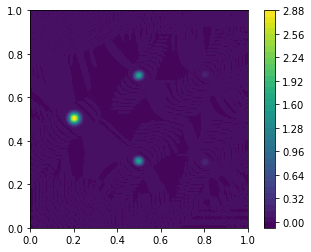

t = 0.93: error = 0.00424
2.856810057367223
-0.03318000119366065


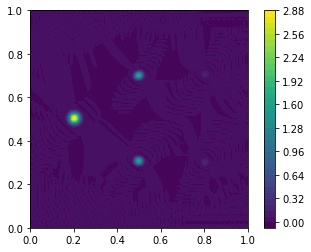

t = 0.93: error = 0.00422
2.8525864387448587
-0.033180766270400855


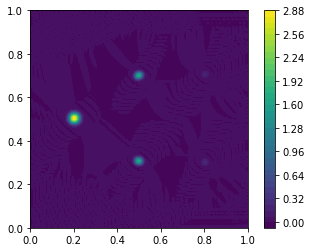

t = 0.93: error = 0.00421
2.8483757745072347
-0.033181528247479546


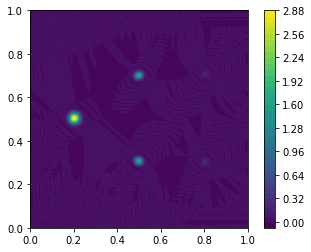

t = 0.94: error = 0.0042
2.844178030665396
-0.03318228712195821


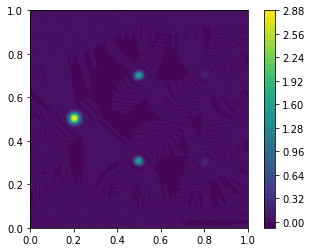

t = 0.94: error = 0.00418
2.8399931665125955
-0.033183043257422405


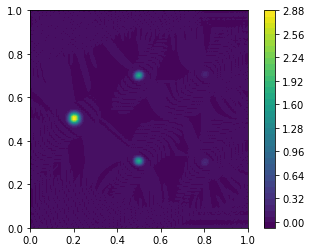

t = 0.94: error = 0.00417
2.8358211368507367
-0.033183797201108874


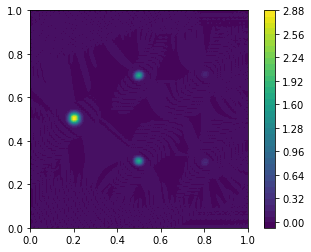

t = 0.94: error = 0.00416
2.8316618934484237
-0.033184549404695875


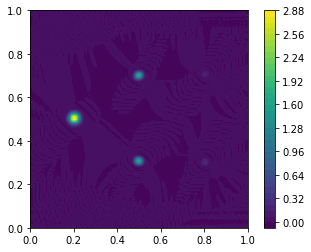

t = 0.94: error = 0.00415
2.827515385999794
-0.03318529999640767


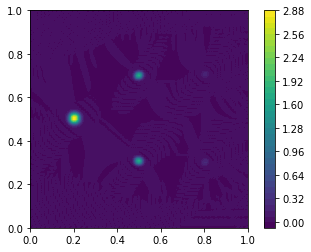

t = 0.95: error = 0.00413
2.823381562758434
-0.03318604872151375


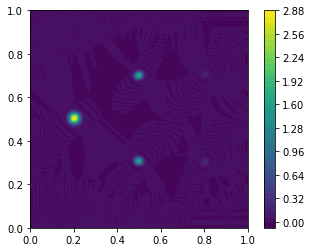

t = 0.95: error = 0.00412
2.819260370959769
-0.03318679506586435


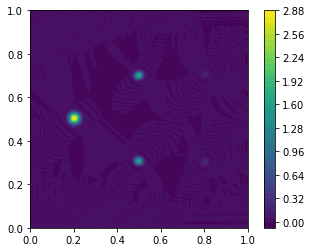

t = 0.95: error = 0.00411
2.8151517571066966
-0.03318753849221372


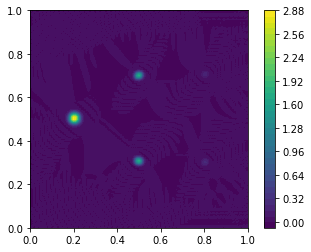

t = 0.95: error = 0.0041
2.81105566716847
-0.03318827869109878


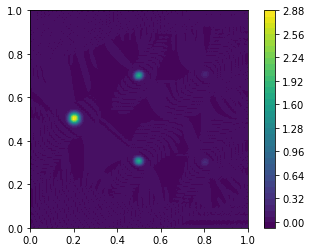

t = 0.95: error = 0.00408
2.806972046726259
-0.033189015746198154


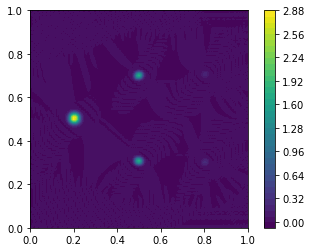

t = 0.96: error = 0.00407
2.80290084108723
-0.033189750131745605


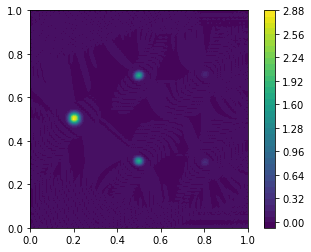

t = 0.96: error = 0.00406
2.798841995380528
-0.03319048252146941


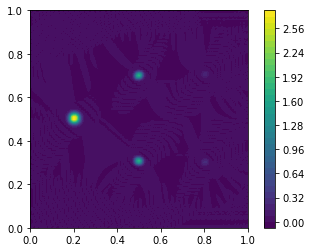

t = 0.96: error = 0.00405
2.794795454642347
-0.033191213488249556


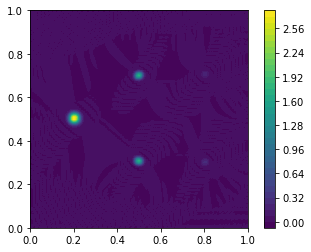

t = 0.96: error = 0.00403
2.790761163892908
-0.03319194324645956


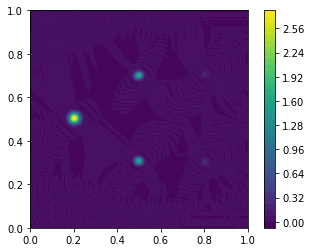

t = 0.96: error = 0.00402
2.78673906820554
-0.03319267156638731


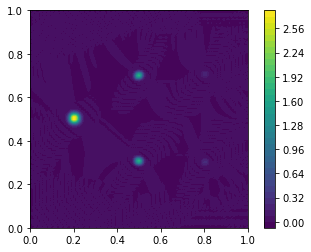

t = 0.97: error = 0.00401
2.7827291127669
-0.03319339789052552


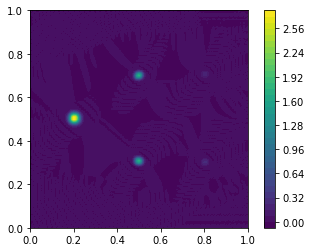

t = 0.97: error = 0.004
2.778731242927537
-0.03319412158737605


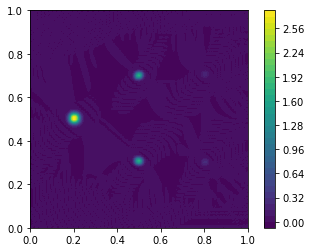

t = 0.97: error = 0.00399
2.7747454042430735
-0.033194842233874165


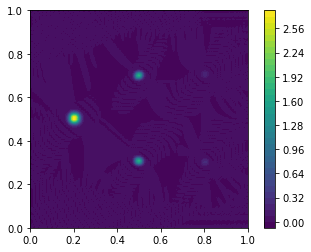

t = 0.97: error = 0.00397
2.7707715551708594
-0.033195559807545176


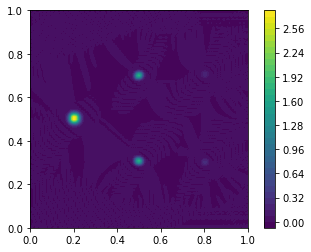

t = 0.97: error = 0.00396
2.766809690794343
-0.033196274695293085


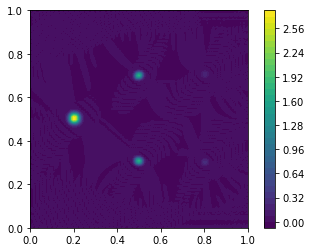

t = 0.98: error = 0.00395
2.7628598594074503
-0.0331969875016632


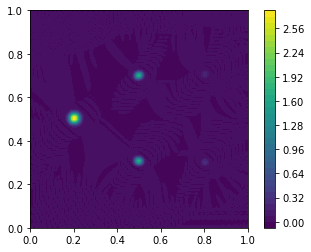

t = 0.98: error = 0.00394
2.75892236516963
-0.03319769874577305


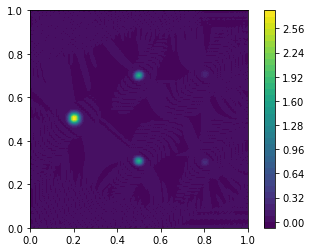

t = 0.98: error = 0.00392
2.7549974472790733
-0.03319840860569768


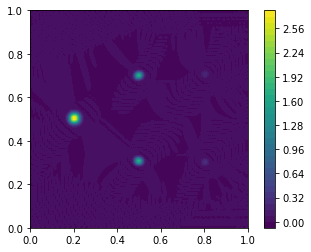

t = 0.98: error = 0.00391
2.7510852003715507
-0.03319911683920172


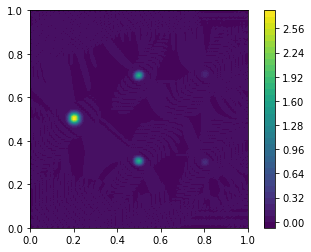

t = 0.98: error = 0.0039
2.7471856400268715
-0.03319982290520875


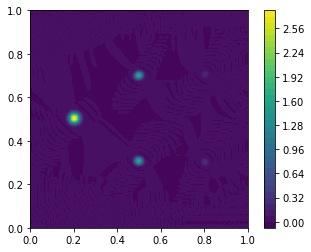

t = 0.99: error = 0.00389
2.743298742195993
-0.03320052621702844


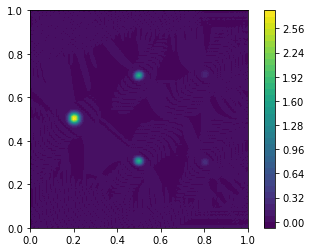

t = 0.99: error = 0.00387
2.7394244631430835
-0.03320122641838616


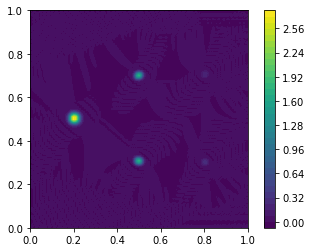

t = 0.99: error = 0.00386
2.735562749371382
-0.03320192356590396


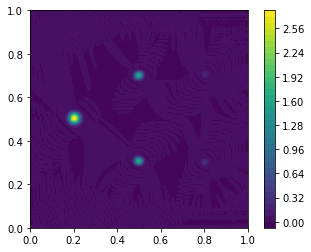

t = 0.99: error = 0.00385
2.7317135426635457
-0.033202618126456855


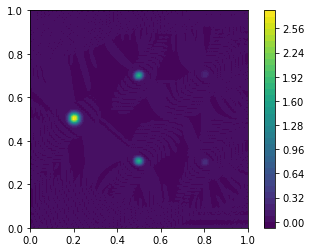

t = 0.99: error = 0.00384
2.727876782707413
-0.033203310772529956


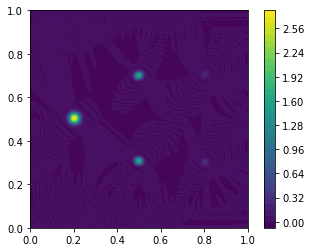

t = 1.00: error = 0.00382
2.724052408487486
-0.03320400206650807


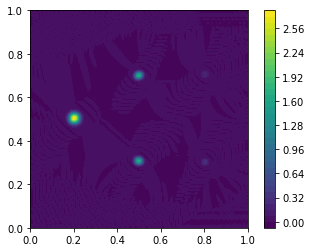

t = 1.00: error = 0.00381
2.7202403590196136
-0.03320469219775006


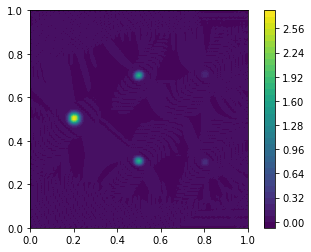

t = 1.00: error = 0.0038
2.716440573722224
-0.033205380904726044


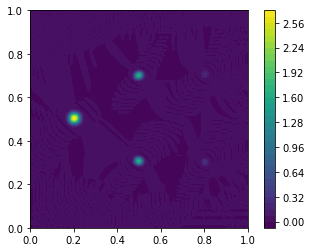

t = 1.00: error = 0.00379
2.7126529925801686
-0.033206067603696696


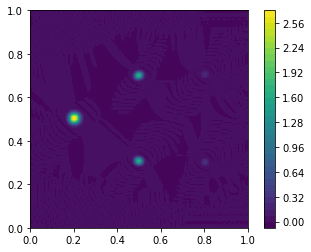

t = 1.00: error = 0.00378
2.7088775561888343
-0.033206751651278676


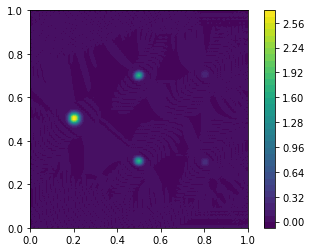

t = 1.01: error = 0.00376
2.7051142057307764
-0.033207432633192334


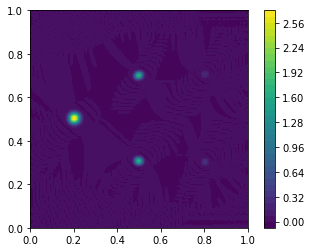

t = 1.01: error = 0.00375
2.7013628829177327
-0.033208110564240195


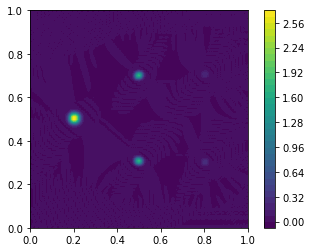

t = 1.01: error = 0.00374
2.697623529919413
-0.033208785902414786


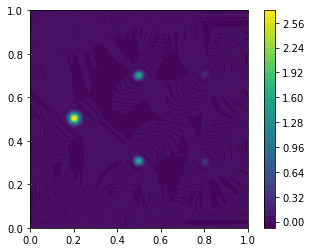

t = 1.01: error = 0.00373
2.6938960892928767
-0.03320945935017262


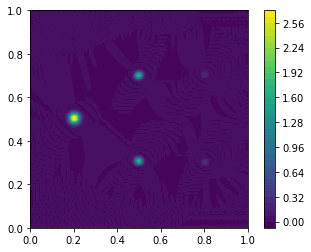

t = 1.01: error = 0.00372
2.690180503920857
-0.03321013152801953


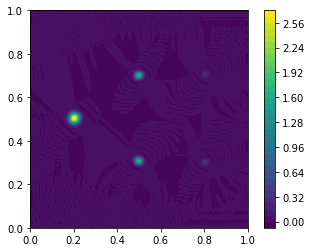

t = 1.02: error = 0.0037
2.6864767169632473
-0.03321080268752806


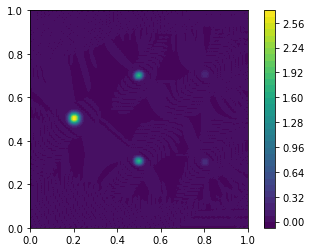

t = 1.02: error = 0.00369
2.6827846718229
-0.03321147260775431


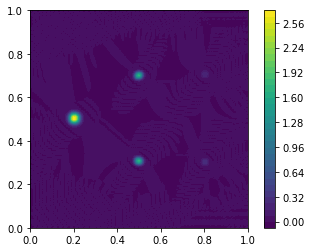

t = 1.02: error = 0.00368
2.6791043121247875
-0.03321214071021427


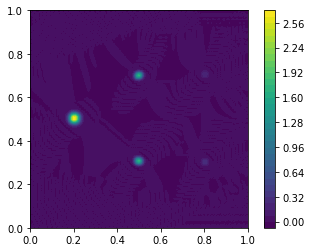

t = 1.02: error = 0.00367
2.67543558170644
-0.03321280632540857


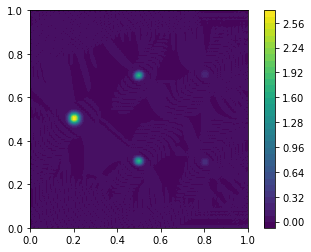

t = 1.02: error = 0.00366
2.671778492906541
-0.03321346899648324


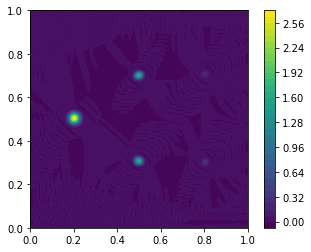

t = 1.03: error = 0.00365
2.6681331307661433
-0.033214128693029144


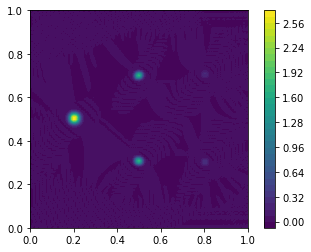

t = 1.03: error = 0.00363
2.6644997012919527
-0.03321478583074181


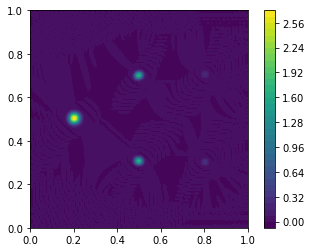

t = 1.03: error = 0.00362
2.6608784942361368
-0.03321544107131278


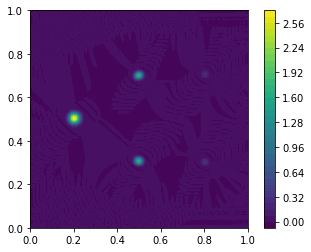

t = 1.03: error = 0.00361
2.6572696786716077
-0.03321609499415016


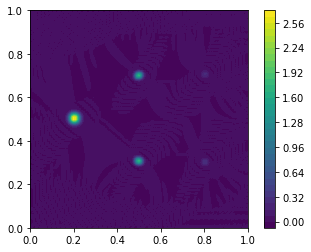

t = 1.03: error = 0.0036
2.6536732965651852
-0.03321674781270708


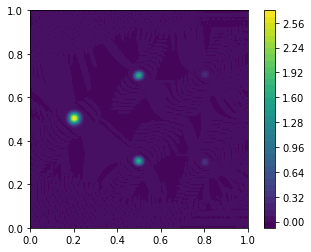

t = 1.04: error = 0.00358
2.650089324495251
-0.03321739927888896


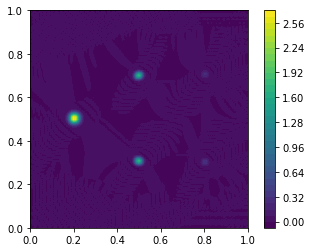

t = 1.04: error = 0.00357
2.6465177081763636
-0.03321804880624504


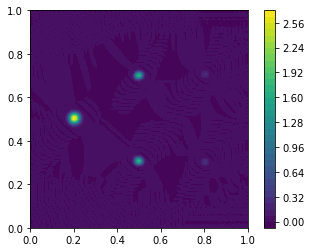

t = 1.04: error = 0.00356
2.642958379430116
-0.033218695740792184


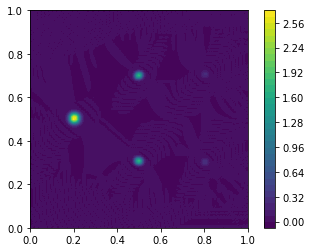

t = 1.04: error = 0.00355
2.63941126437574
-0.03321933966460145


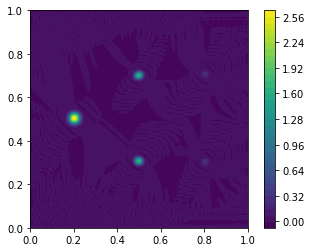

t = 1.04: error = 0.00353
2.6358762874048614
-0.03321998060605956


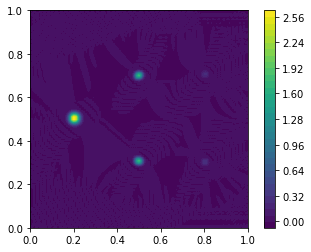

t = 1.05: error = 0.00352
2.6323533731143907
-0.03322061905246652


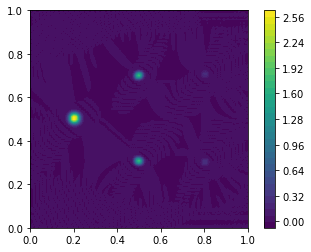

t = 1.05: error = 0.00351
2.6288424472262166
-0.03322125573873785


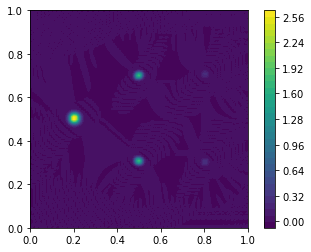

t = 1.05: error = 0.0035
2.6253434369893194
-0.03322189130462774


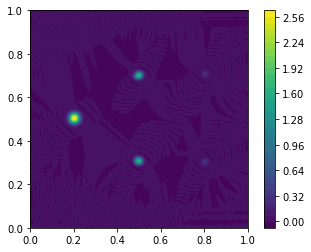

t = 1.05: error = 0.00349
2.621856271309994
-0.03322252599706617


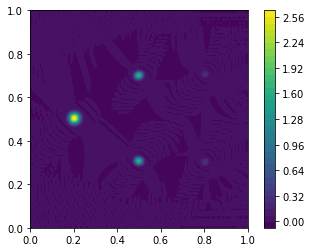

t = 1.05: error = 0.00348
2.618380880736689
-0.03322315956714285


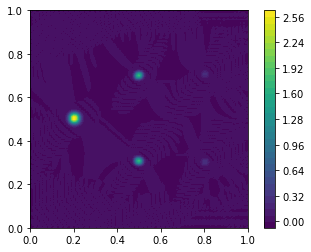

t = 1.06: error = 0.00346
2.61491719736802
-0.03322379139439871


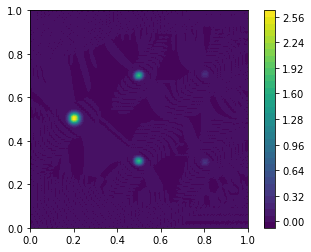

t = 1.06: error = 0.00345
2.611465154723801
-0.03322442076646094


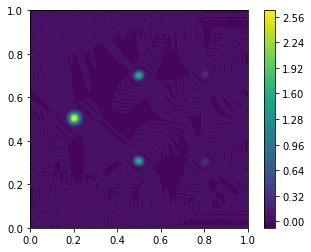

t = 1.06: error = 0.00344
2.608024687604023
-0.0332250471981279


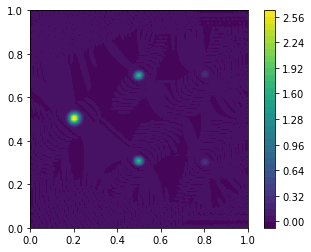

t = 1.06: error = 0.00343
2.6045957319523168
-0.033225670661213805


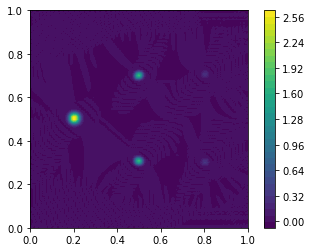

t = 1.06: error = 0.00342
2.601178224734846
-0.033226291613716166


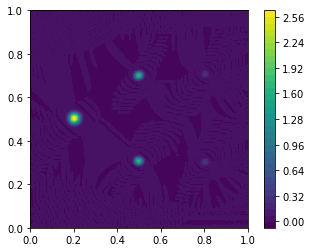

t = 1.07: error = 0.00341
2.5977721038411836
-0.033226910793538185


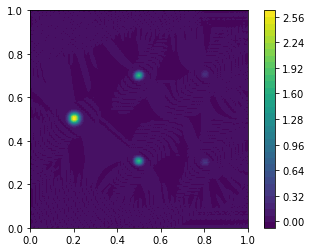

t = 1.07: error = 0.00339
2.5943773080098125
-0.03322752886626199


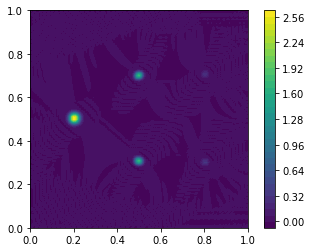

t = 1.07: error = 0.00338
2.5909937767773936
-0.03322814610962401


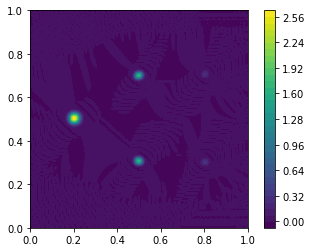

t = 1.07: error = 0.00337
2.587621450448044
-0.03322876229338834


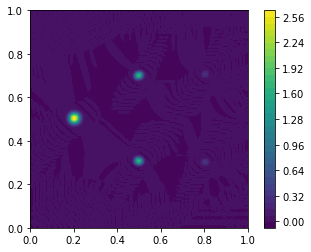

t = 1.07: error = 0.00336
2.584260270076807
-0.033229376795830275


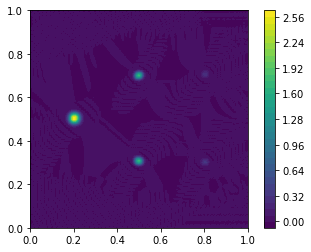

t = 1.08: error = 0.00335
2.5809101774605985
-0.03322998888819314


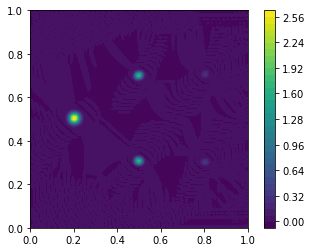

t = 1.08: error = 0.00334
2.5775711151302607
-0.03323059806720719


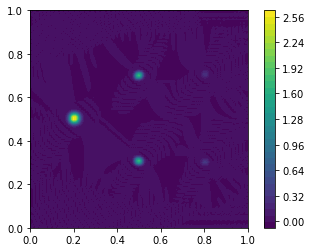

t = 1.08: error = 0.00333
2.5742430263388005
-0.033231204297819616


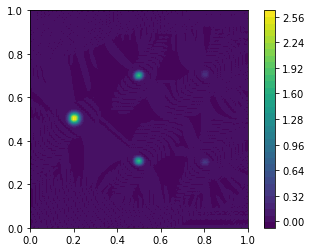

t = 1.08: error = 0.00332
2.570925855043115
-0.033231808047282665


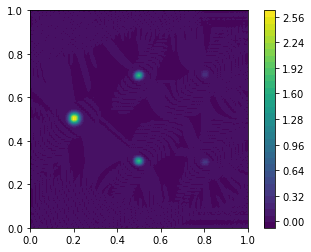

t = 1.08: error = 0.00331
2.5676195458788658
-0.0332324100739391


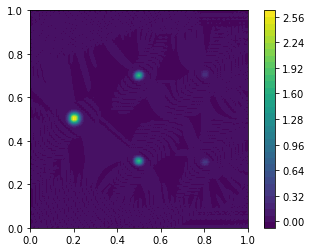

t = 1.09: error = 0.0033
2.5643240441301356
-0.03323301106361246


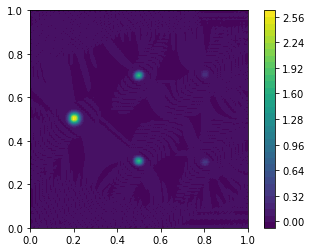

t = 1.09: error = 0.00328
2.561039295696573
-0.03323361130215987


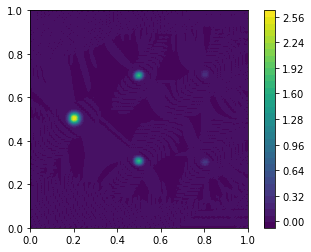

t = 1.09: error = 0.00327
2.5577652470608503
-0.033234210548711694


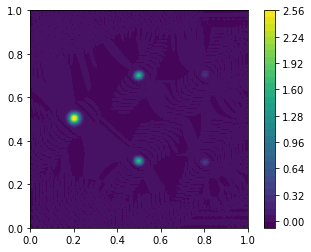

t = 1.09: error = 0.00326
2.554501845258549
-0.03323480815497724


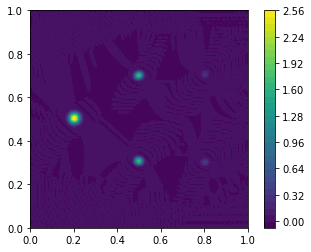

t = 1.09: error = 0.00325
2.551249037851542
-0.03323540336146312


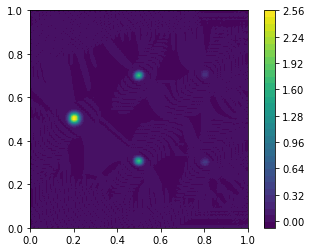

t = 1.10: error = 0.00324
2.5480067729050133
-0.033235995645138725


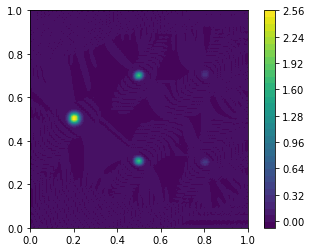

t = 1.10: error = 0.00323
2.5447749989677657
-0.03323658497273539


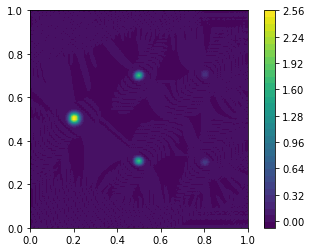

t = 1.10: error = 0.00322
2.5415536650555635
-0.033237171835234336


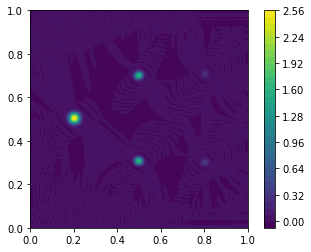

t = 1.10: error = 0.00321
2.538342720637724
-0.033237757027278755


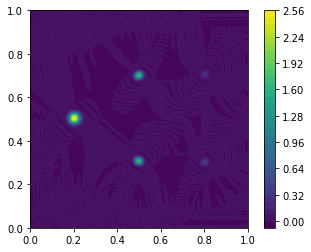

t = 1.10: error = 0.0032
2.535142115627637
-0.03323834126977735


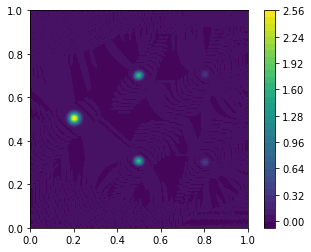

t = 1.11: error = 0.00319
2.5319518003779975
-0.033238924871167516


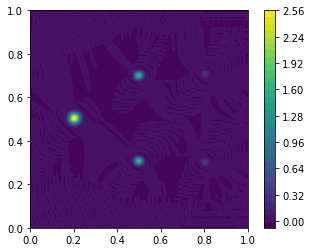

t = 1.11: error = 0.00318
2.5287717256810276
-0.03323950759510445


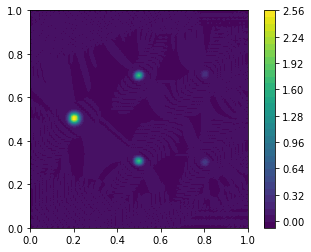

t = 1.11: error = 0.00317
2.5256018427727134
-0.033240088778694735


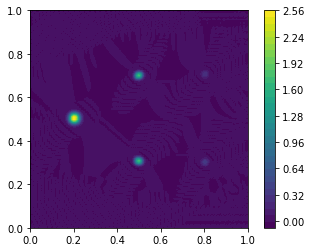

t = 1.11: error = 0.00316
2.5224421033385274
-0.03324066763191945


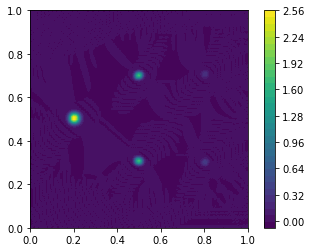

t = 1.11: error = 0.00315
2.5192924595165516
-0.03324124359541927


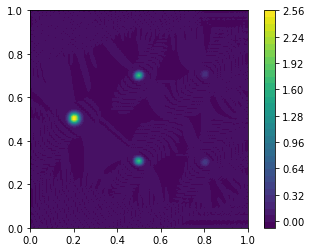

t = 1.12: error = 0.00314
2.5161528638931423
-0.03324181661011722


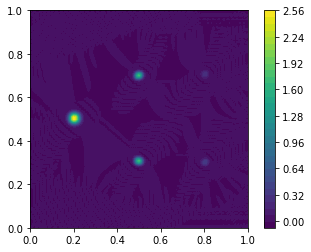

t = 1.12: error = 0.00313
2.5130232694865677
-0.03324238716621737


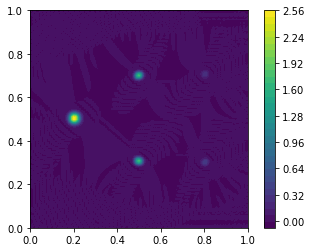

t = 1.12: error = 0.00312
2.509903629715715
-0.0332429560856612


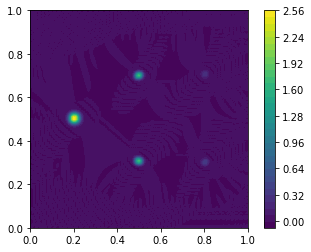

t = 1.12: error = 0.00311
2.5067938983536124
-0.03324352413333334


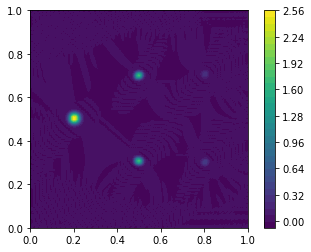

t = 1.12: error = 0.0031
2.5036940294686354
-0.033244091658611453


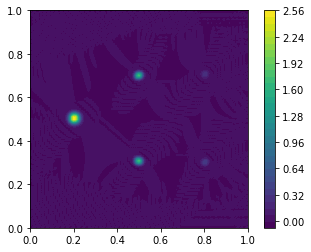

t = 1.13: error = 0.00309
2.5006039773590056
-0.033244658445303416


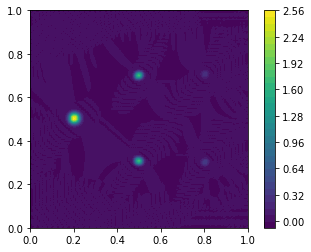

t = 1.13: error = 0.00308
2.4975236964879186
-0.03324522382289445


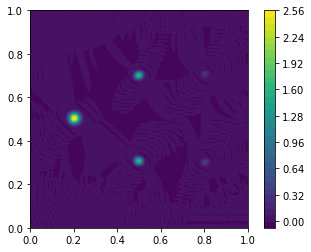

t = 1.13: error = 0.00307
2.494453141427019
-0.033245786971900296


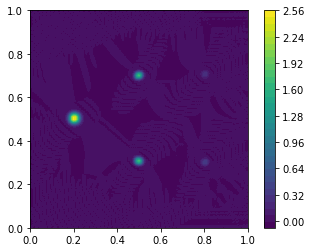

t = 1.13: error = 0.00306
2.491392266814918
-0.033246347295437635


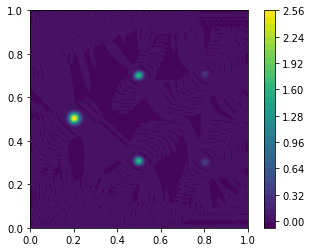

t = 1.13: error = 0.00305
2.488341027335577
-0.03324690470232443


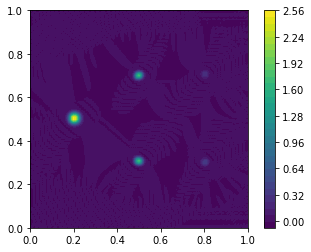

t = 1.14: error = 0.00304
2.485299377719016
-0.03324745966267959


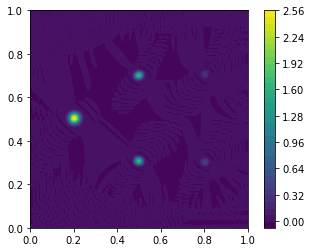

t = 1.14: error = 0.00303
2.4822672727645645
-0.03324801298808791


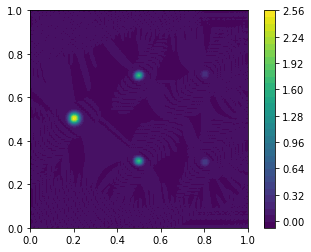

t = 1.14: error = 0.00302
2.479244667384918
-0.03324856543551502


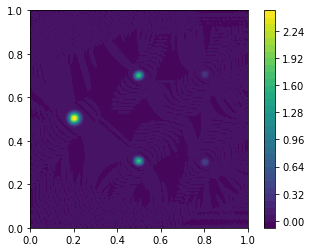

t = 1.14: error = 0.00301
2.4762315166677245
-0.03324911734312707


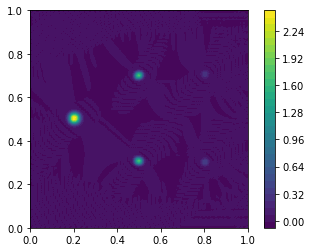

t = 1.14: error = 0.003
2.4732277759501913
-0.03324966847965726


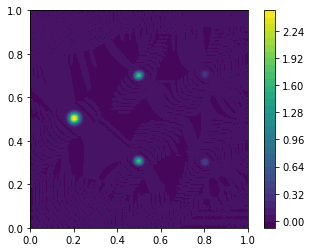

t = 1.15: error = 0.00299
2.4702334009011833
-0.03325021815811749


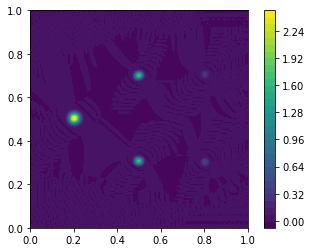

t = 1.15: error = 0.00299
2.467248347604481
-0.03325076554510093


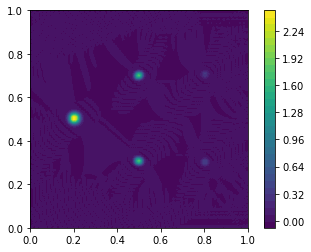

t = 1.15: error = 0.00298
2.4642725726363643
-0.03325131004035758


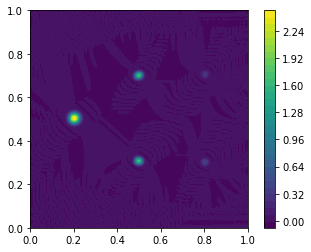

t = 1.15: error = 0.00297
2.461306033130661
-0.033251851572311614


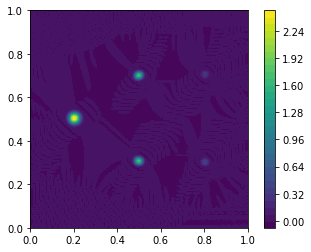

t = 1.15: error = 0.00296
2.4583486868249476
-0.033252390663727774


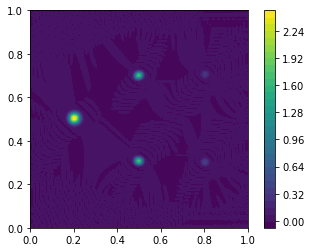

t = 1.16: error = 0.00295
2.455400492082821
-0.033252928209526036


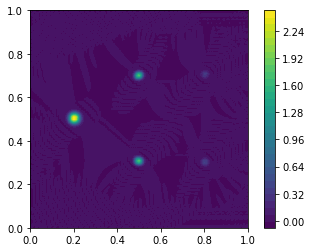

t = 1.16: error = 0.00294
2.4524614078889364
-0.033253465060919724


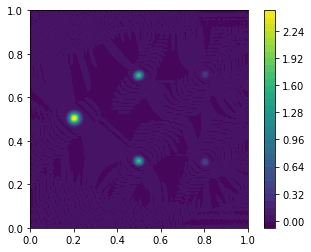

t = 1.16: error = 0.00293
2.449531393815773
-0.03325400162983066


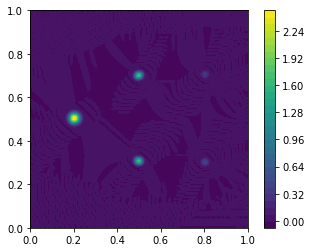

t = 1.16: error = 0.00292
2.4466104099634434
-0.03325453771017102


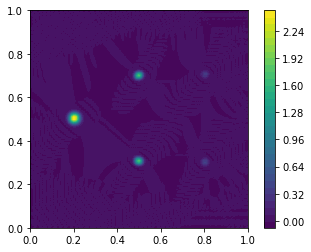

t = 1.16: error = 0.00291
2.443698416876258
-0.0332550725832928


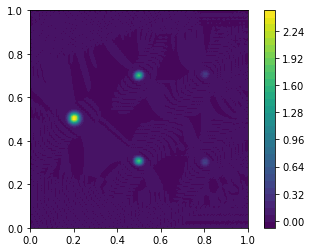

t = 1.17: error = 0.0029
2.4407953754417706
-0.03325560534395164


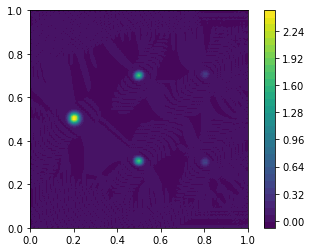

t = 1.17: error = 0.00289
2.437901246779661
-0.03325613531011666


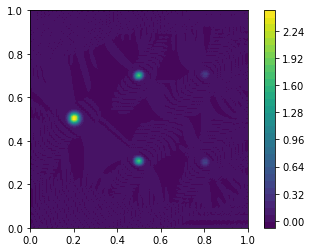

t = 1.17: error = 0.00289
2.435015992128749
-0.03325666234371834


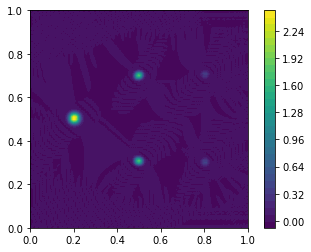

t = 1.17: error = 0.00288
2.432139572740702
-0.03325718692554687


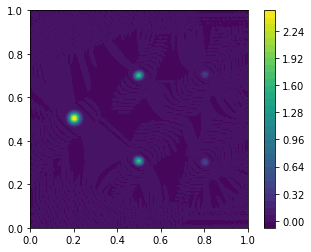

t = 1.17: error = 0.00287
2.429271949788482
-0.03325770992786147


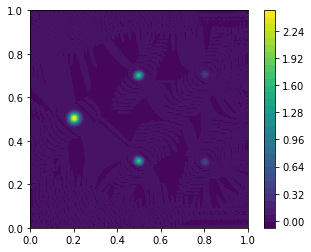

t = 1.18: error = 0.00286
2.4264130842963136
-0.03325823218805124


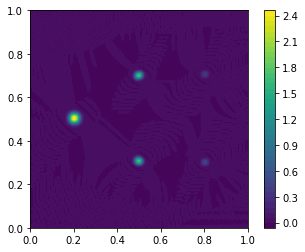

t = 1.18: error = 0.00285
2.4235629370960887
-0.03325875410636955


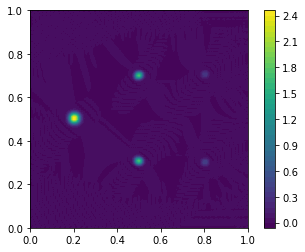

t = 1.18: error = 0.00284
2.4207214688128205
-0.03325927546994207


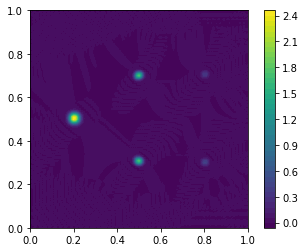

t = 1.18: error = 0.00283
2.4178886398792767
-0.03325979556385729


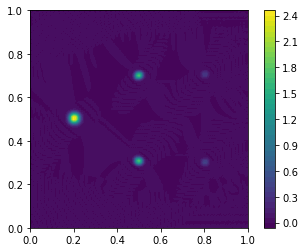

t = 1.18: error = 0.00282
2.4150644105775783
-0.033260313496766225


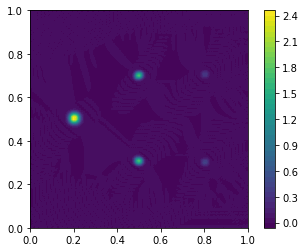

t = 1.19: error = 0.00282
2.412248741103525
-0.03326082860516906


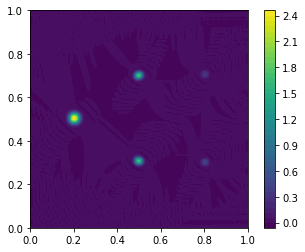

t = 1.19: error = 0.00281
2.409441591647967
-0.0332613407721934


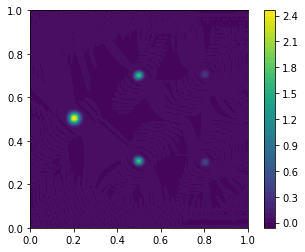

t = 1.19: error = 0.0028
2.40664292248867
-0.03326185050637178


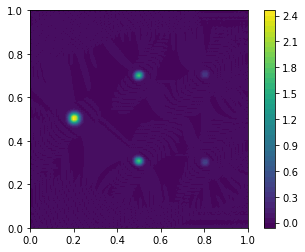

t = 1.19: error = 0.00279
2.403852694085952
-0.033262358716981584


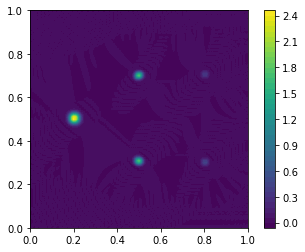

t = 1.19: error = 0.00278
2.401070867175639
-0.03326286628271189


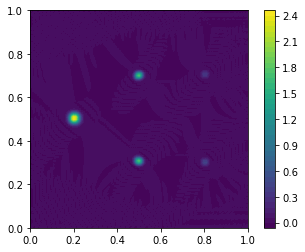

t = 1.20: error = 0.00277
2.3982974028536406
-0.033263373637385296


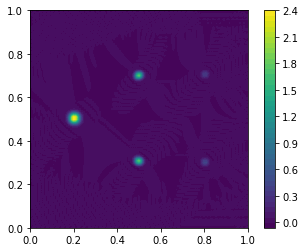

t = 1.20: error = 0.00277
2.395532262647403
-0.03326388057986011


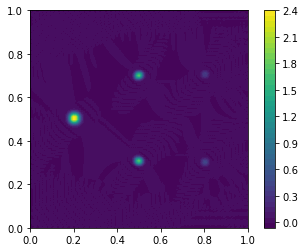

t = 1.20: error = 0.00276
2.3927754085706847
-0.033264386378880406


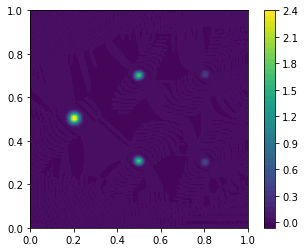

t = 1.20: error = 0.00275
2.3900268031593987
-0.03326489010723588


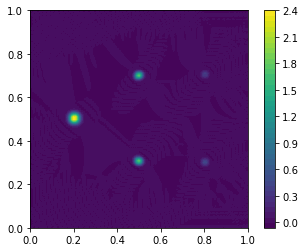

t = 1.20: error = 0.00274
2.387286409487782
-0.033265391065261316


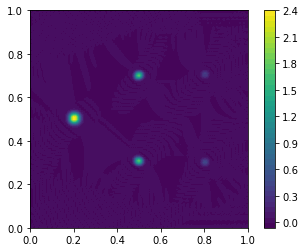

t = 1.21: error = 0.00273
2.384554191165718
-0.033265889116326865


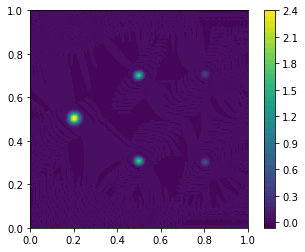

t = 1.21: error = 0.00272
2.381830112319716
-0.033266384769966705


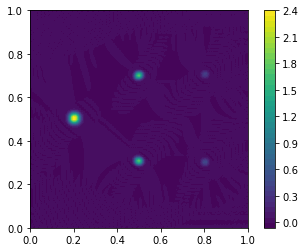

t = 1.21: error = 0.00272
2.379114137561394
-0.03326687894942731


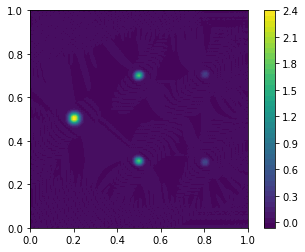

t = 1.21: error = 0.00271
2.376406231948186
-0.03326737254724542


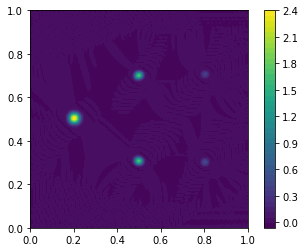

t = 1.21: error = 0.0027
2.3737063609410254
-0.03326786600100903


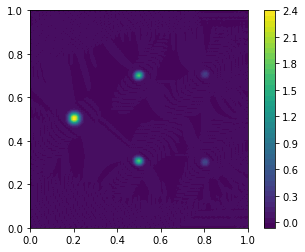

t = 1.22: error = 0.00269
2.371014490362954
-0.033268359098701475


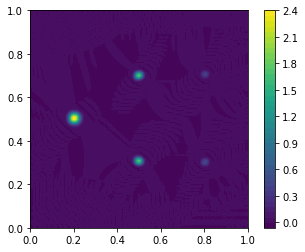

t = 1.22: error = 0.00268
2.3683305863610644
-0.033268851083875194


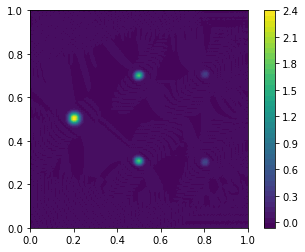

t = 1.22: error = 0.00268
2.3656546153724416
-0.033269340996078055


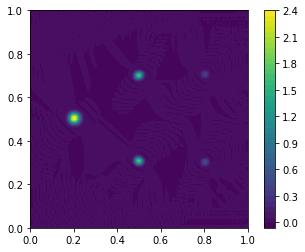

t = 1.22: error = 0.00267
2.3629865440932014
-0.03326982810805047


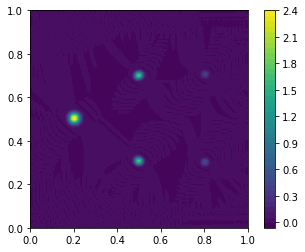

t = 1.22: error = 0.00266
2.3603263394488976
-0.03327031227731663


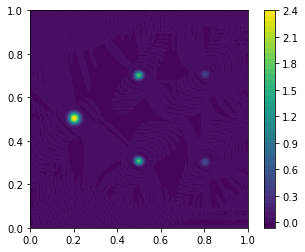

t = 1.23: error = 0.00265
2.357673968564559
-0.0332707940372872


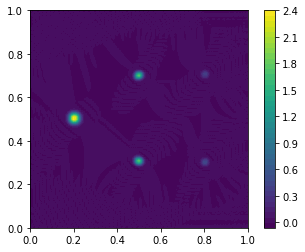

t = 1.23: error = 0.00264
2.3550293987334374
-0.033271274357279175


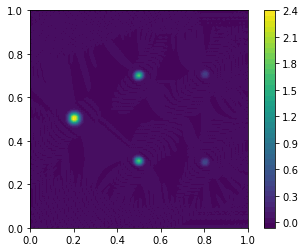

t = 1.23: error = 0.00264
2.352392597384734
-0.033271754177322754


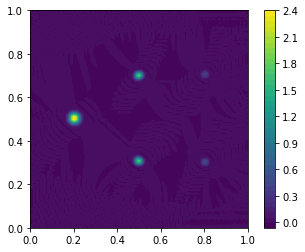

t = 1.23: error = 0.00263
2.3497635320517665
-0.033272233962016444


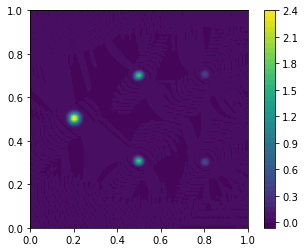

t = 1.23: error = 0.00262
2.3471421703427415
-0.03327271349908692


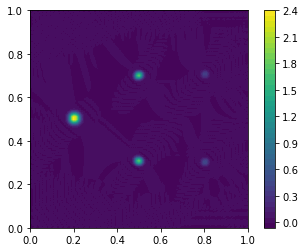

t = 1.24: error = 0.00261
2.3445284799163613
-0.033273192012503214


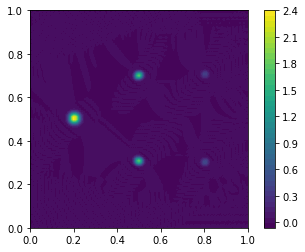

t = 1.24: error = 0.00261
2.341922428463868
-0.03327366851352927


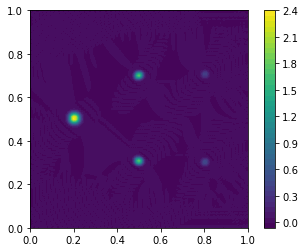

t = 1.24: error = 0.0026
2.339323983698086
-0.03327414224475868


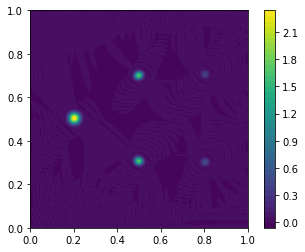

t = 1.24: error = 0.00259
2.3367331133489055
-0.033274613038426486


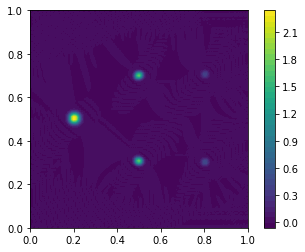

t = 1.24: error = 0.00258
2.3341497851638446
-0.033275081416598094


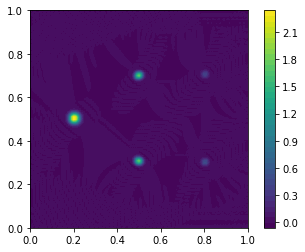

t = 1.25: error = 0.00258
2.331573966912049
-0.03327554835767263


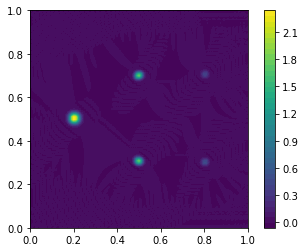

t = 1.25: error = 0.00257
2.3290056263904257
-0.03327601482913378


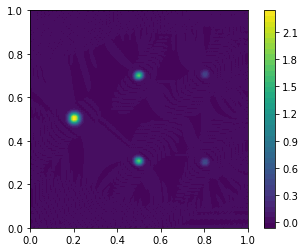

t = 1.25: error = 0.00256
2.3264447314313794
-0.033276481329165615


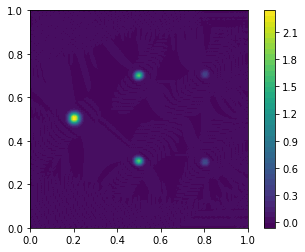

t = 1.25: error = 0.00255
2.3238912499124633
-0.03327694766549073


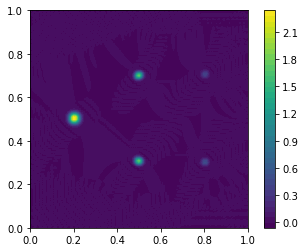

t = 1.25: error = 0.00255
2.3213451497688804
-0.03327741305432508


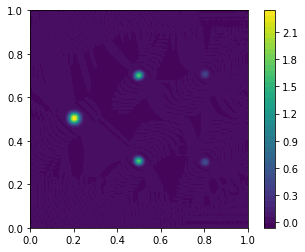

t = 1.26: error = 0.00254
2.318806399009787
-0.033277876475537975


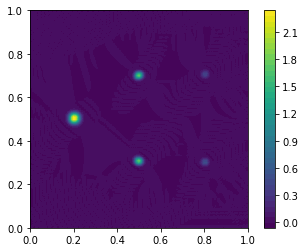

t = 1.26: error = 0.00253
2.316274965738826
-0.033278337137789625


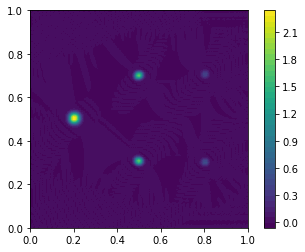

t = 1.26: error = 0.00252
2.3137508181783195
-0.03327879485928817


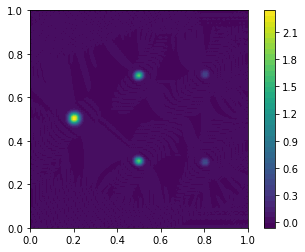

t = 1.26: error = 0.00252
2.3112339246954883
-0.03327925017617284


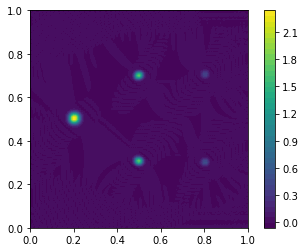

t = 1.26: error = 0.00251
2.3087242538283603
-0.033279704099131766


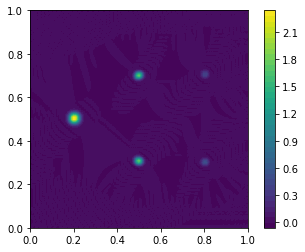

t = 1.27: error = 0.0025
2.3062217743088844
-0.03328015762434984


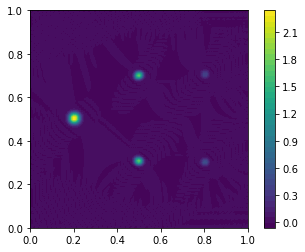

t = 1.27: error = 0.0025
2.303726455081402
-0.033280611254530315


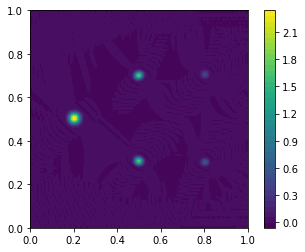

t = 1.27: error = 0.00249
2.301238265315798
-0.033281064772028905


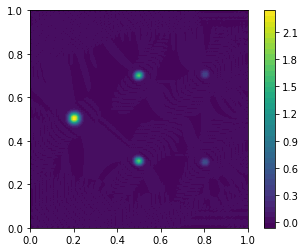

t = 1.27: error = 0.00248
2.2987571744159907
-0.03328151735019132


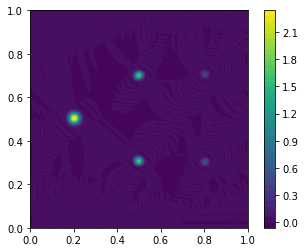

t = 1.27: error = 0.00247
2.2962831520255533
-0.03328196793032027


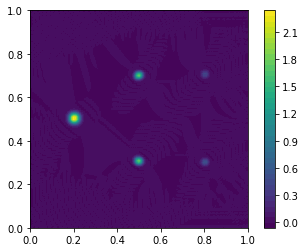

t = 1.28: error = 0.00247
2.293816168032773
-0.03328241570609712


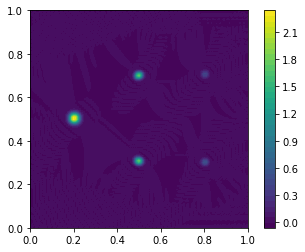

t = 1.28: error = 0.00246
2.2913561925771906
-0.03328286051387437


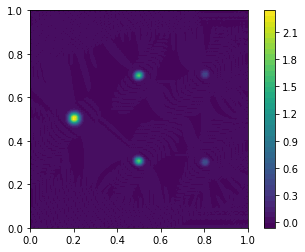

t = 1.28: error = 0.00245
2.288903196058722
-0.033283302938837245


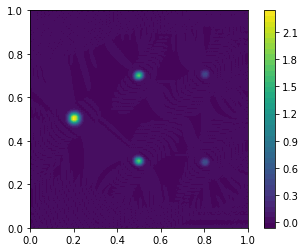

t = 1.28: error = 0.00245
2.2864571491491987
-0.03328374405822121


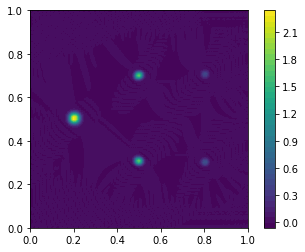

t = 1.28: error = 0.00244
2.284018022804974
-0.03328418493297935


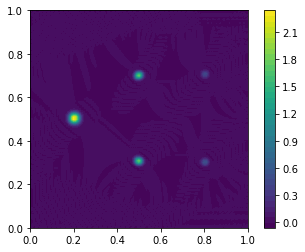

t = 1.29: error = 0.00243
2.281585788278614
-0.03328462611062769


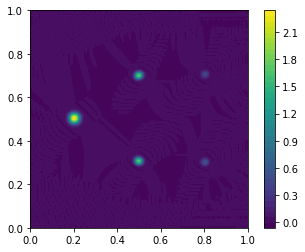

t = 1.29: error = 0.00243
2.2791604171277817
-0.033285067385335994


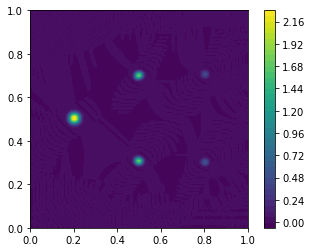

t = 1.29: error = 0.00242
2.276741915537154
-0.03328550790185569


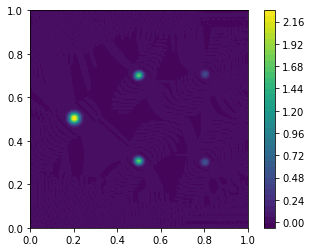

t = 1.29: error = 0.00241
2.274330348663089
-0.033285946534433695


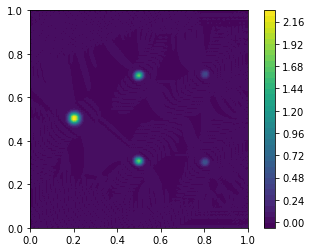

t = 1.29: error = 0.0024
2.271925792180734
-0.033286382388083575


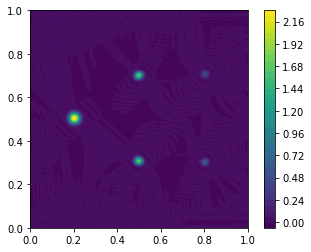

t = 1.30: error = 0.0024
2.2695282922689928
-0.03328681521756402


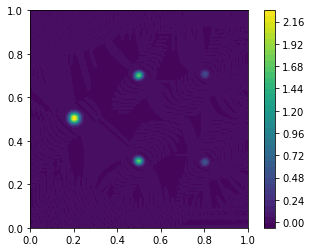

t = 1.30: error = 0.00239
2.2671378642649658
-0.03328724555987411


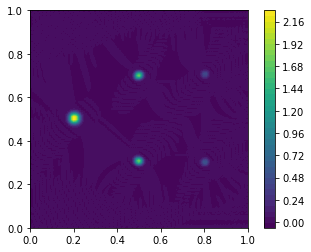

t = 1.30: error = 0.00238
2.2647545032212966
-0.03328767448727881


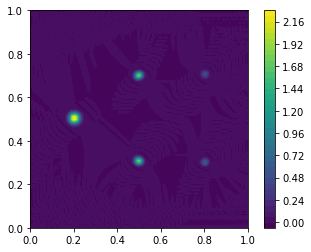

t = 1.30: error = 0.00238
2.2623781925132334
-0.03328810308847183


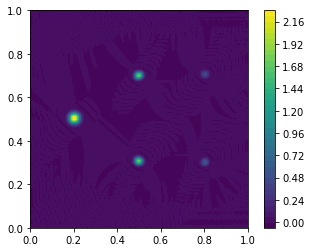

t = 1.30: error = 0.00237
2.260008909119682
-0.03328853195009305


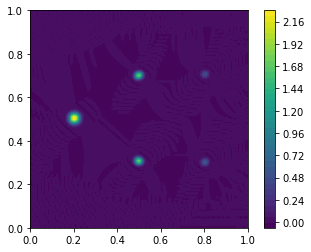

t = 1.31: error = 0.00236
2.2576466266106165
-0.03328896089845132


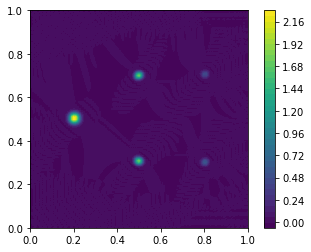

t = 1.31: error = 0.00236
2.255291316076571
-0.03328938909659266


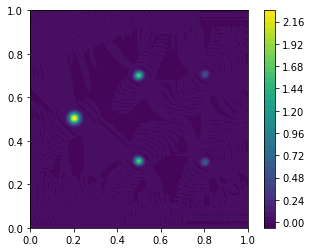

t = 1.31: error = 0.00235
2.2529429278799324
-0.03328981542706453


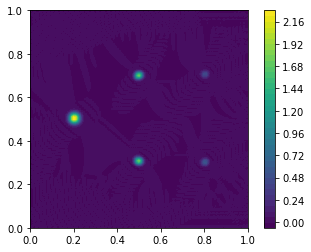

t = 1.31: error = 0.00234
2.2506015335557286
-0.03329023900224213


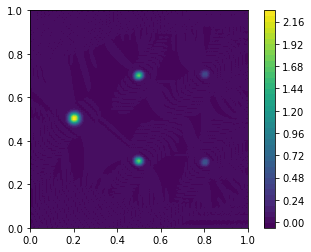

t = 1.31: error = 0.00233
2.2482671903361355
-0.03329065959200061


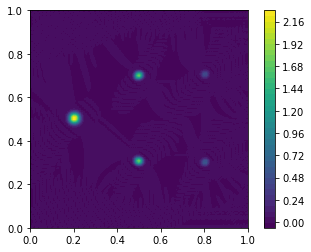

t = 1.32: error = 0.00233
2.2459399273740632
-0.03329107775994727


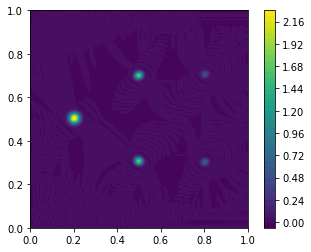

t = 1.32: error = 0.00232
2.2436197523260333
-0.03329149461250692


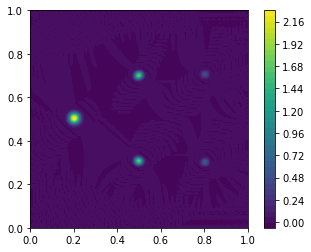

t = 1.32: error = 0.00231
2.24130665906834
-0.03329191127076631


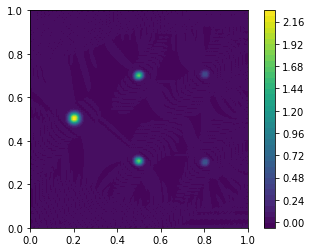

t = 1.32: error = 0.00231
2.2390006330101593
-0.033292328341324715


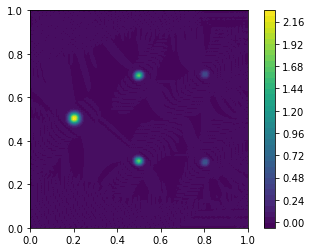

t = 1.32: error = 0.0023
2.2367016543424785
-0.03329274564594458


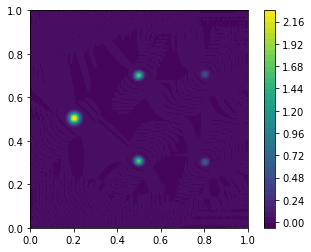

t = 1.33: error = 0.00229
2.2344096999799583
-0.03329316231089373


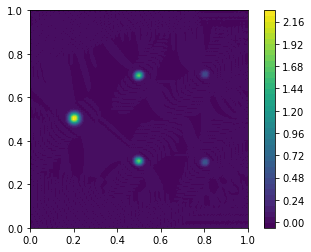

t = 1.33: error = 0.00228
2.2321247447371975
-0.03329357715610065


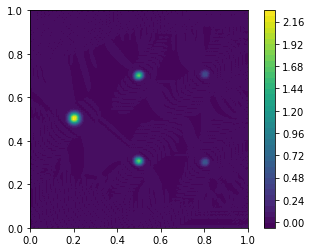

t = 1.33: error = 0.00228
2.229846762062561
-0.03329398922809472


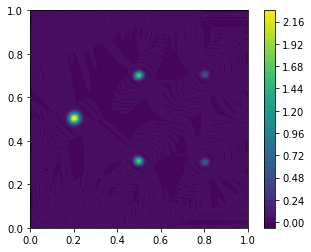

t = 1.33: error = 0.00227
2.227575724512754
-0.033294398254572574


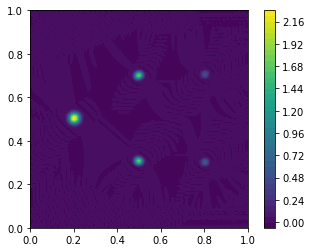

t = 1.33: error = 0.00226
2.2253116040706886
-0.03329480479596064


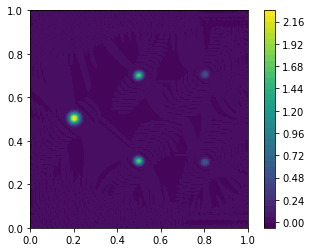

t = 1.34: error = 0.00226
2.2230543723641385
-0.03329520999052888


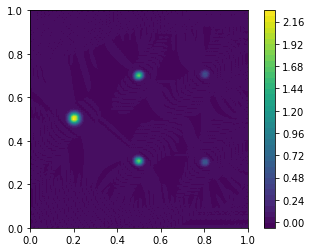

t = 1.34: error = 0.00225
2.220804000817957
-0.03329561500645556


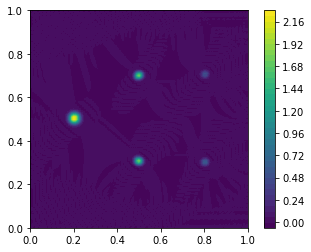

t = 1.34: error = 0.00224
2.2185604607593197
-0.033296020489221076


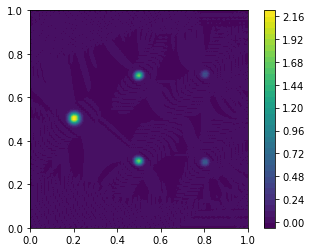

t = 1.34: error = 0.00224
2.2163237234885558
-0.03329642627982463


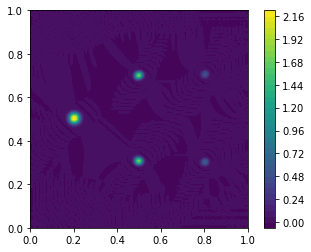

t = 1.34: error = 0.00223
2.2140937603245314
-0.03329683150487328


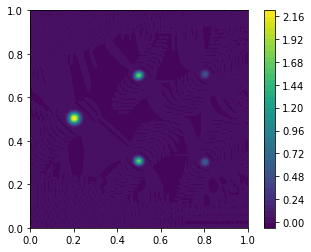

t = 1.35: error = 0.00222
2.211870542631547
-0.03329723496983696


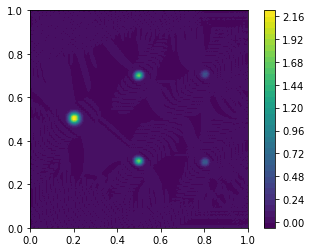

t = 1.35: error = 0.00222
2.209654041833317
-0.03329763569679386


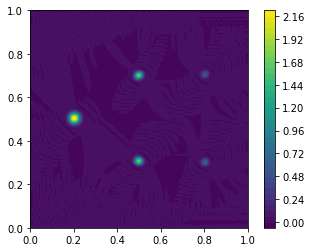

t = 1.35: error = 0.00221
2.207444229418495
-0.03329803338906583


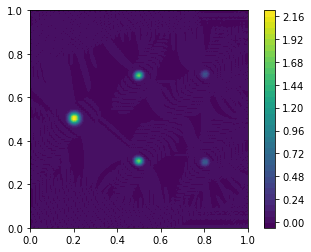

t = 1.35: error = 0.00221
2.205241076941288
-0.03329842859690046


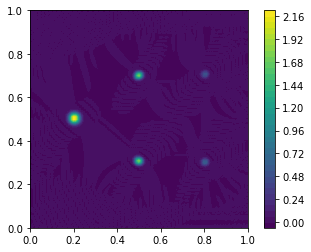

t = 1.35: error = 0.00222
2.2030445560200533
-0.03329882247074533


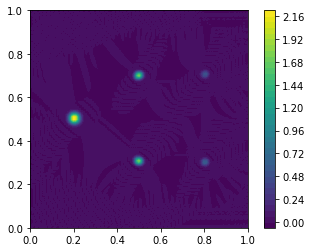

t = 1.36: error = 0.00222
2.2008546383364043
-0.033299216206571794


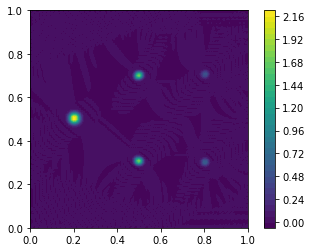

t = 1.36: error = 0.00223
2.198671295637097
-0.0332996104747107


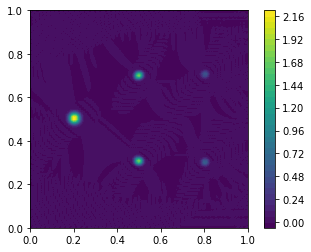

t = 1.36: error = 0.00223
2.1964944997407385
-0.03330000512071215


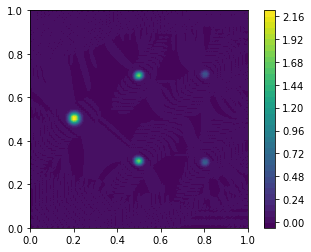

t = 1.36: error = 0.00223
2.194324222550886
-0.03330039925087592


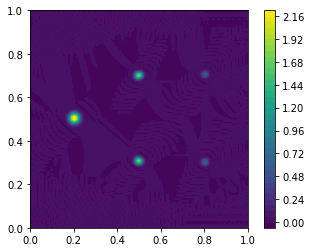

t = 1.36: error = 0.00224
2.192160436076373
-0.03330079163554963


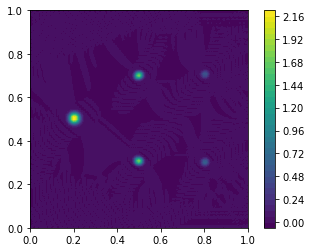

t = 1.37: error = 0.00224
2.1900031124586525
-0.03330118126551589


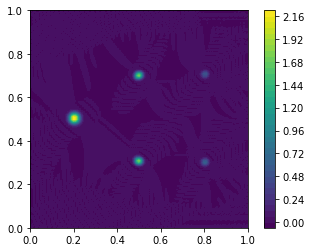

t = 1.37: error = 0.00225
2.187852224004803
-0.03330156783459114


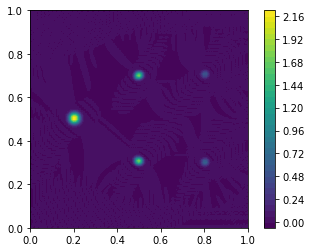

t = 1.37: error = 0.00225
2.1857077432236927
-0.033301951913747484


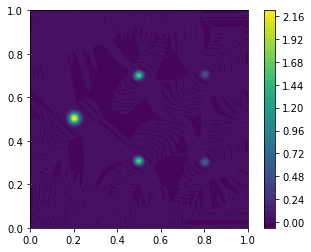

t = 1.37: error = 0.00225
2.183569642861917
-0.03330233469868318


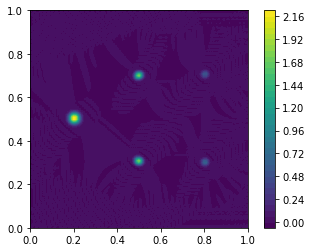

t = 1.37: error = 0.00226
2.1814378959355647
-0.03330271743747542


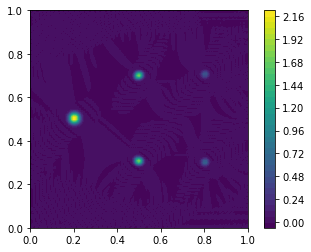

t = 1.38: error = 0.00226
2.1793124757538673
-0.03330310083879524


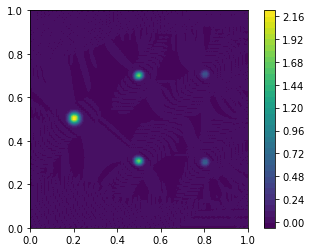

t = 1.38: error = 0.00227
2.1771933559312853
-0.03330348475651565


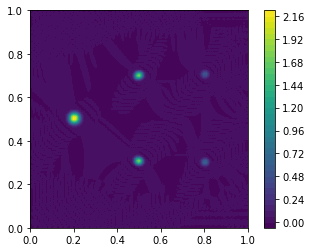

t = 1.38: error = 0.00227
2.175080510385706
-0.033303868268918006


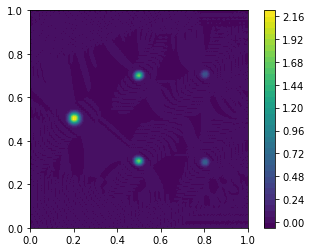

t = 1.38: error = 0.00228
2.1729739133220907
-0.03330425009013823


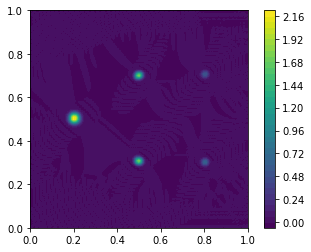

t = 1.38: error = 0.00228
2.1708735392028413
-0.033304629148619036


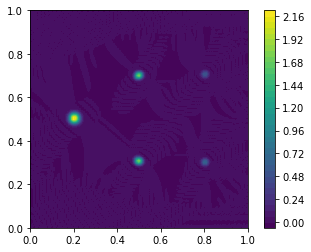

t = 1.39: error = 0.00228
2.1687793627081535
-0.033305005095293785


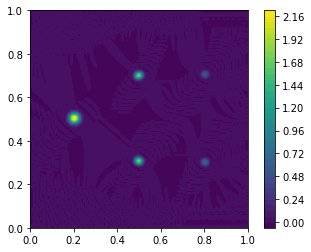

t = 1.39: error = 0.00229
2.1666913586911996
-0.03330537849233189


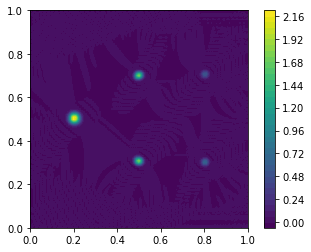

t = 1.39: error = 0.00229
2.164609502133748
-0.03330575055710205


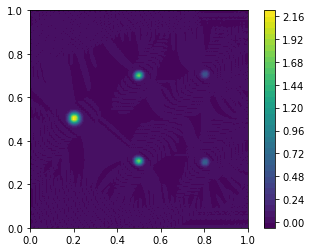

t = 1.39: error = 0.0023
2.162533768107679
-0.03330612257278129


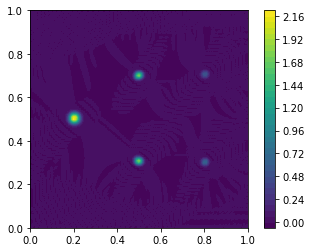

t = 1.39: error = 0.0023
2.160464131746651
-0.03330649527733456


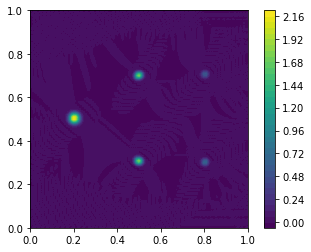

t = 1.40: error = 0.0023
2.1584005682303142
-0.033306868539012394


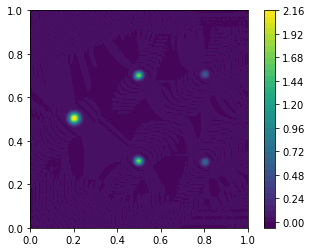

t = 1.40: error = 0.00231
2.156343052781362
-0.03330724143727995


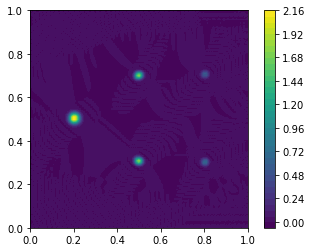

t = 1.40: error = 0.00231
2.1542915606736677
-0.033307612680235604


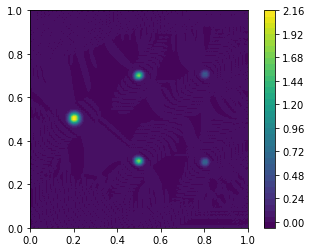

t = 1.40: error = 0.00231
2.152246067248369
-0.03330798118878161


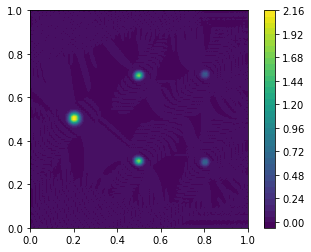

t = 1.40: error = 0.00232
2.150206547933916
-0.033308346611034004


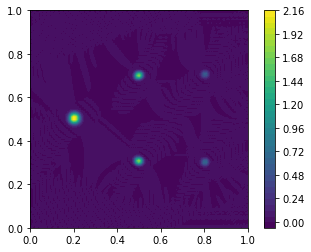

t = 1.41: error = 0.00232
2.1481729782659866
-0.033308709517554644


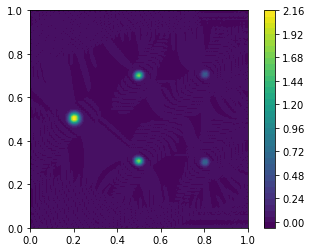

t = 1.41: error = 0.00233
2.146145333903584
-0.0333090711465478


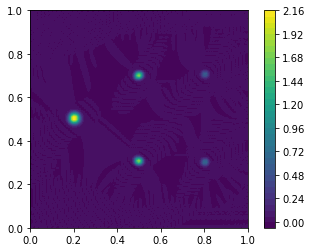

t = 1.41: error = 0.00233
2.1441235906384906
-0.03330943280664056


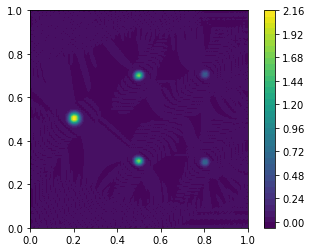

t = 1.41: error = 0.00233
2.1421077243964834
-0.03330979525208424


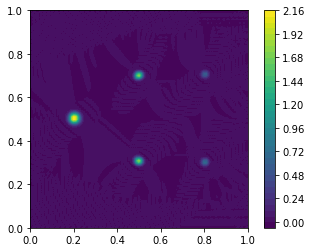

t = 1.41: error = 0.00234
2.140097711230208
-0.03331015834304282


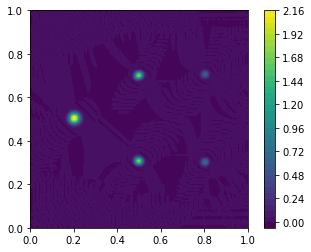

t = 1.42: error = 0.00234
2.138093527305204
-0.033310521118902085


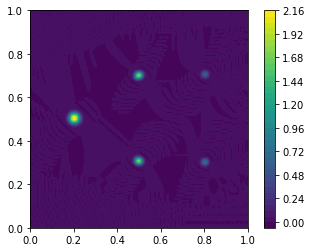

t = 1.42: error = 0.00234
2.1360951488819655
-0.033310882224995515


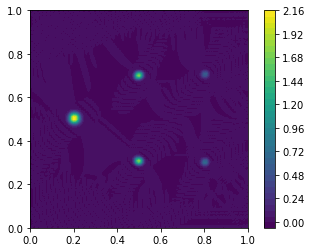

t = 1.42: error = 0.00235
2.1341025522977475
-0.033311240524197636


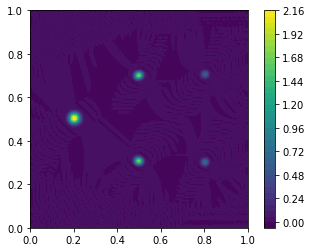

t = 1.42: error = 0.00235
2.132115713951749
-0.03331159564350435


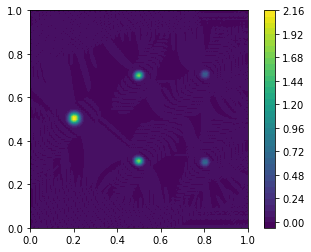

t = 1.42: error = 0.00235
2.1301346102962384
-0.03331194818728993


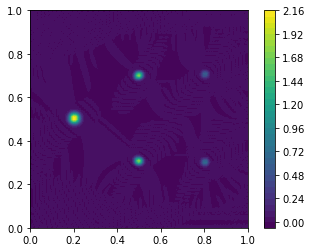

t = 1.43: error = 0.00236
2.1281592178343427
-0.033312299475168686


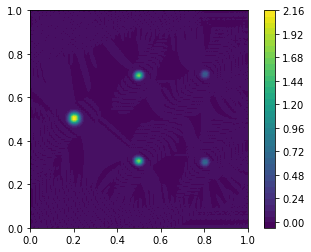

t = 1.43: error = 0.00236
2.1261895131232045
-0.033312650913907685


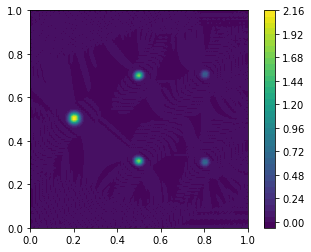

t = 1.43: error = 0.00237
2.124225472779659
-0.033313003332984155


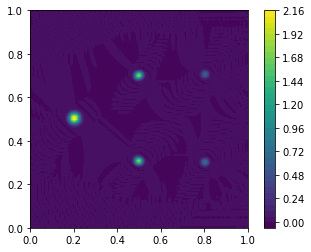

t = 1.43: error = 0.00237
2.1222670734850357
-0.03331335661647097


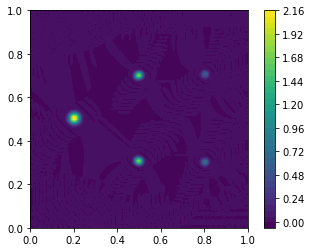

t = 1.43: error = 0.00237
2.1203142919864533
-0.033313709770765636


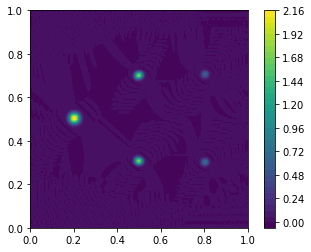

t = 1.44: error = 0.00238
2.1183671050936614
-0.03331406136700777


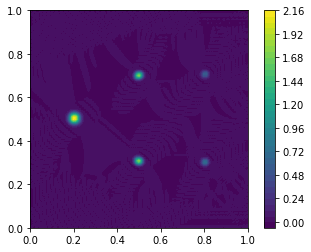

t = 1.44: error = 0.00238
2.1164254896726686
-0.033314410181464964


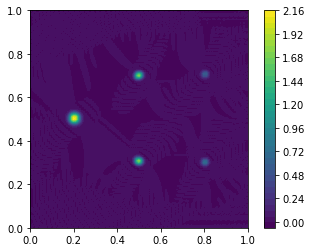

t = 1.44: error = 0.00238
2.1144894226392283
-0.03331475577365181


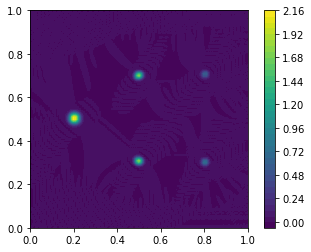

t = 1.44: error = 0.00239
2.1125588809562514
-0.0333150987219478


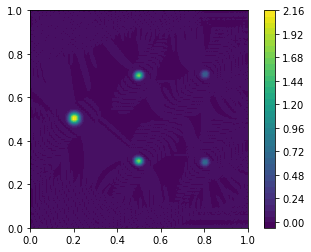

t = 1.44: error = 0.00239
2.1106338416389763
-0.03331544036475368


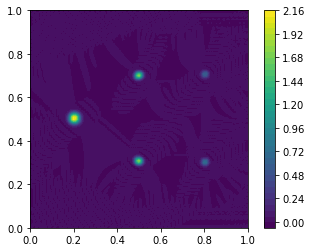

t = 1.45: error = 0.00239
2.1087142817704176
-0.03331578215658976


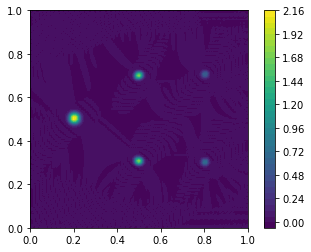

t = 1.45: error = 0.00239
2.1068001785275894
-0.03331612497755


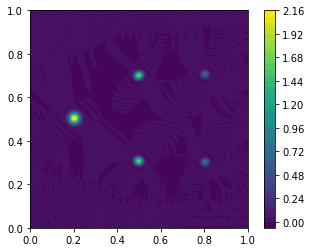

t = 1.45: error = 0.0024
2.1048915092167784
-0.03331646874066435


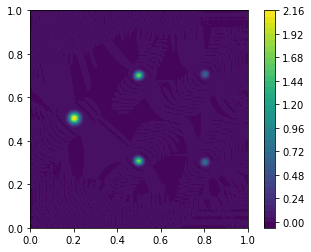

t = 1.45: error = 0.0024
2.102988251314278
-0.03331681244516567


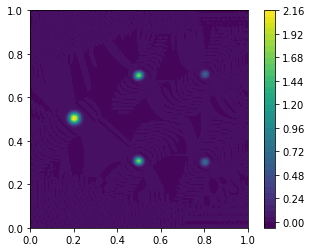

t = 1.45: error = 0.0024
2.1010903825078833
-0.03331715461929813


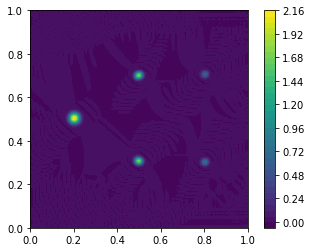

t = 1.46: error = 0.00241
2.099197880734207
-0.03331749397670327


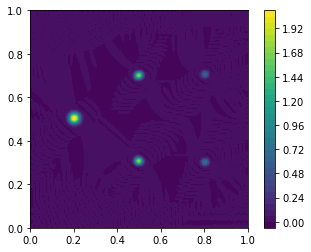

t = 1.46: error = 0.00241
2.0973107242074964
-0.033317830020569005


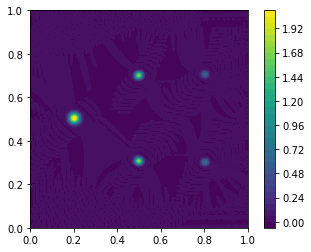

t = 1.46: error = 0.00241
2.095428891436901
-0.033318163303630625


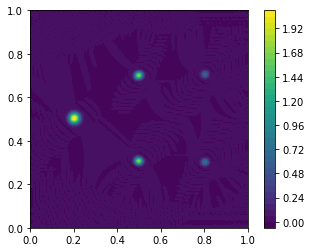

t = 1.46: error = 0.00242
2.0935523612307376
-0.03331849518015405


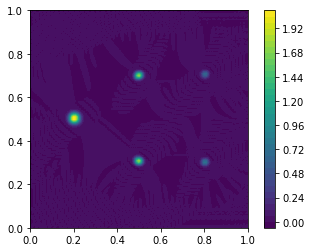

t = 1.46: error = 0.00242
2.091681112687963
-0.033318827154948376


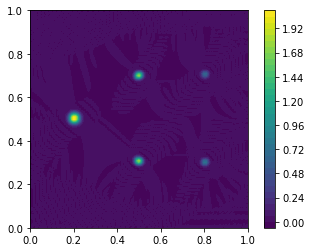

t = 1.47: error = 0.00242
2.0898151251784185
-0.0333191601740888


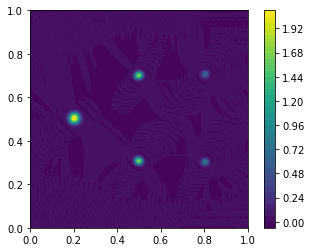

t = 1.47: error = 0.00242
2.0879543783143837
-0.03331949420850857


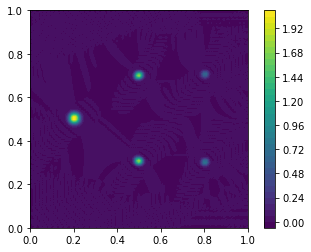

t = 1.47: error = 0.00243
2.086098851916301
-0.0333198282862899


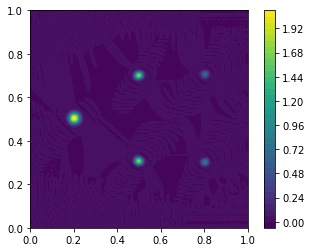

t = 1.47: error = 0.00243
2.084248525975411
-0.03332016092741759


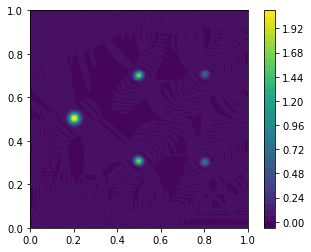

t = 1.47: error = 0.00243
2.0824033806155278
-0.033320490811815276


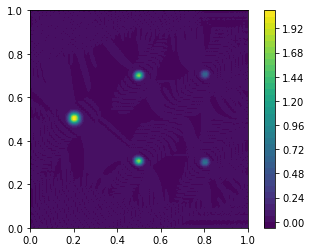

t = 1.48: error = 0.00244
2.0805633960555308
-0.033320817408163124


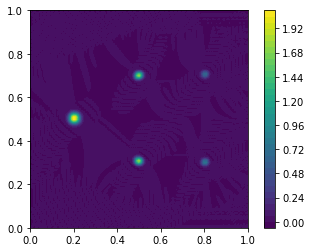

t = 1.48: error = 0.00244
2.0787285525736916
-0.03332114125412523


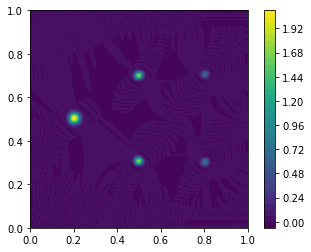

t = 1.48: error = 0.00244
2.0768988304747187
-0.033321463711707605


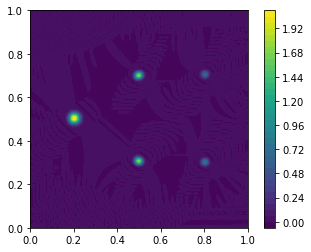

t = 1.48: error = 0.00244
2.075074210060537
-0.03332178630485539


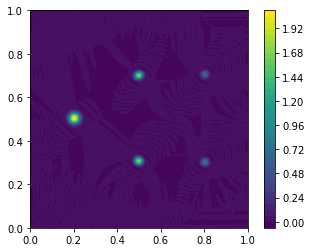

t = 1.48: error = 0.00245
2.0732546716061284
-0.03332210999571766


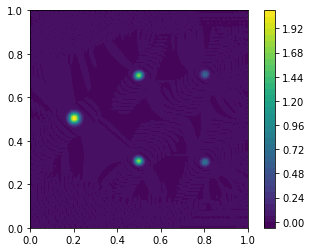

t = 1.49: error = 0.00245
2.0714401953420345
-0.033322434762062085


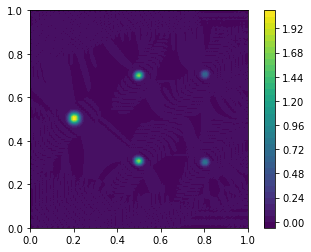

t = 1.49: error = 0.00245
2.0696307614451284
-0.03332275963099393


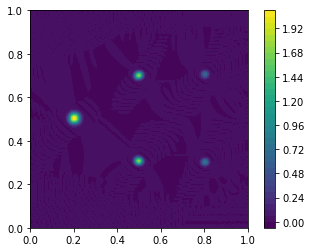

t = 1.49: error = 0.00245
2.0678263500388776
-0.033323083116571985


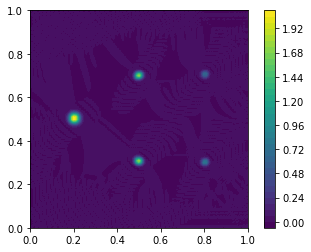

t = 1.49: error = 0.00246
2.0660269412034453
-0.033323403890982754


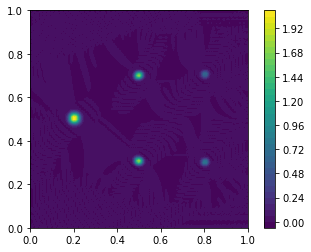

t = 1.49: error = 0.00246
2.0642325149948304
-0.03332372141987608


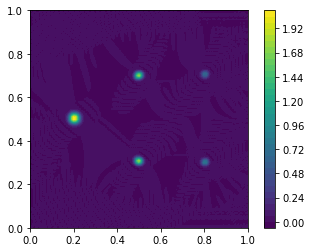

t = 1.50: error = 0.00246
2.0624430514709715
-0.0333240362516932


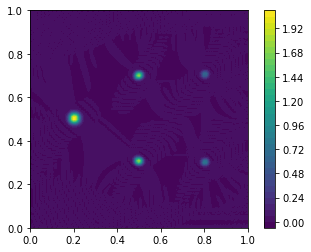

t = 1.50: error = 0.00246
2.06065853072164
-0.033324349775738595


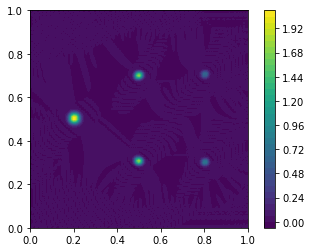

t = 1.50: error = 0.00247
2.058878932898289
-0.03332466354788242


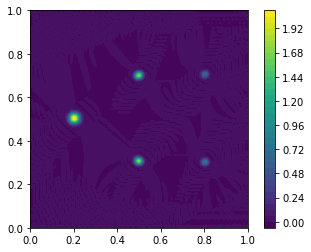

t = 1.50: error = 0.00247
2.0571042382398645
-0.03332497854457652


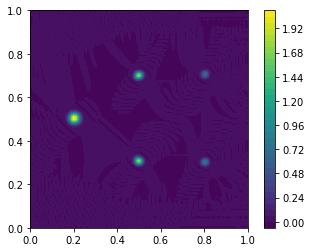

t = 1.50: error = 0.00247
2.0553344270911134
-0.033325294720111844


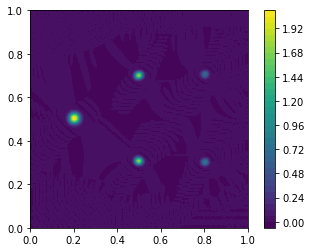

t = 1.51: error = 0.00247
2.053569479911006
-0.03332561103622682


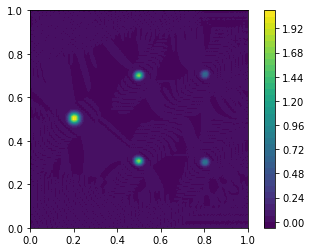

t = 1.51: error = 0.00248
2.0518093772704455
-0.033325925918072534


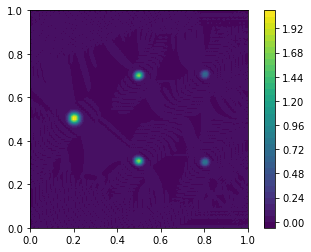

t = 1.51: error = 0.00248
2.0500540998402697
-0.033326237959449764


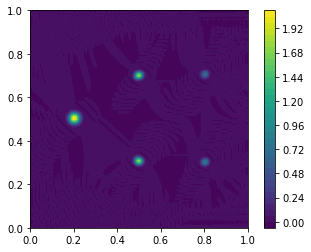

t = 1.51: error = 0.00248
2.0483036283723695
-0.03332654659035498


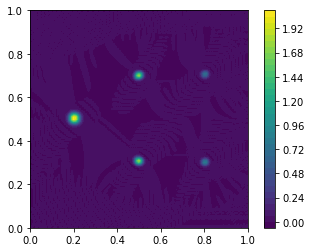

t = 1.51: error = 0.00248
2.0465579436781938
-0.033326852379362


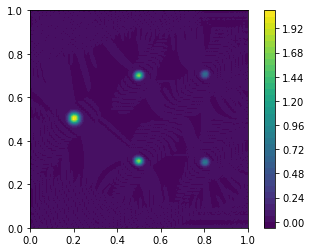

t = 1.52: error = 0.00248
2.0448170266096803
-0.03332715678072209


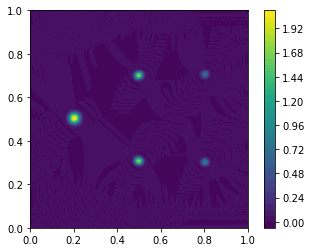

t = 1.52: error = 0.00249
2.0430808580474342
-0.03332746143419984


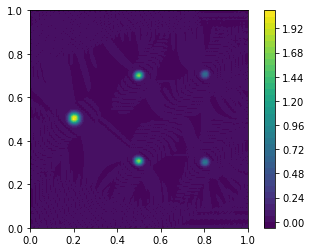

t = 1.52: error = 0.00249
2.0413494188998422
-0.03332776739213139


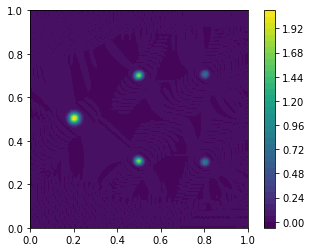

t = 1.52: error = 0.00249
2.039622690114726
-0.03332807466275505


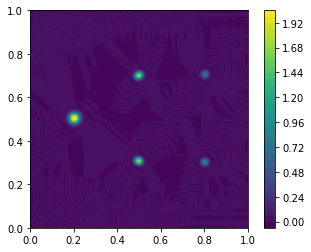

t = 1.52: error = 0.00249
2.037900652702762
-0.033328382236768546


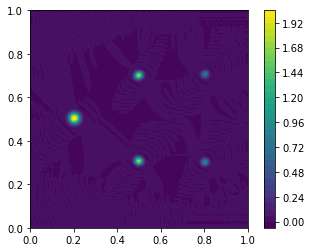

t = 1.53: error = 0.00249
2.0361832877694974
-0.03332868854148257


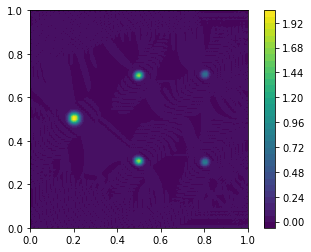

t = 1.53: error = 0.0025
2.03447057655106
-0.03332899214466125


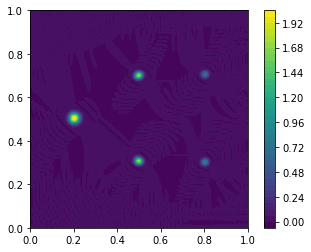

t = 1.53: error = 0.0025
2.032762500447879
-0.03332929242935489


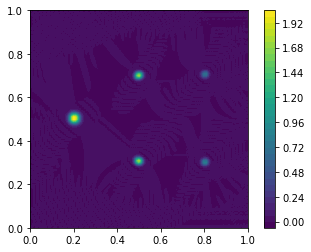

t = 1.53: error = 0.0025
2.031059041050986
-0.03332958991473725


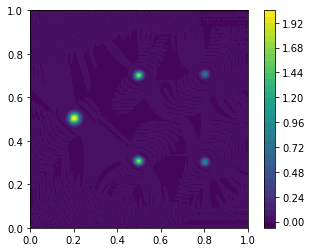

t = 1.53: error = 0.0025
2.029360180156736
-0.033329886022727045


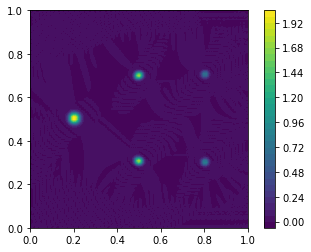

t = 1.54: error = 0.0025
2.027665899767693
-0.03333018238733743


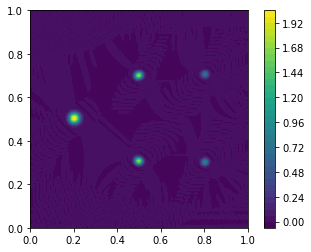

t = 1.54: error = 0.0025
2.0259761820796824
-0.03333048007542771


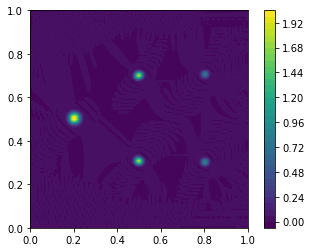

t = 1.54: error = 0.00251
2.0242910094571704
-0.033330779110882836


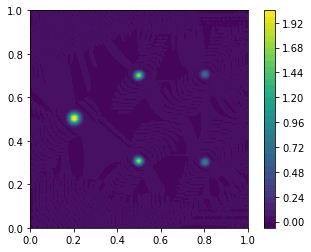

t = 1.54: error = 0.00251
2.022610364400983
-0.03333107848127356


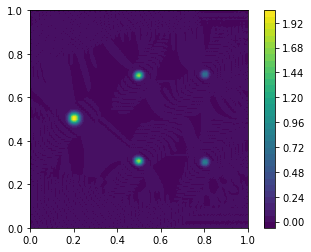

t = 1.54: error = 0.00251
2.0209342295136232
-0.033331376585761394


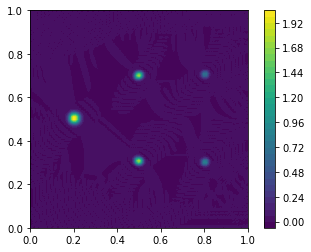

t = 1.55: error = 0.00251
2.019262632227172
-0.033331671951588336


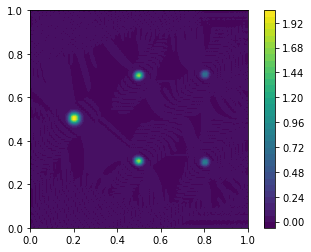

t = 1.55: error = 0.00251
2.0175956343863355
-0.03333196393165499


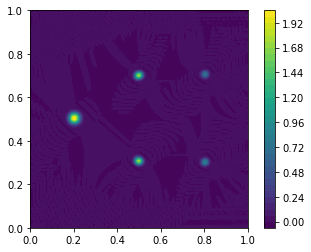

t = 1.55: error = 0.00251
2.0159332890661177
-0.03333225304185949


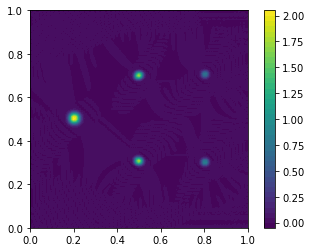

t = 1.55: error = 0.00251
2.014275624693488
-0.033332540726376245


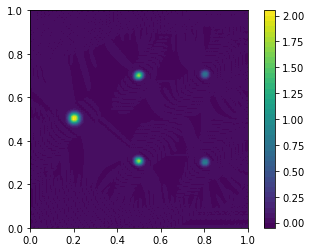

t = 1.55: error = 0.00252
2.0126226497308943
-0.03333282864465342


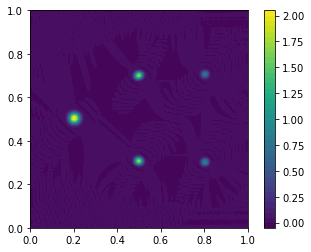

t = 1.56: error = 0.00252
2.010974360248103
-0.0333331178644647


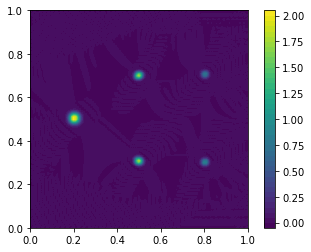

t = 1.56: error = 0.00252
2.0093307452731453
-0.033333408377682824


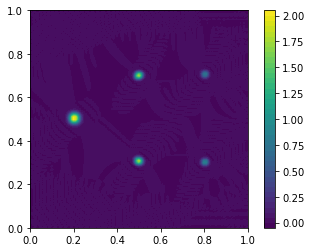

t = 1.56: error = 0.00252
2.0076917899884887
-0.03333369912818203


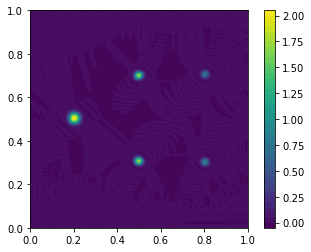

t = 1.56: error = 0.00252
2.006057477555713
-0.03333398849566326


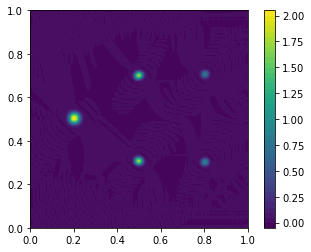

t = 1.56: error = 0.00252
2.0044277901510346
-0.03333427503805234


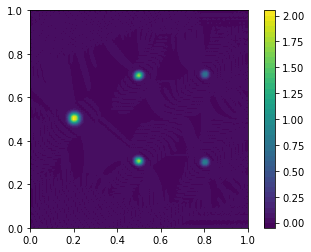

t = 1.57: error = 0.00252
2.002802709555208
-0.03333455819103983


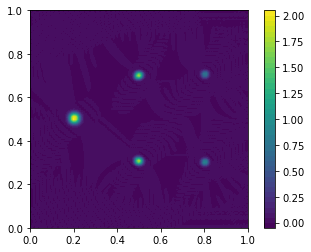

t = 1.57: error = 0.00253
2.0011822174886795
-0.03333483858511924


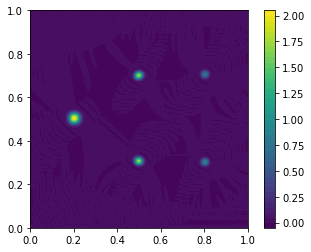

t = 1.57: error = 0.00253
1.999566295797275
-0.0333351177792134


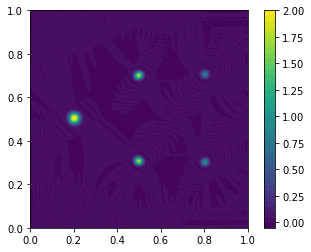

t = 1.57: error = 0.00253
1.9979549265471381
-0.03333539751763613


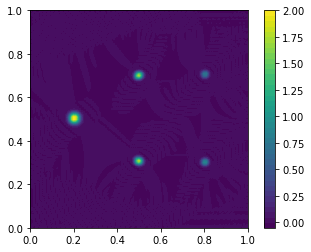

t = 1.57: error = 0.00253
1.996348092062434
-0.033335678902574016


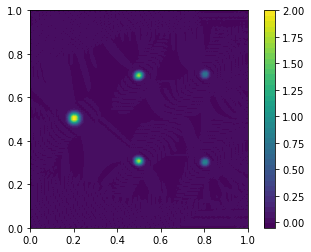

t = 1.58: error = 0.00253
1.9947458023576419
-0.0333359618930085


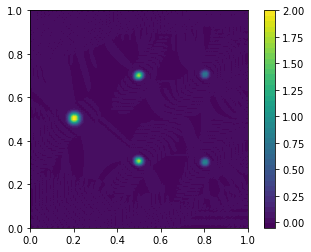

t = 1.58: error = 0.00253
1.9931486688393307
-0.033336245328633544


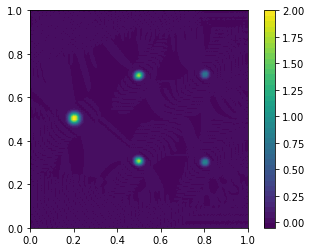

t = 1.58: error = 0.00253
1.9915566723369478
-0.03333652744072236


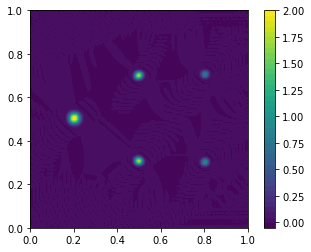

t = 1.58: error = 0.00253
1.9899697365282372
-0.0333368066526937


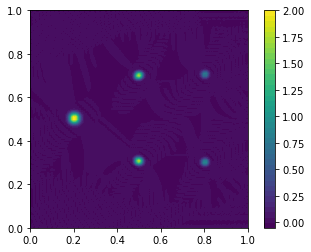

t = 1.58: error = 0.00253
1.9883877855773529
-0.03333708233868729


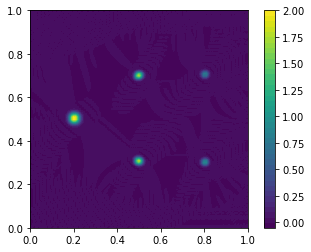

t = 1.59: error = 0.00253
1.9868107545173064
-0.03333735516605609


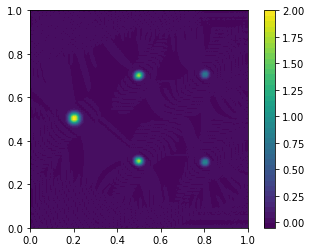

t = 1.59: error = 0.00253
1.9852385885819699
-0.03333762680606974


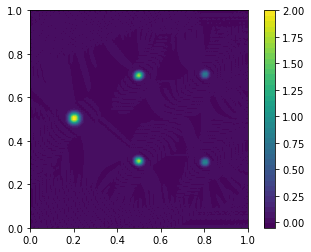

t = 1.59: error = 0.00254
1.983671240850772
-0.03333789913106695


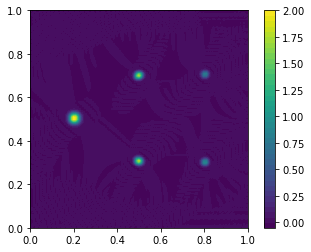

t = 1.59: error = 0.00254
1.9821086702004682
-0.033338173320565184


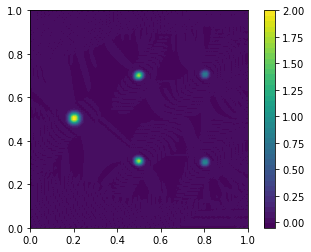

t = 1.59: error = 0.00254
1.9805508398021205
-0.03333844932612303


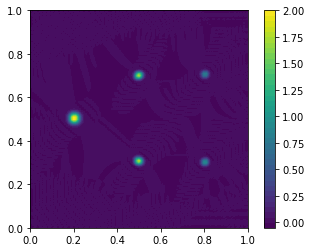

t = 1.60: error = 0.00254
1.9789977160593806
-0.03333872590196467


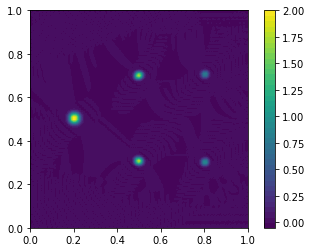

t = 1.60: error = 0.00254
1.9774492678598508
-0.033339001145781616


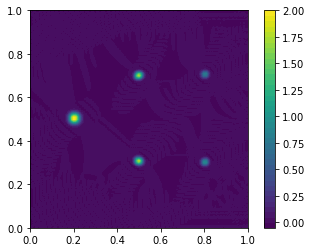

t = 1.60: error = 0.00254
1.9759054660422475
-0.03333927333446565


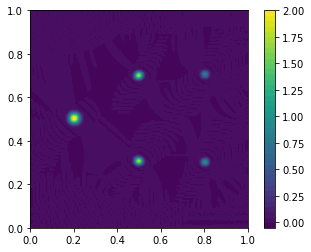

t = 1.60: error = 0.00254
1.9743662830125952
-0.03333954171760694


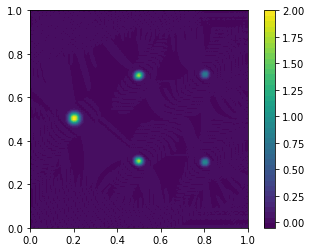

t = 1.60: error = 0.00254
1.9728316924645182
-0.0333398068886395


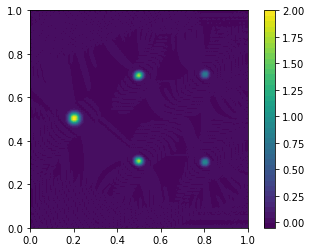

t = 1.61: error = 0.00254
1.9713016691732603
-0.03334007050933996


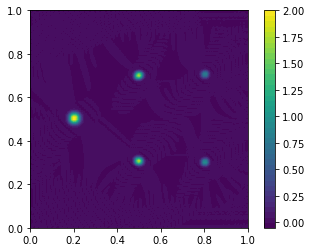

t = 1.61: error = 0.00254
1.9697761888425063
-0.03334033450502059


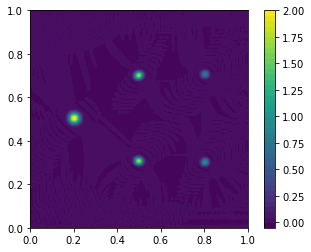

t = 1.61: error = 0.00254
1.968255227989142
-0.03334060015890336


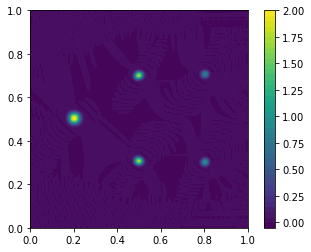

t = 1.61: error = 0.00254
1.9667387638549922
-0.03334086755938337


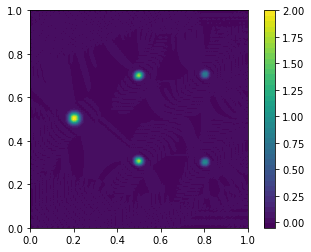

t = 1.61: error = 0.00254
1.9652267743370375
-0.03334113560462144


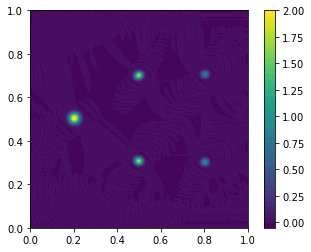

t = 1.62: error = 0.00254
1.9637192379293047
-0.03334140251071665


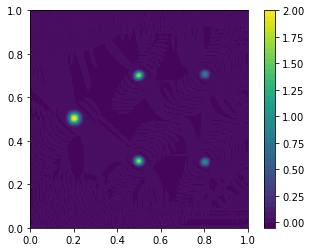

t = 1.62: error = 0.00254
1.9622161336708936
-0.03334166662150316


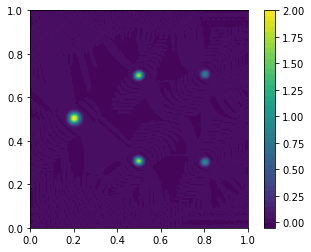

t = 1.62: error = 0.00254
1.9607174410958146
-0.033341927196630206


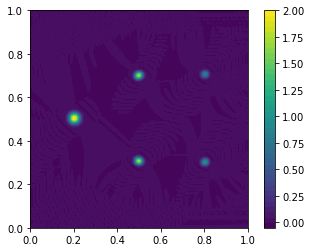

t = 1.62: error = 0.00254
1.959223140181673
-0.03334218479871043


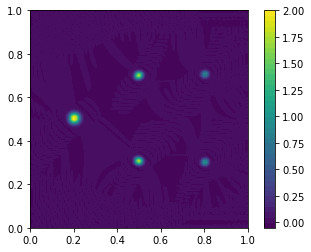

t = 1.62: error = 0.00254
1.9577332112957482
-0.03334244104191619


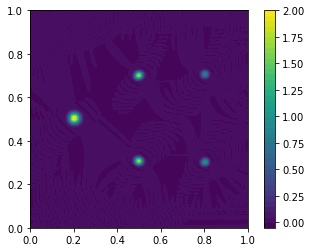

t = 1.63: error = 0.00254
1.9562476351386129
-0.033342697801859535


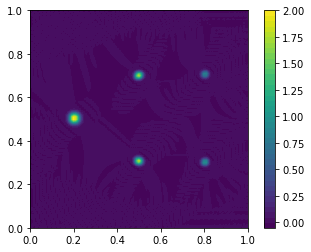

t = 1.63: error = 0.00254
1.9547663926869283
-0.03334295631020336


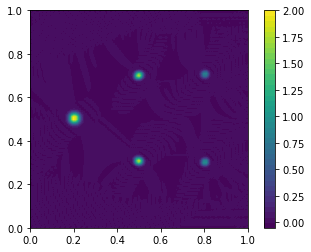

t = 1.63: error = 0.00254
1.9532894651381545
-0.03334321659901963


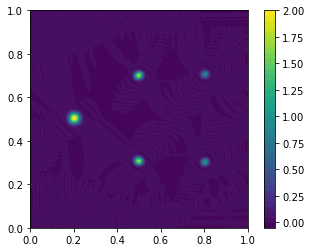

t = 1.63: error = 0.00254
1.9518168338604314
-0.03334347751190212


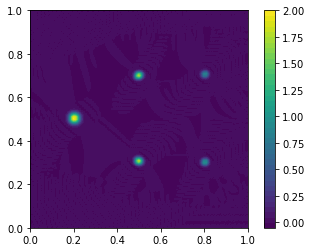

t = 1.63: error = 0.00254
1.9503484803507802
-0.033343737227873566


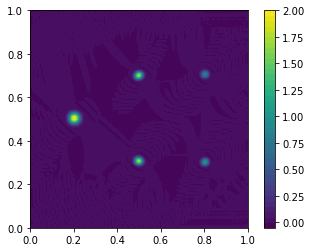

t = 1.64: error = 0.00254
1.9488843862040115
-0.03334399408303951


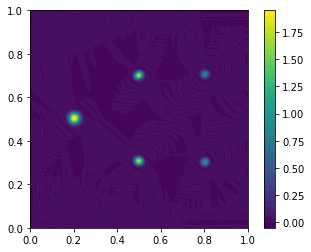

t = 1.64: error = 0.00254
1.9474245330935835
-0.03334424735574277


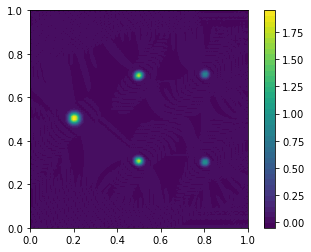

t = 1.64: error = 0.00254
1.9459689027643257
-0.03334449763618118


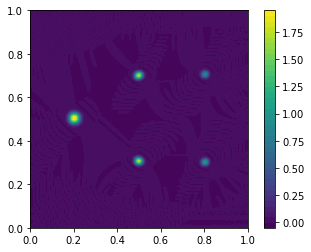

t = 1.64: error = 0.00254
1.9445174770356737
-0.03334474655590897


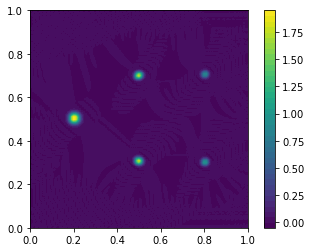

t = 1.64: error = 0.00254
1.9430702378131046
-0.03334499599328692


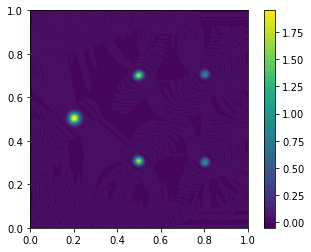

t = 1.65: error = 0.00254
1.9416271671048566
-0.03334524717980975


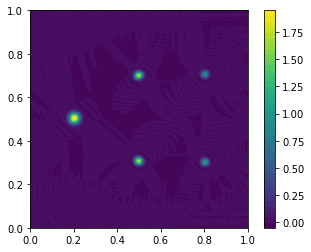

t = 1.65: error = 0.00254
1.9401882470408012
-0.03334550015457583


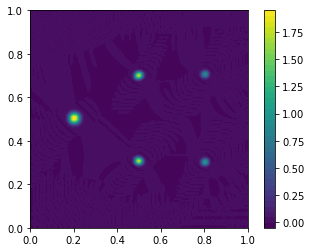

t = 1.65: error = 0.00254
1.9387534598904808
-0.03334575377150494


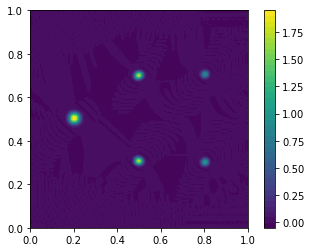

t = 1.65: error = 0.00254
1.9373227880777242
-0.03334600621311274


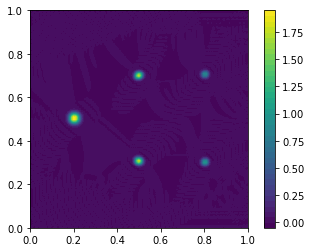

t = 1.65: error = 0.00254
1.9358962141898142
-0.03334625581457443


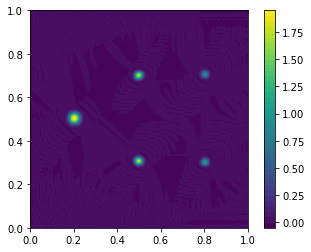

t = 1.66: error = 0.00254
1.9344737209799485
-0.03334650186721562


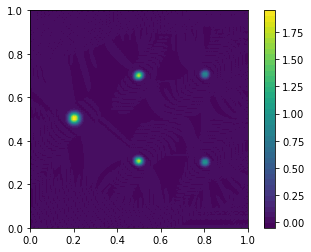

t = 1.66: error = 0.00254
1.9330552913625723
-0.033346745006455285


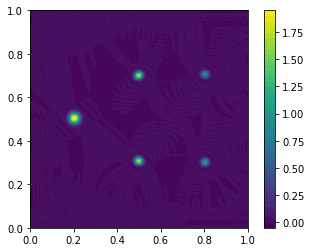

t = 1.66: error = 0.00254
1.931640908402207
-0.03334698693829552


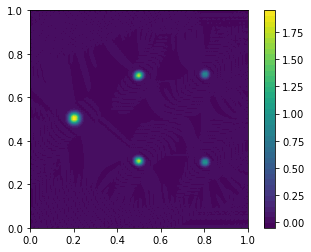

t = 1.66: error = 0.00254
1.9302305552975223
-0.03334722961545782


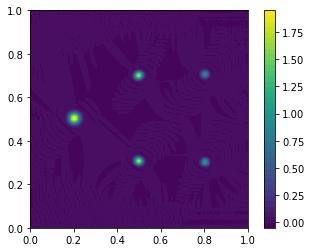

t = 1.66: error = 0.00254
1.9288242153635158
-0.03334747430510204


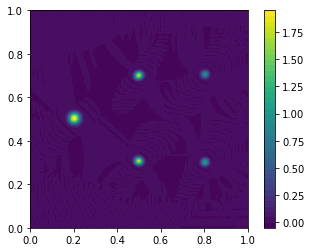

t = 1.67: error = 0.00254
1.9274218720155742
-0.03334772101978932


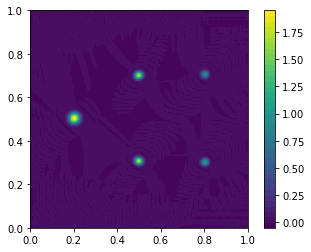

t = 1.67: error = 0.00254
1.9260235087595439
-0.03334796852863224


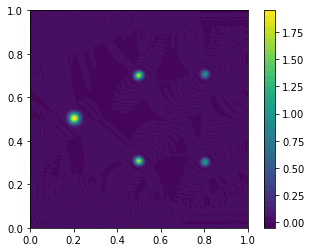

t = 1.67: error = 0.00254
1.924629109191597
-0.03334821489749157


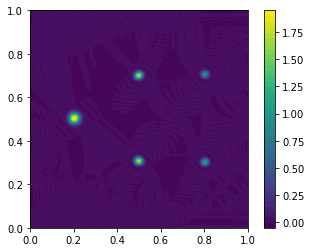

t = 1.67: error = 0.00254
1.9232386570104008
-0.033348458347701525


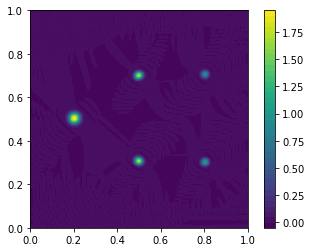

t = 1.67: error = 0.00254
1.921852136042195
-0.03334869808964736


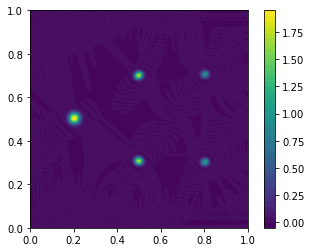

t = 1.68: error = 0.00254
1.9204695302769714
-0.03334893472877588


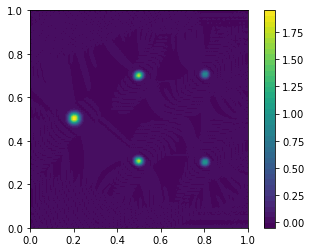

t = 1.68: error = 0.00254
1.919090823911735
-0.0333491699931926


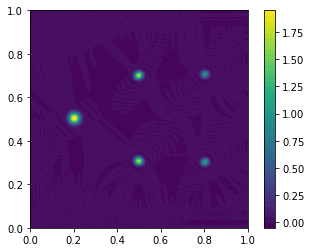

t = 1.68: error = 0.00254
1.9177160013951042
-0.03334940589111563


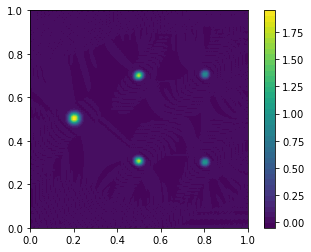

t = 1.68: error = 0.00254
1.9163450474667998
-0.03334964374834464


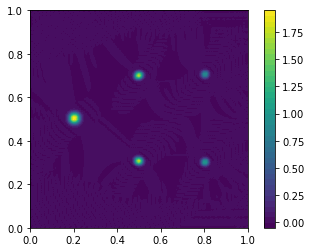

t = 1.68: error = 0.00255
1.9149779471858743
-0.03334988360811153


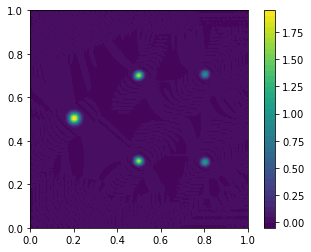

t = 1.69: error = 0.00255
1.9136146859429173
-0.03335012422746513


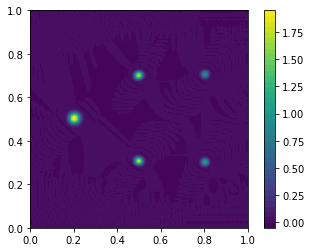

t = 1.69: error = 0.00255
1.9122552494535323
-0.03335036363196557


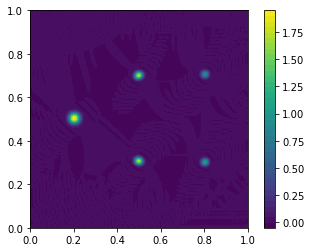

t = 1.69: error = 0.00255
1.910899623732749
-0.033350600011233175


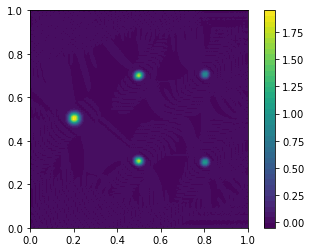

t = 1.69: error = 0.00255
1.909547795052392
-0.03335083258489477


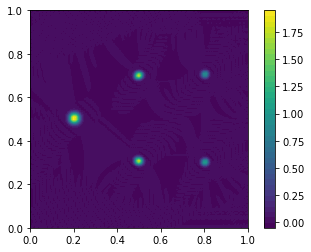

t = 1.69: error = 0.00255
1.9081997498852885
-0.03335106201256175


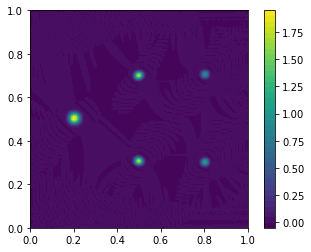

t = 1.70: error = 0.00255
1.9068554748415076
-0.0333512900994779


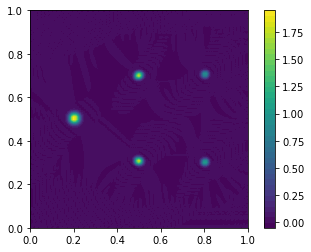

t = 1.70: error = 0.00255
1.9055149566023881
-0.033351518928783304


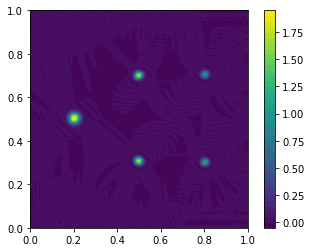

t = 1.70: error = 0.00255
1.9041781818579795
-0.033351749885113795


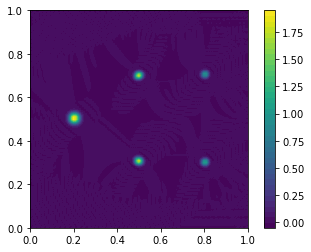

t = 1.70: error = 0.00255
1.9028451372528883
-0.03335198304969747


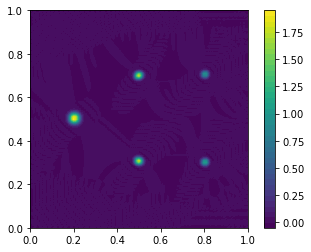

t = 1.70: error = 0.00255
1.9015158093443882
-0.03335221719056921


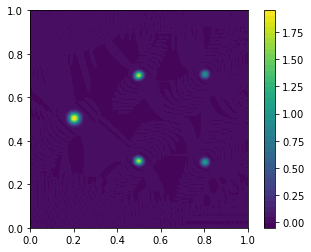

t = 1.71: error = 0.00255
1.9001901845753426
-0.0333524503077489


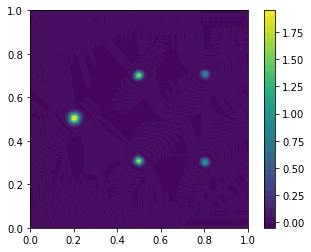

t = 1.71: error = 0.00255
1.898868249263063
-0.03335268052949919


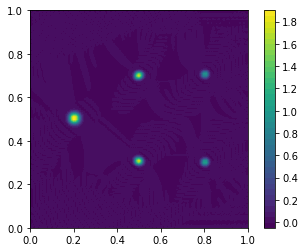

t = 1.71: error = 0.00255
1.89754998960389
-0.033352907001385934


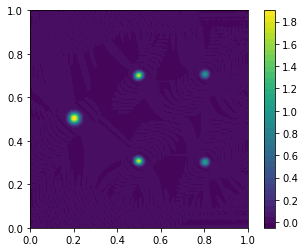

t = 1.71: error = 0.00255
1.8962353916920256
-0.03335313033478979


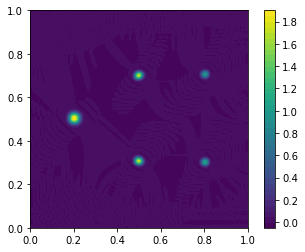

t = 1.71: error = 0.00255
1.8949244415501048
-0.033353352339033936


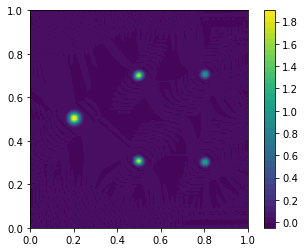

t = 1.72: error = 0.00255
1.893617125168041
-0.0333535751428154


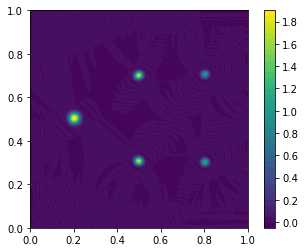

t = 1.72: error = 0.00255
1.8923134285459133
-0.033353800174800455


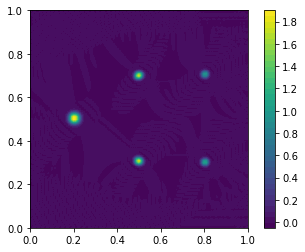

t = 1.72: error = 0.00255
1.8910133377360558
-0.033354027519811764


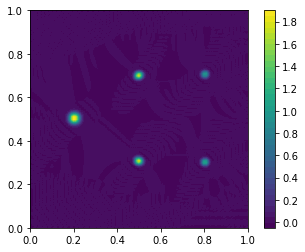

t = 1.72: error = 0.00255
1.889716838879284
-0.03335425589940609


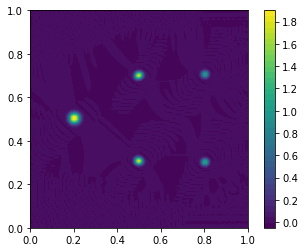

t = 1.72: error = 0.00255
1.8884239182304734
-0.03335448323388784


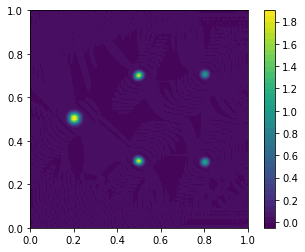

t = 1.73: error = 0.00255
1.887134562169698
-0.03335470756500502


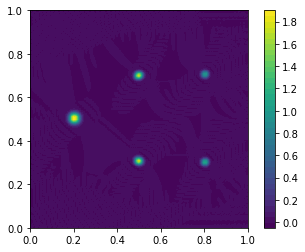

t = 1.73: error = 0.00255
1.8858487571968836
-0.033354927969934646


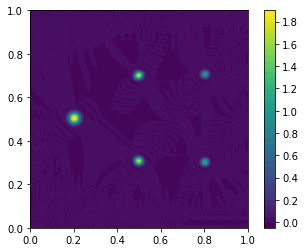

t = 1.73: error = 0.00255
1.8845664899102887
-0.03335514502673981


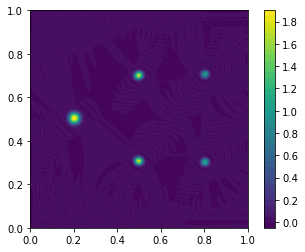

t = 1.73: error = 0.00255
1.8832877469718128
-0.03335536055087123


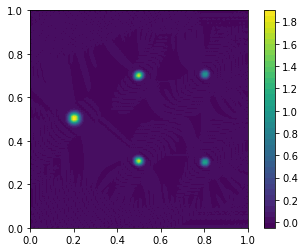

t = 1.73: error = 0.00255
1.8820125150646023
-0.03335557671024248


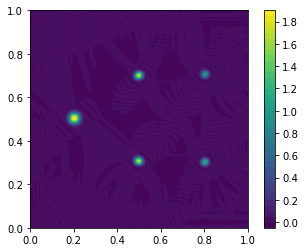

t = 1.74: error = 0.00255
1.8807407808502812
-0.03335579499689377


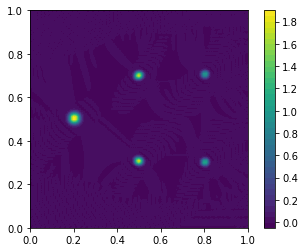

t = 1.74: error = 0.00255
1.8794725309338332
-0.033356015567934175


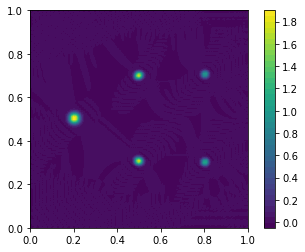

t = 1.74: error = 0.00255
1.8782077518434688
-0.033356237201918285


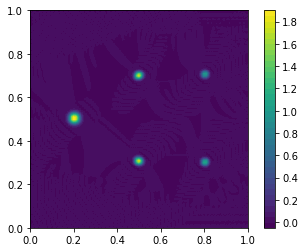

t = 1.74: error = 0.00255
1.8769464300307892
-0.03335645784107871


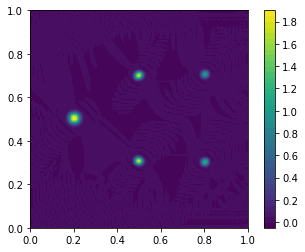

t = 1.74: error = 0.00255
1.8756885518933766
-0.03335667551925145


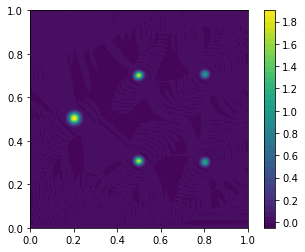

t = 1.75: error = 0.00255
1.8744341038182064
-0.033356889306040284


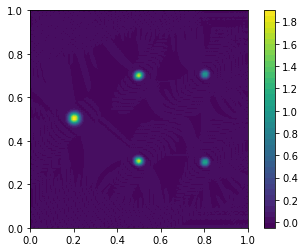

t = 1.75: error = 0.00255
1.8731830722406426
-0.03335709980330346


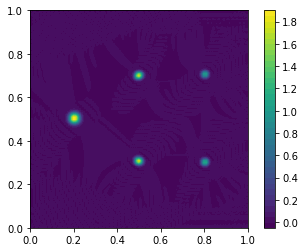

t = 1.75: error = 0.00255
1.871935443710895
-0.033357308887161714


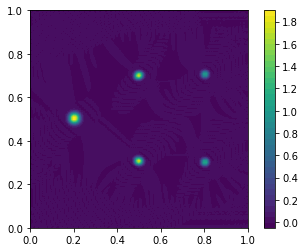

t = 1.75: error = 0.00255
1.8706912049583542
-0.03335751879765926


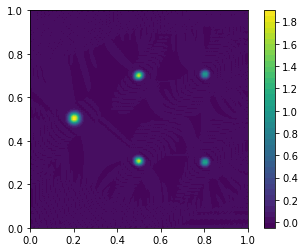

t = 1.75: error = 0.00255
1.8694503429443745
-0.03335773107262632


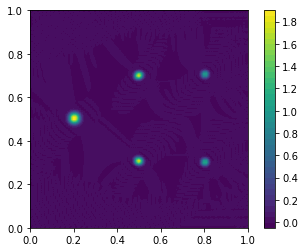

t = 1.76: error = 0.00254
1.868212844895996
-0.033357945859132355


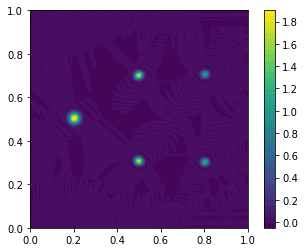

t = 1.76: error = 0.00254
1.8669786983163024
-0.033358161862978984


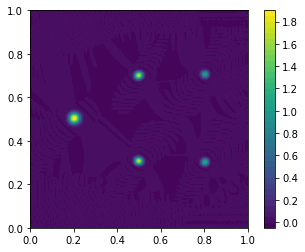

t = 1.76: error = 0.00254
1.86574789097111
-0.033358376911449814


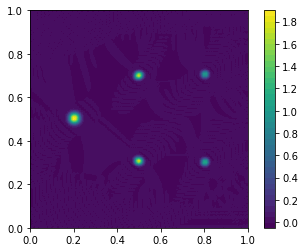

t = 1.76: error = 0.00254
1.864520410855586
-0.033358588923284666


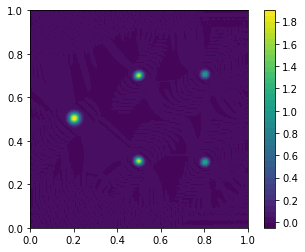

t = 1.76: error = 0.00254
1.8632962461474936
-0.03335879689704194


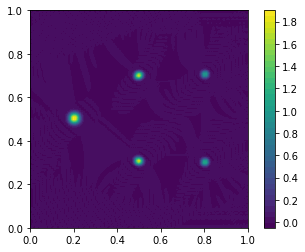

t = 1.77: error = 0.00254
1.8620753851554226
-0.03335900143094499


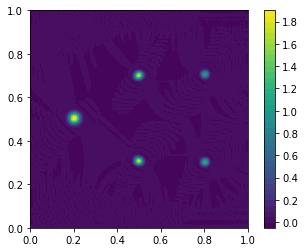

t = 1.77: error = 0.00254
1.8608578162703406
-0.03335920445700305


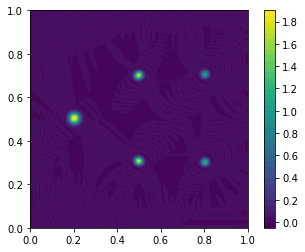

t = 1.77: error = 0.00254
1.8596435279271457
-0.033359408297337786


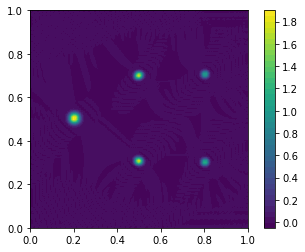

t = 1.77: error = 0.00254
1.8584325085800248
-0.03335961455650333


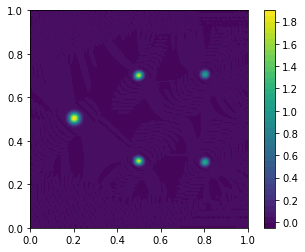

t = 1.77: error = 0.00254
1.857224746692004
-0.033359823409464896


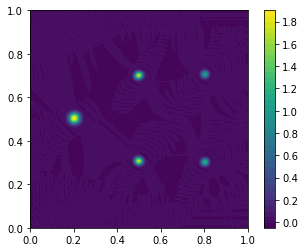

t = 1.78: error = 0.00254
1.8560202307358176
-0.03336003355655747


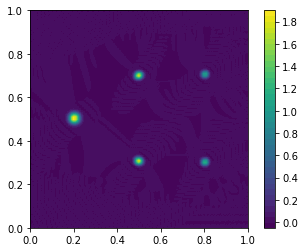

t = 1.78: error = 0.00253
1.8548189492008507
-0.03336024280851361


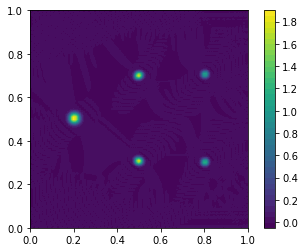

t = 1.78: error = 0.00253
1.8536208905999547
-0.03336044907439182


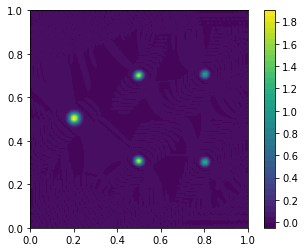

t = 1.78: error = 0.00253
1.8524260434706137
-0.03336065135518863


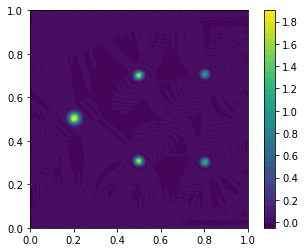

t = 1.78: error = 0.00253
1.8512343963670677
-0.03336085026201249


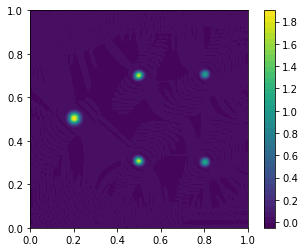

t = 1.79: error = 0.00253
1.8500459378430996
-0.033361047747628006


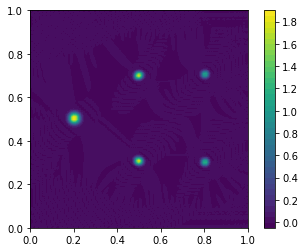

t = 1.79: error = 0.00253
1.848860656428348
-0.033361246164002656


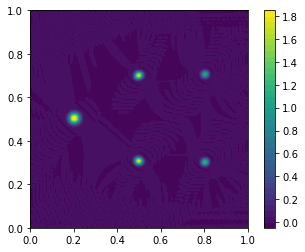

t = 1.79: error = 0.00253
1.8476785406034781
-0.03336144715278857


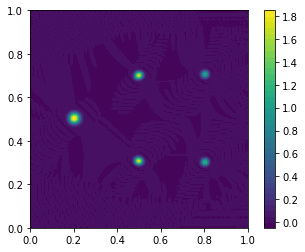

t = 1.79: error = 0.00253
1.8464995787805216
-0.033361650913749055


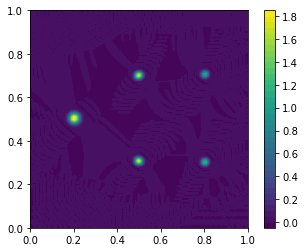

t = 1.79: error = 0.00252
1.8453237592940839
-0.033361856122677114


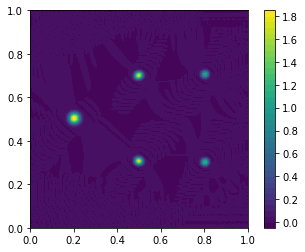

t = 1.80: error = 0.00252
1.8441510704069164
-0.033362060490497954


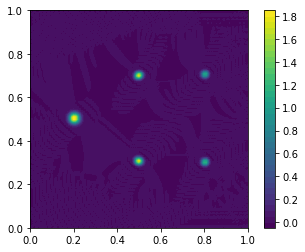

t = 1.80: error = 0.00252
1.8429815003304155
-0.033362261769437414


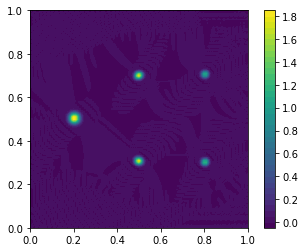

t = 1.80: error = 0.00252
1.8418150372575064
-0.033362458809031804


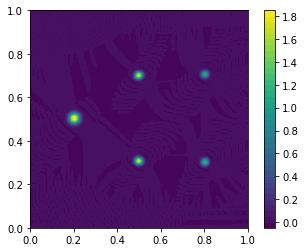

t = 1.80: error = 0.00252
1.8406516694030972
-0.03336265214345583


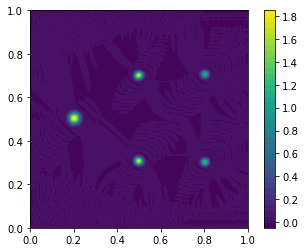

t = 1.80: error = 0.00252
1.8394913850462065
-0.033362843754329775


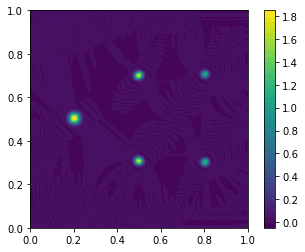

t = 1.81: error = 0.00252
1.838334172568164
-0.03336303610185542


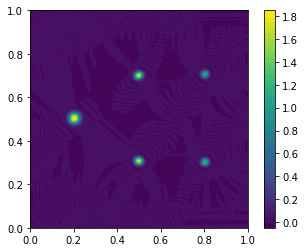

t = 1.81: error = 0.00251
1.8371800204827542
-0.033363230954760605


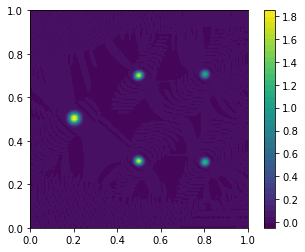

t = 1.81: error = 0.00251
1.8360289174562046
-0.03336342861893866


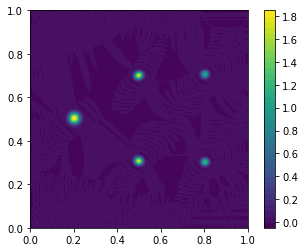

t = 1.81: error = 0.00251
1.8348808523170466
-0.033363627849487314


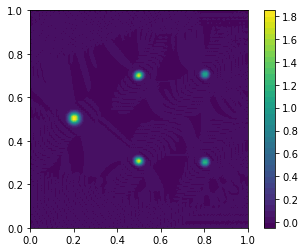

t = 1.81: error = 0.00251
1.833735814057463
-0.03336382640868706


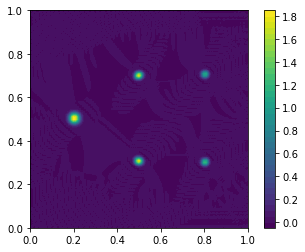

t = 1.82: error = 0.00251
1.832593791828479
-0.03336402205772112


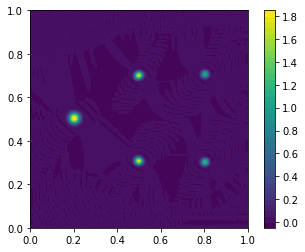

t = 1.82: error = 0.0025
1.8314547749312862
-0.03336421360526294


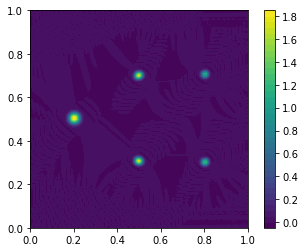

t = 1.82: error = 0.0025
1.8303187528061573
-0.03336440151527109


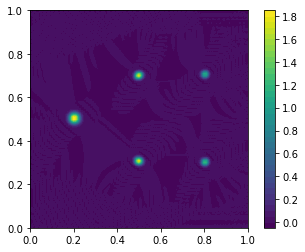

t = 1.82: error = 0.0025
1.8291857150192585
-0.03336458770825236


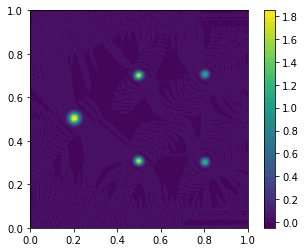

t = 1.82: error = 0.0025
1.8280556512466037
-0.033364774619570256


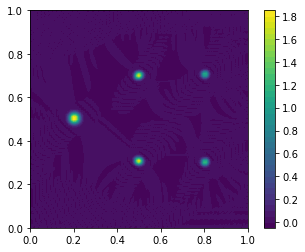

t = 1.83: error = 0.0025
1.8269285512537723
-0.03336496403133449


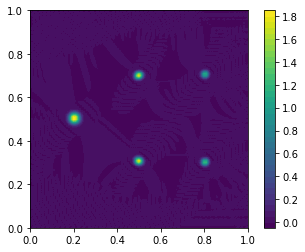

t = 1.83: error = 0.0025
1.8258044048700943
-0.03336515628466906


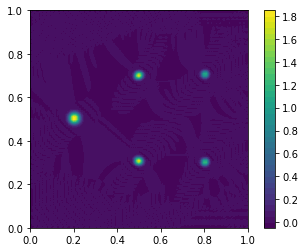

t = 1.83: error = 0.00249
1.82468320195685
-0.03336535016795583


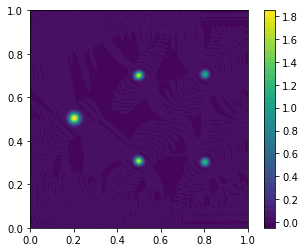

t = 1.83: error = 0.00249
1.8235649323704373
-0.03336554345336591


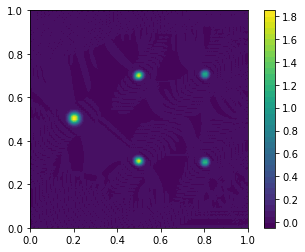

t = 1.83: error = 0.00249
1.8224495859230578
-0.03336573388125746


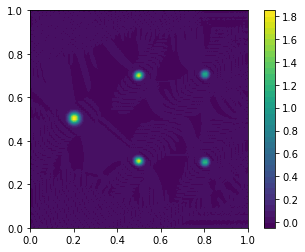

t = 1.84: error = 0.00249
1.8213371523449158
-0.033365920220889494


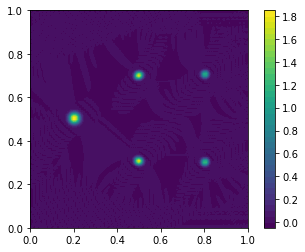

t = 1.84: error = 0.00248
1.8202276212527102
-0.03336610290066623


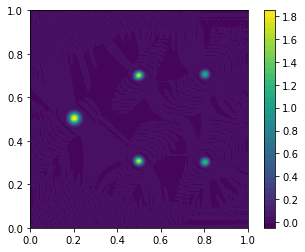

t = 1.84: error = 0.00248
1.8191209821291965
-0.03336628382398385


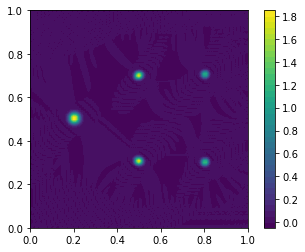

t = 1.84: error = 0.00248
1.8180172243177413
-0.03336646542479487


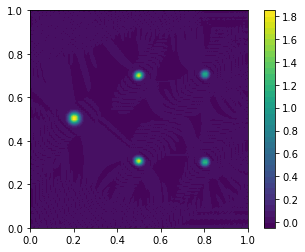

t = 1.84: error = 0.00248
1.81691633703427
-0.03336664948288966


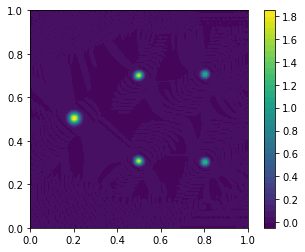

t = 1.85: error = 0.00248
1.8158183093971056
-0.033366836306536175


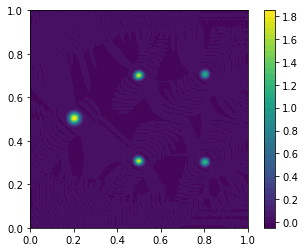

t = 1.85: error = 0.00247
1.814723130473268
-0.03336702460930604


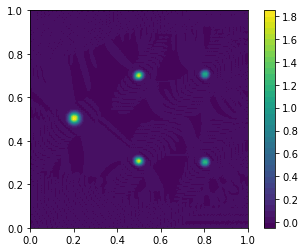

t = 1.85: error = 0.00247
1.813630789338027
-0.033367212085417354


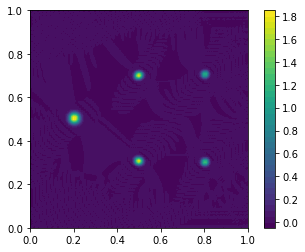

t = 1.85: error = 0.00247
1.8125412751431345
-0.03336739646656836


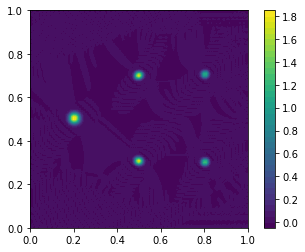

t = 1.85: error = 0.00247
1.8114545771882082
-0.033367576626977744


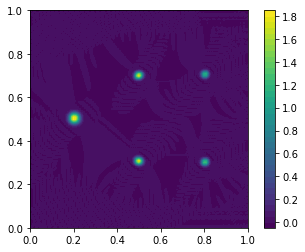

t = 1.86: error = 0.00246
1.8103706849892625
-0.03336775318772813


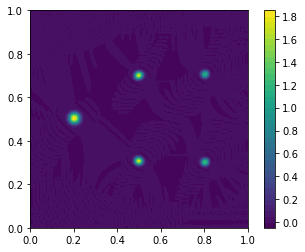

t = 1.86: error = 0.00246
1.8092895883383562
-0.03336792825485202


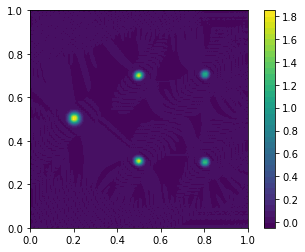

t = 1.86: error = 0.00246
1.8082112773488517
-0.03336810439895009


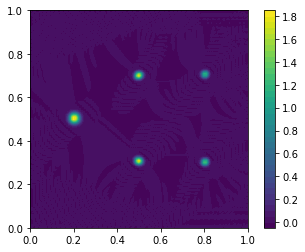

t = 1.86: error = 0.00246
1.8071357424817058
-0.03336828343494217


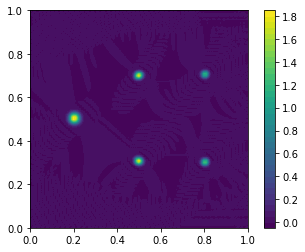

t = 1.86: error = 0.00245
1.8060629745497065
-0.03336846561464976


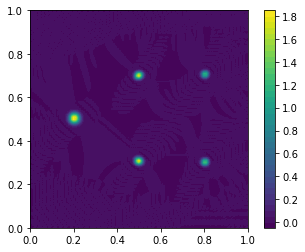

t = 1.87: error = 0.00245
1.8049929646984124
-0.03336864953780208


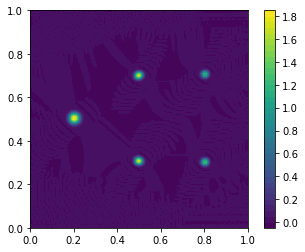

t = 1.87: error = 0.00245
1.8039257043647996
-0.03336883276300809


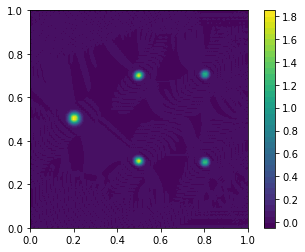

t = 1.87: error = 0.00245
1.8028611852169691
-0.033369012893729226


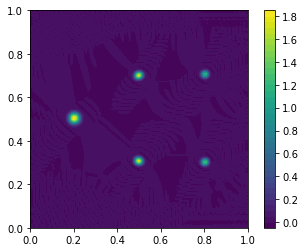

t = 1.87: error = 0.00244
1.8017993990805403
-0.033369188708065864


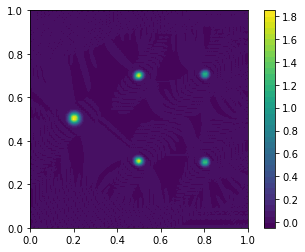

t = 1.87: error = 0.00244
1.8007403378591287
-0.033413213588012185


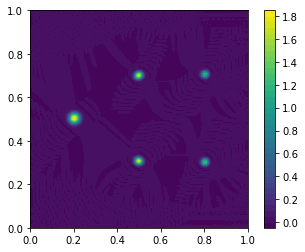

t = 1.88: error = 0.00244
1.7996839934572304
-0.03347501144845269


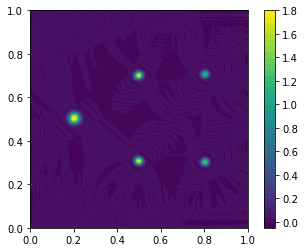

t = 1.88: error = 0.00243
1.7986303577135798
-0.033536699042547864


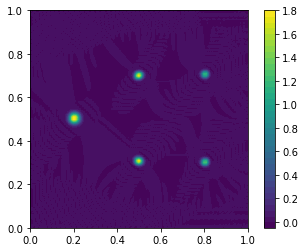

t = 1.88: error = 0.00243
1.797579422351557
-0.03359827574186856


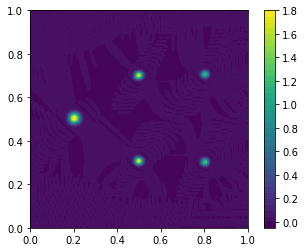

t = 1.88: error = 0.00243
1.7965311789506588
-0.03365974092435711


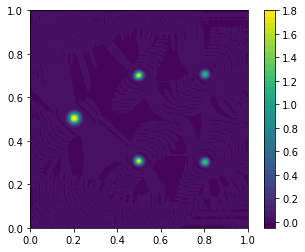

t = 1.88: error = 0.00243
1.7954856189399349
-0.033721093976273625


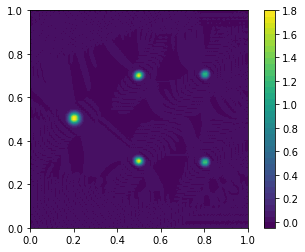

t = 1.89: error = 0.00242
1.7944427336111752
-0.033782334292879725


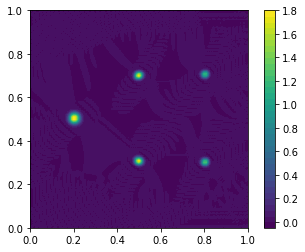

t = 1.89: error = 0.00242
1.7934025141471825
-0.033843461277540426


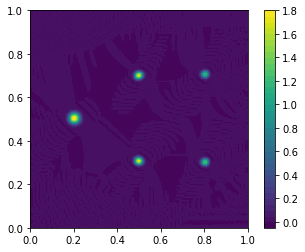

t = 1.89: error = 0.00242
1.7923649516589244
-0.03390447433964566


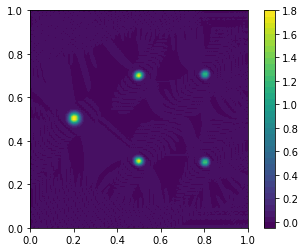

t = 1.89: error = 0.00241
1.7913300372248766
-0.033965372892318206


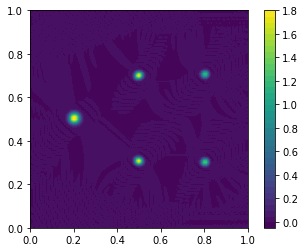

t = 1.89: error = 0.00241
1.7902977619261822
-0.03402615635100109


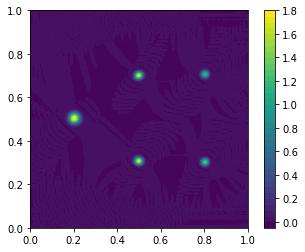

t = 1.90: error = 0.00241
1.7892681168721853
-0.0340868241336051


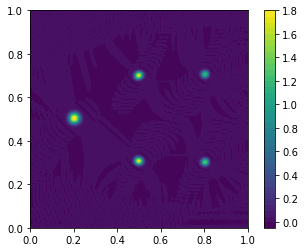

t = 1.90: error = 0.0024
1.7882410932122303
-0.03414737566214508


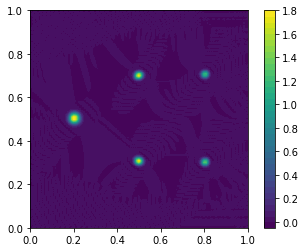

t = 1.90: error = 0.0024
1.78721668213135
-0.03420781036509279


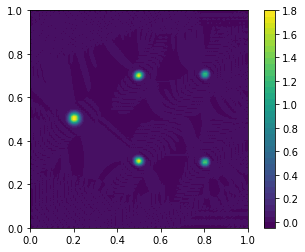

t = 1.90: error = 0.0024
1.7861948748295988
-0.03426812767936087


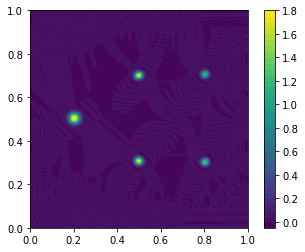

t = 1.90: error = 0.00239
1.7851756624873105
-0.03432832705101215


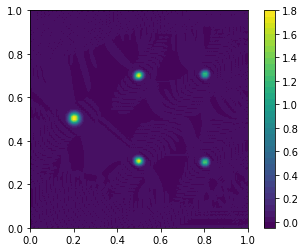

t = 1.91: error = 0.00239
1.7841590362211572
-0.0343884079343637


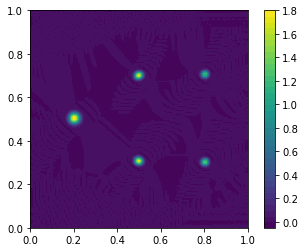

t = 1.91: error = 0.00239
1.783144987038149
-0.034448369789886336


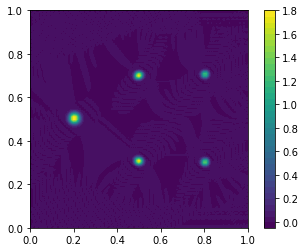

t = 1.91: error = 0.00238
1.7821335057959748
-0.034508212081878646


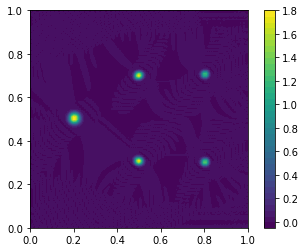

t = 1.91: error = 0.00238
1.7811245831779703
-0.03456793427702456


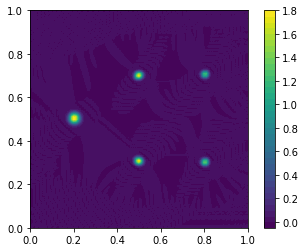

t = 1.91: error = 0.00238
1.780118209689274
-0.034627535844528476


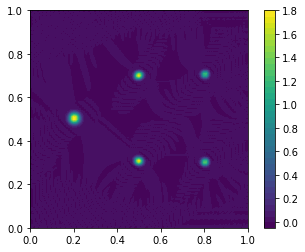

t = 1.92: error = 0.00237
1.7791143756776584
-0.03468701625775946


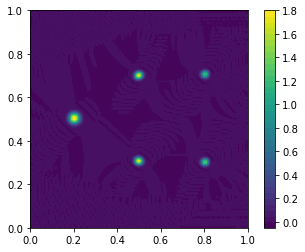

t = 1.92: error = 0.00237
1.778113071378682
-0.034746374996625425


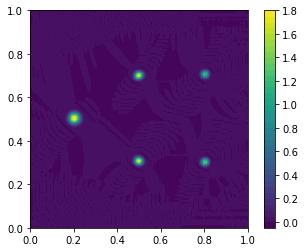

t = 1.92: error = 0.00237
1.7771142869809222
-0.03480561154957706


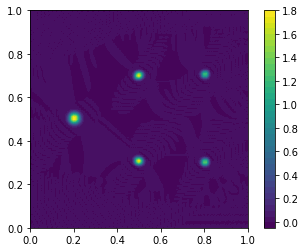

t = 1.92: error = 0.00236
1.7761180127039264
-0.034864725414323866


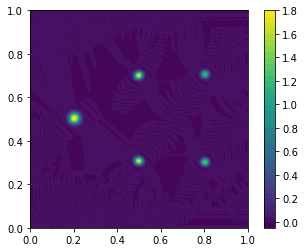

t = 1.92: error = 0.00236
1.7751242388796142
-0.034923716096925114


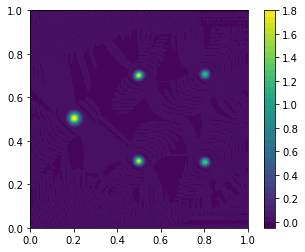

t = 1.93: error = 0.00236
1.7741329560275436
-0.034982583109660716


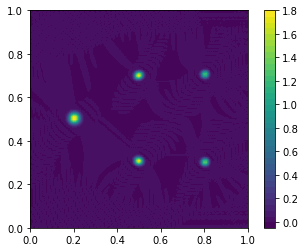

t = 1.93: error = 0.00235
1.7731441549155513
-0.03504132596867091


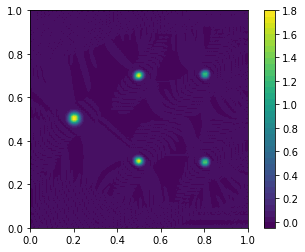

t = 1.93: error = 0.00235
1.7721578265996063
-0.03509994419248711


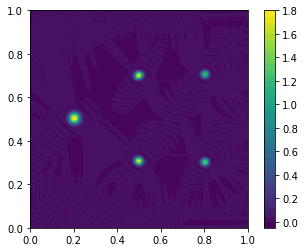

t = 1.93: error = 0.00235
1.7711739624397163
-0.035158437302155746


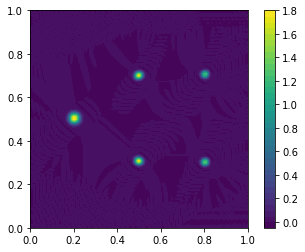

t = 1.93: error = 0.00234
1.7701925540919823
-0.03521680482288803


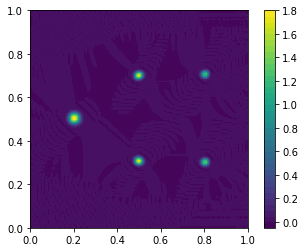

t = 1.94: error = 0.00234
1.7692135934798734
-0.03527504628645014


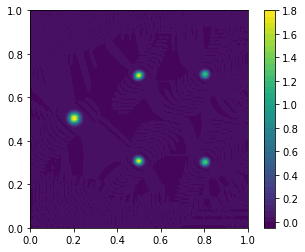

t = 1.94: error = 0.00234
1.7682370727500696
-0.03533316123318332


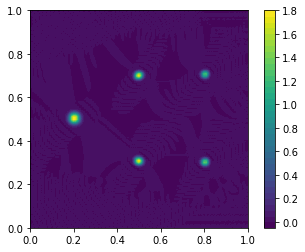

t = 1.94: error = 0.00233
1.76726298421956
-0.03539114921272422


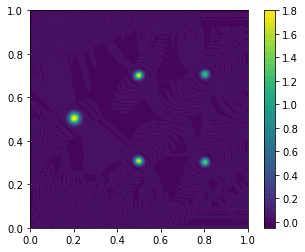

t = 1.94: error = 0.00233
1.7662913203209507
-0.03544900978308202


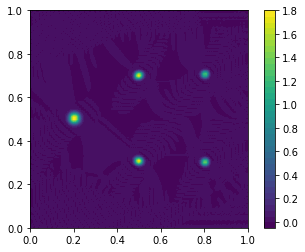

t = 1.94: error = 0.00232
1.7653220735521453
-0.03550674250847751


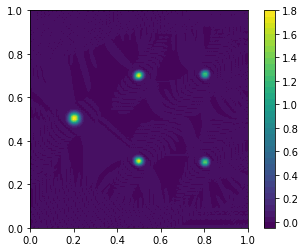

t = 1.95: error = 0.00232
1.7643552364350075
-0.035564346956946616


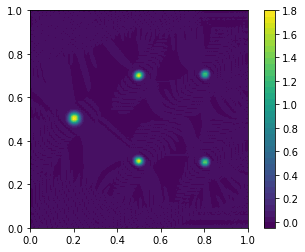

t = 1.95: error = 0.00232
1.7633908014855935
-0.035621822698846985


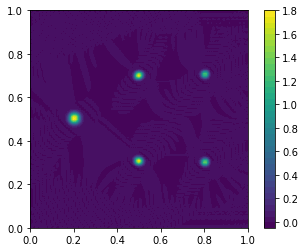

t = 1.95: error = 0.00231
1.7624287611963747
-0.0356791693069839


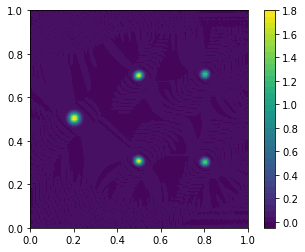

t = 1.95: error = 0.00231
1.761469108029055
-0.035736386358289705


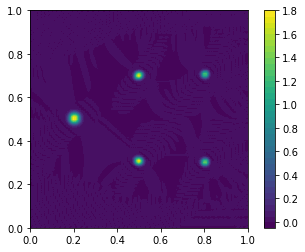

t = 1.95: error = 0.0023
1.7605118344152448
-0.03579347343625959


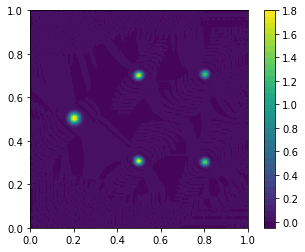

t = 1.96: error = 0.0023
1.7595569327615646
-0.03585043013301376


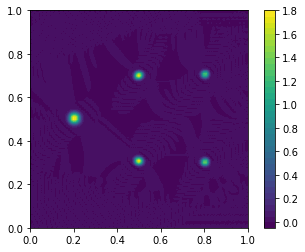

t = 1.96: error = 0.0023
1.7586043954557493
-0.03590725605003894


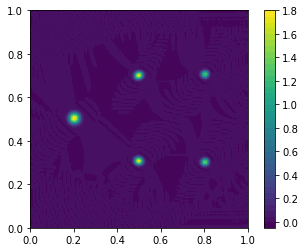

t = 1.96: error = 0.00229
1.7576542148708687
-0.035963950797254327


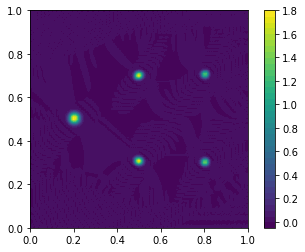

t = 1.96: error = 0.00229
1.7567063833657868
-0.036020513990810174


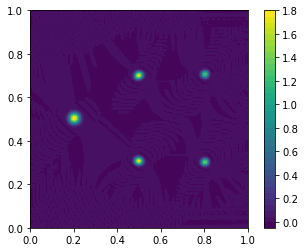

t = 1.96: error = 0.00228
1.7557608932812512
-0.03607694525063666


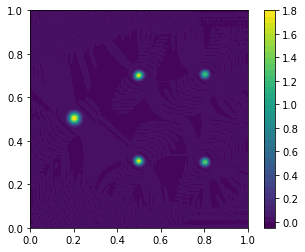

t = 1.97: error = 0.00228
1.7548177369324525
-0.03613324419890542


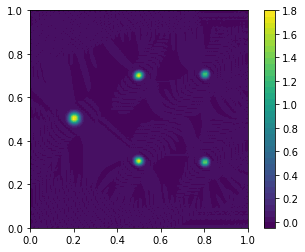

t = 1.97: error = 0.00228
1.7538769066001885
-0.036189410460138086


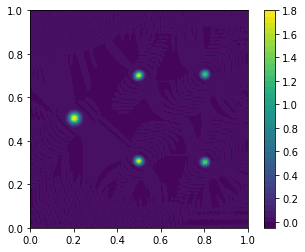

t = 1.97: error = 0.00227
1.7529383945238037
-0.0362454436628997


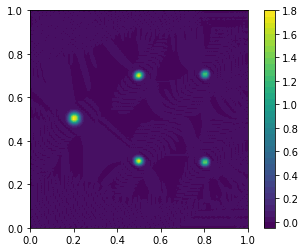

t = 1.97: error = 0.00227
1.7520021928994232
-0.03630134344226746


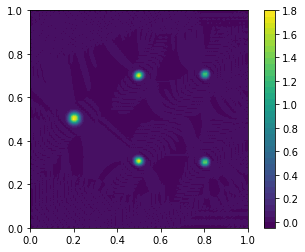

t = 1.97: error = 0.00226
1.7510682938865996
-0.0363571094419244


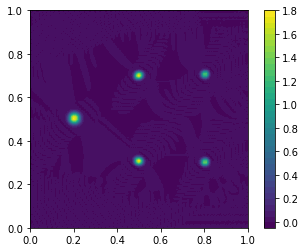

t = 1.98: error = 0.00226
1.7501366896252544
-0.036412741314911665


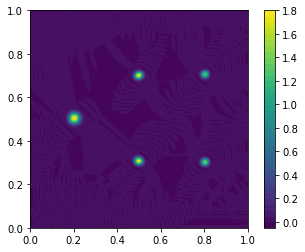

t = 1.98: error = 0.00226
1.7492073722628783
-0.03646823872267514


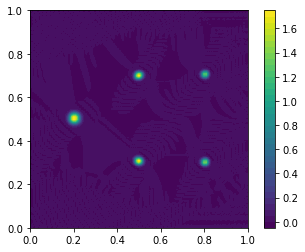

t = 1.98: error = 0.00225
1.7482803339898345
-0.03652360133282047


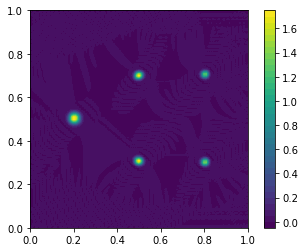

t = 1.98: error = 0.00225
1.7473555670787642
-0.03657882881661026


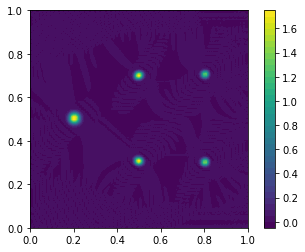

t = 1.98: error = 0.00224
1.7464330639229064
-0.03663392084738945


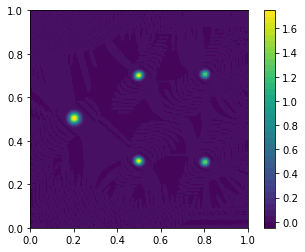

t = 1.99: error = 0.00224
1.7455128170680296
-0.036688877100689125


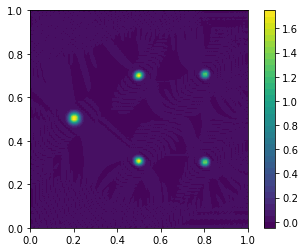

t = 1.99: error = 0.00223
1.7445948192334317
-0.03674369725594916


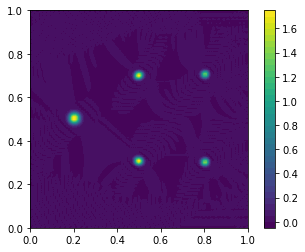

t = 1.99: error = 0.00223
1.7436790633190271
-0.0367983809990398


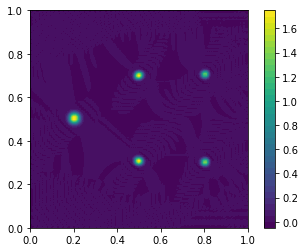

t = 1.99: error = 0.00223
1.742765542397365
-0.03685292802441017


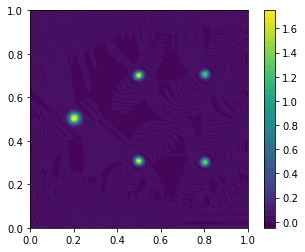

t = 1.99: error = 0.00222
1.7418542496912437
-0.036907338035876945


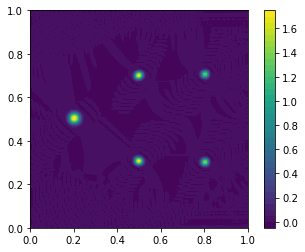

t = 2.00: error = 0.00222
1.7409451785390149
-0.036961610745674646


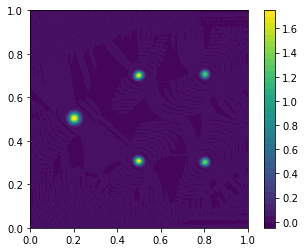

t = 2.00: error = 0.00221
1.740038322350703
-0.0370157458721794


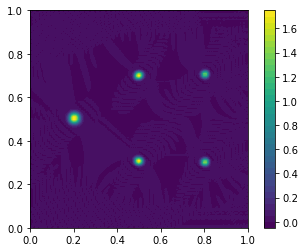

t = 2.00: error = 0.00221
1.7391336745586135
-0.03706974313735359


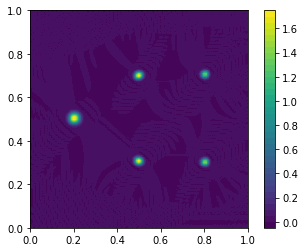

1.7391336745586135
-0.03706974313735359


In [114]:
%matplotlib inline
import matplotlib.pyplot as plt


zero = Constant(0)
bc = DirichletBC(Vhat, zero, boundary)

u = TrialFunction(Vhat)  # here it is just defined as an unknown to define a.
v = TestFunction(Vhat)
u_n = Function(Vhat)
R = Function(Vhat)
V2Fct = Function(Vhat) 

u_n = interpolate(UiFct, Vhat) # initial value

plt.figure()
p = plot(u_n)
plt.colorbar(p)
plt.show()

T = 2.0  # final time
num_step = 1000
dt = T / num_step
k = 1./dt
tol = 1e-10

R.vector()[:] = R1(u_n)
V2Fct.vector()[:] = v2(u_n)

# print(nabla_grad(v1())*(1,0) )

F = dot((u-u_n)*k,v)*dx + nu * dot(grad(u), grad(v)) * dx + dot(nabla_grad(v1())*u, nabla_grad(v)) * dx - \
    dot( R*u, v) * dx - dot(V2Fct*u, v.dx(0))* dx - dot(Constant(0), v.dx(1))* dx
#F = dot((u-u_n)*k,v)*dx + nu * dot(grad(u), grad(v)) * dx + dot(nabla_grad(v1())*u, nabla_grad(v)) * dx - \
#    dot( R*u, v) * dx - dot(V2Fct*u, nabla_grad(v)) * dx
# - dot( v2(u), grad(v)) * dx
# - dot( R(u), v) * dx
# - dot( v2(u), grad(v)) * dx
# - dot( Adv(u), grad(v)) * dx
# dot(nabla_grad(zlogFct)*u, nabla_grad(v)) * dx

u = Function(Vhat)
a = lhs(F)
L = rhs(F)
t = 0
# solve(a == L, u, bc)
# plt.figure()
# p = plot(u)
# plt.colorbar(p)
# plt.show()

for n in range(num_step):
    R.vector()[:] = R1(u_n)
    V2Fct.vector()[:] = v2(u_n)
    t+=dt
    solve(a == L, u, bc)
    u_e = interpolate(u_n, Vhat)
    error = np.abs(u_e.vector().get_local() - u.vector().get_local()).max()
    print('t = %.2f: error = %.3g' % (t, error))
    if (error < tol):
        break
    print(max(u.vector()))
    print(min(u.vector()))
    plt.figure()
    p = plot(u)
    plt.colorbar(p)
    plt.show()
    u_n.assign(u)
    
# print(u.vector().get_local().shape)
print(max(u.vector()))
print(min(u.vector()))

# plot(u)

In [112]:
# print(u)
r = R1(UiFct)
print(r.shape)
# r = r.reshape((N+1,N+1))
R = Function(Vhat)
R.vector()[:] = r
plt.figure()
plot(R*u)

# rct = Expression('1 + pow(2, x[0])', degree=2)
# plt.figure()
# plot(rct)

(14641,)


RuntimeError: Don't know how to plot given object:
  f_10472 * f_12018
and projection failed:
  '<' not supported between instances of 'Mesh' and 'Mesh'

<Figure size 432x288 with 0 Axes>

(14641,)


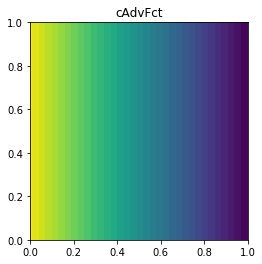

(14641,)


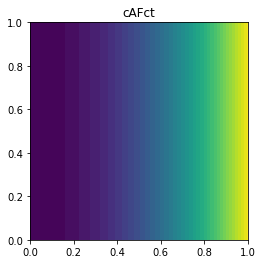

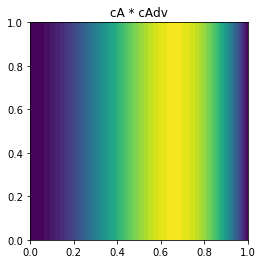

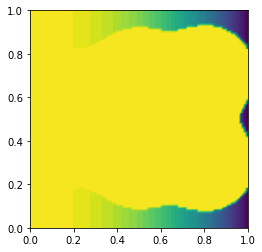

In [113]:
def v2(u_):
    cAdv = cDthFct.vector().get_local()
    cA = cAFct.vector().get_local()
    cRct = cRctFct.vector().get_local()
    return cA*(1-cAdv)*cRct#, 0 * cA*(1-cAdv)*cRct

# def v3(u_):
#     cAdv = cDthFct.vector().get_local()
#     cA = cAFct.vector().get_local()
#     cRct = cRctFct.vector().get_local()
#     return cA*(1-cAdv)*cRct

def R1(u_):
    uv = u_.vector().get_local()
    cDth = cDthFct.vector().get_local()
    cRct = cRctFct.vector().get_local()
    temp = (cDth * uv)
    temp[temp > dbar] = dbar
    temp = (1 - temp)*cRct
    return temp
# Differtiation rate
# Needs to be 1d --> np-ravel
def a(x_,y_):
    return 0.5*(1 - x_/max(x_))

# PT/ direction of the differentiation
def c_k_x(x_, y_):
    return x_**2

def c_k_y(x_, y_):
    return 0


cAdvMat = np.array(a(np.ravel(X), np.ravel(Y)))
cAdvMat = cAdvMat.reshape(X.shape)
cAdvFct = Function(Vhat)
cAdvMat = interpMat2(N, M, cAdvMat.T)
cAdvFct.vector()[:] = cAdvMat
print(cAdvMat.shape)
plt.figure()
plot(cAdvFct)
plt.title('cAdvFct')
plt.show()


cAMat = np.array(c_k_x(np.ravel(X), np.ravel(Y)))
cAMat = cAMat.reshape(X.shape)
cAFct = Function(Vhat)
cAMat = interpMat2(N, M, cAMat.T)
cAFct.vector()[:] = cAMat
print(cAMat.shape)
plt.figure()
plot(cAFct)
plt.title('cAFct')
plt.show()

plt.figure()
plot(cAFct*cAdvFct)
plt.title('cA * cAdv')
plt.show()

Vhat2d = VectorFunctionSpace(mesh, 'P', 1)
V2Fct = Function(Vhat) 
V2Fct.vector()[:] = v2(u)
plot(V2Fct)
# cRctMat = np.array(rct(np.ravel(X), np.ravel(Y)))
# cRctMat = cRctMat.reshape(X.shape)
# # plt.figure()
# # plt.matshow(cRctMat)
# cRctFct = Function(Vhat)
# cRctMat = interpMat2(N, M, cRctMat.T)
# cRctFct.vector()[:] = cRctMat
# print(cRctMat.shape)
# plt.figure()
# plot(cRctFct)
# plt.title('cRctFct')
# plt.show()

